# Sibur task 1

[Страница задания](https://sibur.ai-community.com/competitions/4/tasks/11)
***

На нефтехимические заводы СИБУР сырье (широкая фракция легких углеводородов - ШФЛУ) поступает по трубопроводу. Трубопровод наполняется на нескольких станциях подкачки, которые расположены последовательно на пути к потребителю.

Состав ШФЛУ меняется на каждой станции с течением времени и, таким образом, меняется итоговый состав ШФЛУ, которую получает потребитель. Имея достоверный прогноз по составу можно оптимизировать некоторые технологические процессы.

Вам предстоит построить прогноз состава поступающей по трубопроводу ШФЛУ на основании данных с последней перед потребителем станции подкачки. При этом геометрия трубопровода, расстояние от станции подкачки до потребителя и другие параметры трубопровода не раскрываются.

Метрикой в этой задаче служит средняя по всем целевым переменным MAPE.

***
Данные содержат расходы сырья в т/ч для станции подкачки A (A_rate) и потребителя B (B_rate), а также массовые процентные доли различных компонент на станции A (A_CH4, A_C2H6, A_C3H8, A_iC4H10, A_nC4H10, A_iC5H12, A_nC5H12, A_C6H14).

Целевые переменные: массовые процентные доли нескольких компонент на станции B (B_C2H6, B_C3H8, B_iC4H10, B_nC4H10). Целевые переменные для тестового периода не содержат разрывов, поэтому загружаемое решение должно содержать все временные метки из тестового множества.

train_targets.csv - целевые переменные для тренировочного множества
train_features.csv - признаки для тренировочного множества
test_features.csv - признаки для тестового множества
sample_submission.csv - пример решения в правильном формате

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import statsmodels.api as sm

from time import time
import datetime
import pickle
from tqdm.notebook import tqdm
from statsmodels.tsa.seasonal import STL
import statsmodels.tsa.stattools as sts

In [2]:
import warnings
warnings.filterwarnings("ignore")
pd.options.display.max_colwidth = 200

## EDA

In [3]:
feat_train = pd.read_csv('train_features.csv')
target_train = pd.read_csv('train_targets.csv')
feat_test = pd.read_csv('test_features.csv')
sample_sub = pd.read_csv('sample_submission.csv')

target_feats = ['B_C2H6', 'B_C3H8', 'B_iC4H10', 'B_nC4H10']
not_train_target_feats = ['A_rate', 'A_CH4', 'A_iC5H12', 'A_nC5H12', 'A_C6H14', 'B_rate']
train_feats = ['A_rate', 'A_CH4','A_C2H6', 'A_C3H8', 'A_iC4H10', 'A_nC4H10', 'A_iC5H12', 'A_nC5H12', 'A_C6H14', 'B_rate']
df_train = pd.concat([feat_train, target_train[target_feats]], axis=1)[9:]

In [ ]:
print(feat_train.shape)
feat_train.head()

In [5]:
print(target_train.shape)
target_train.head()

(5808, 5)


,timestamp,B_C2H6,B_C3H8,B_iC4H10,B_nC4H10
0,2020-01-01 00:00:00,4.561979,39.015486,17.250740,24.301793
1,2020-01-01 00:30:00,4.550741,39.048915,17.229506,24.257461
2,2020-01-01 01:00:00,4.506793,38.766378,17.171621,24.236298
3,2020-01-01 01:30:00,4.584963,39.069360,17.218521,24.149843
4,2020-01-01 02:00:00,4.607483,38.817579,17.108668,24.049510


In [6]:
print(feat_test.shape)
feat_test.head()

(3984, 11)


,timestamp,A_rate,A_CH4,A_C2H6,A_C3H8,A_iC4H10,A_nC4H10,A_iC5H12,A_nC5H12,A_C6H14,B_rate
0,2020-05-01 00:00:00,71.428342,0.267832,5.135159,36.816480,16.632260,24.062587,5.696004,4.939430,6.395286,74.273009
1,2020-05-01 00:30:00,70.925118,0.268464,5.149646,36.869023,16.651870,24.069800,5.676384,4.911872,6.346957,74.061833
2,2020-05-01 01:00:00,70.991719,0.270641,5.154615,37.074965,16.710967,24.106152,5.574873,4.808516,6.242636,73.856268
3,2020-05-01 01:30:00,70.972406,0.275241,5.230661,37.384180,16.683337,24.021993,5.514843,4.730887,6.101647,73.750744
4,2020-05-01 02:00:00,70.980078,0.275062,5.241437,37.448587,16.663863,24.003237,5.524898,4.728882,6.057119,73.698447


Для массовой доли газов около 1000 пропущенных значений

In [7]:
target_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5808 entries, 0 to 5807
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   timestamp  5808 non-null   object 
 1   B_C2H6     5624 non-null   float64
 2   B_C3H8     5628 non-null   float64
 3   B_iC4H10   5628 non-null   float64
 4   B_nC4H10   5628 non-null   float64
dtypes: float64(4), object(1)
memory usage: 227.0+ KB


Для массовой доли газов около 140 пропущенных значений

Уберем первые 4 часа(8 значений). Так как у нас нет значений для газов у производителя.

In [9]:
df_train.head()

,timestamp,A_rate,A_CH4,A_C2H6,A_C3H8,A_iC4H10,A_nC4H10,A_iC5H12,A_nC5H12,A_C6H14,B_rate,B_C2H6,B_C3H8,B_iC4H10,B_nC4H10
9,2020-01-01 04:30:00,71.055792,0.126244,5.242957,41.941480,17.064213,23.205953,4.184848,4.062079,4.110170,71.389674,4.532649,38.604149,17.238489,24.275393
10,2020-01-01 05:00:00,71.029881,0.111301,4.632455,39.198330,17.440245,24.331520,4.615703,4.545702,5.072316,71.792506,4.578543,38.510623,17.193441,24.242152
11,2020-01-01 05:30:00,71.008884,0.125176,4.730933,37.874656,17.353362,24.567692,4.847911,4.818913,5.626975,71.939558,4.642879,39.124029,17.301609,24.211492
12,2020-01-01 06:00:00,71.060109,0.141546,5.214231,39.763493,17.098163,23.758240,4.512244,4.429068,5.021207,72.124690,4.549837,38.247333,17.118282,24.044074
13,2020-01-01 06:30:00,71.067865,0.143911,5.440833,41.616510,16.964787,23.121613,4.212636,4.088066,4.347822,72.278288,4.556611,37.985776,17.038811,23.931490


In [10]:
train_feats[1:-1]

['A_CH4',
 'A_C2H6',
 'A_C3H8',
 'A_iC4H10',
 'A_nC4H10',
 'A_iC5H12',
 'A_nC5H12',
 'A_C6H14']

In [11]:
feat_train[train_feats[6]]

0            NaN
1            NaN
2            NaN
3            NaN
4            NaN
          ...   
5803    6.069360
5804    5.981357
5805    5.829363
5806    5.750492
5807    5.752792
Name: A_iC5H12, Length: 5808, dtype: float64

In [4]:
def plotPlantGases(df=df_train):
    plt.rcParams.update({'font.size': 14})
    plt.figure(figsize=(14,10))
    for i in range(1, len(train_feats[1:-1])):
        plt.plot(df['timestamp'], df[train_feats[i]]-df[train_feats[i]].mean(), label=train_feats[i])
    
    plt.ylim([-5,5])
    plt.title('Все газы на А')
    plt.legend()
    plt.xticks(np.arange(510))
    plt.ylabel('mass%')
    plt.xlabel('time')
    plt.style.use('seaborn-darkgrid')
    plt.show()

In [5]:
def plotTargetGases(df=df_train, b_feats=True, a_feats=True, rolling=False, window=0, title='Графики'):
    fig, ax = plt.subplots(ncols=2, nrows=2, sharex=True, figsize=(16, 10))
    
    if rolling and a_feats and b_feats:
        df[train_feats+target_feats] = df[train_feats+target_feats].rolling(window=window, min_periods=1).mean()
    elif rolling and a_feats and not b_feats:
        df[train_feats] = df[train_feats].rolling(window=window, min_periods=1).mean()
    if a_feats:
        ax[0,0].plot('timestamp', 'A_C2H6', label='A_C2H6', data=df)
    if b_feats:
        ax[0,0].plot('timestamp', 'B_C2H6', label='B_C2H6', data=df)
    ax[0,0].set_title('Доля этана')
    ax[0,0].set_ylim([0,10])
    ax[0,0].legend()

    if a_feats:
        ax[0,1].plot('timestamp', 'A_C3H8', label='A_C3H8', data=df)
    if b_feats:
        ax[0,1].plot('timestamp', 'B_C3H8', label='B_C3H8', data=df)
    ax[0,1].set_title('Доля пропана')
    ax[0,1].legend()
    ax[0,1].set_ylim([30,50])

    if a_feats:
        ax[1,0].plot('timestamp', 'A_iC4H10', label='A_iC4H10', data=df)
    if b_feats:
        ax[1,0].plot('timestamp', 'B_iC4H10', label='B_iC4H10', data=df)
    ax[1,0].set_title('Доля изобутана')
    ax[1,0].legend()
    ax[1,0].set_ylim([10,25])

    if a_feats:
        ax[1,1].plot('timestamp', 'A_nC4H10', label='A_nC4H10', data=df)
    if b_feats:
        ax[1,1].plot('timestamp', 'B_nC4H10', label='B_nC4H10', data=df)
    ax[1,1].set_title('Доля н-бутана')
    ax[1,1].legend()
    ax[1,1].set_ylim([20,40])
    
    plt.legend()
    plt.xticks(np.arange(5))
    plt.ylabel('mass%')
    plt.xlabel('time')
    plt.style.use('seaborn-darkgrid')
    fig.suptitle(title)
    plt.show()

In [6]:
def plotTrainGases(df, rolling=False, window=0, title='Графики'):
    fig, ax = plt.subplots(ncols=3, nrows=2, sharex=True, figsize=(16, 10))
    
    if rolling:
        df[not_train_target_feats] = df[not_train_target_feats].rolling(window=window, min_periods=1).mean()

    ax[0,0].plot('timestamp', 'A_rate', label='A_rate', data=df)
    ax[0,0].set_title('Скорость А')
    #ax[0,0].set_ylim([0,10])
    ax[0,0].legend()


    ax[0,1].plot('timestamp', 'A_CH4', label='A_CH4', data=df)
    ax[0,1].set_title('Доля метана')
    ax[0,1].legend()
    #ax[0,1].set_ylim([30,50])

    ax[0,2].plot('timestamp', 'A_iC5H12', label='A_iC5H12', data=df)
    ax[0,2].set_title('Доля изопентана')
    ax[0,2].legend()
    #ax[1,0].set_ylim([10,25])
    
    ax[1,0].plot('timestamp', 'B_rate', label='B_rate', data=df)
    ax[1,0].set_title('Скорость B')
    #ax[0,0].set_ylim([0,10])
    ax[1,0].legend()
    
    ax[1,1].plot('timestamp', 'A_nC5H12', label='A_nC5H12', data=df)
    ax[1,1].set_title('Доля н-пентана')
    ax[1,1].legend()
    #ax[1,1].set_ylim([20,40])
    
    ax[1,2].plot('timestamp', 'A_C6H14', label='A_C6H14', data=df)
    ax[1,2].set_title('Доля гексана')
    ax[1,2].legend()
    #ax[1,1].set_ylim([20,40])
    
    plt.legend()
    plt.xticks(np.arange(5))
    plt.ylabel('mass%')
    plt.xlabel('time')
    plt.style.use('seaborn-darkgrid')
    fig.suptitle(title)
    plt.show()

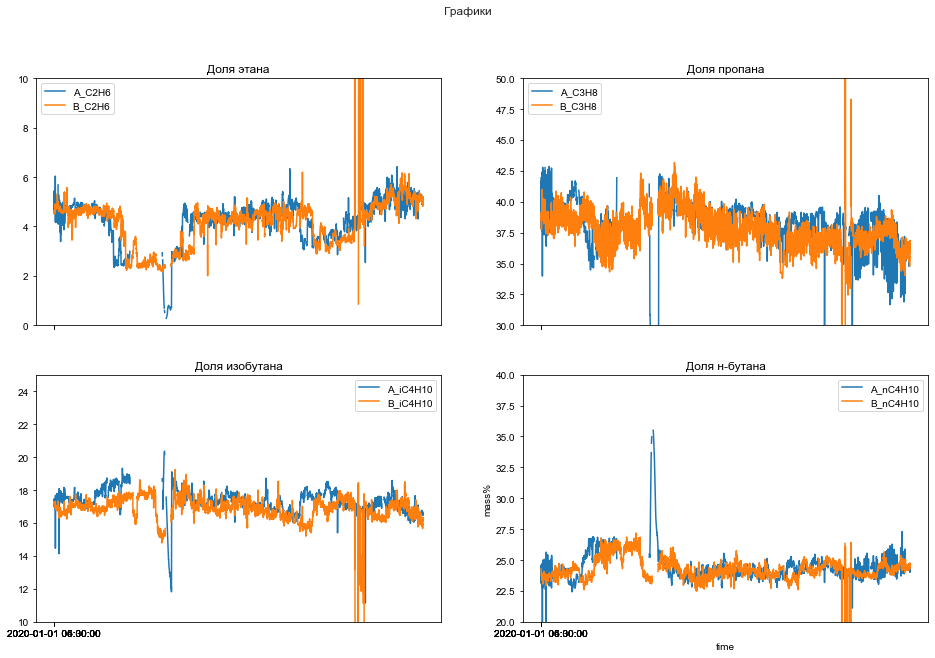

In [14]:
plotTargetGases()

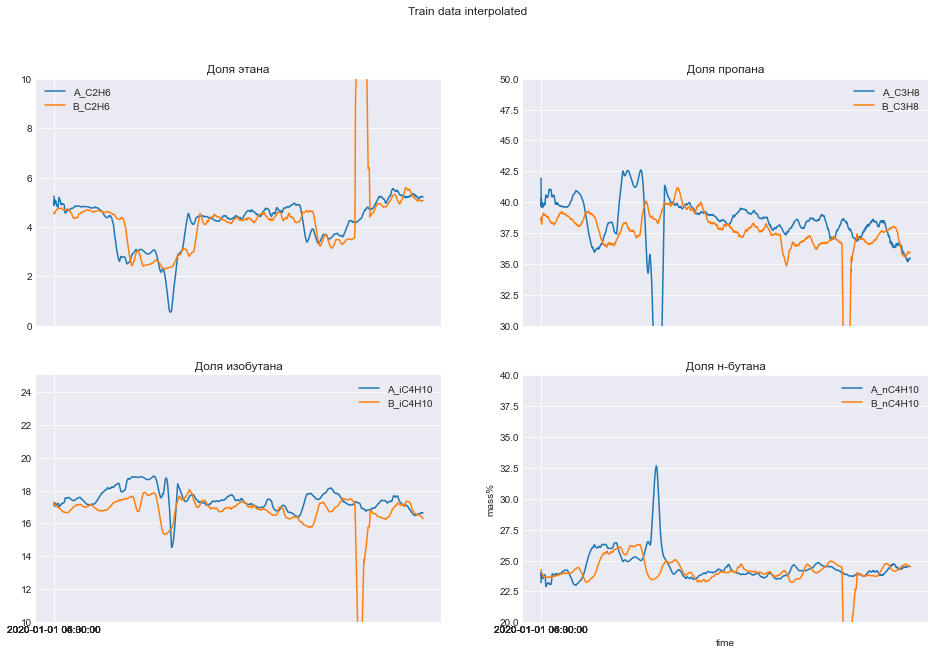

In [15]:
plotTargetGases(df_train.interpolate(axis=0, method='polynomial', order=3), 
                b_feats=True, a_feats=True, 
                rolling=True, window=96,
                title='Train data interpolated')

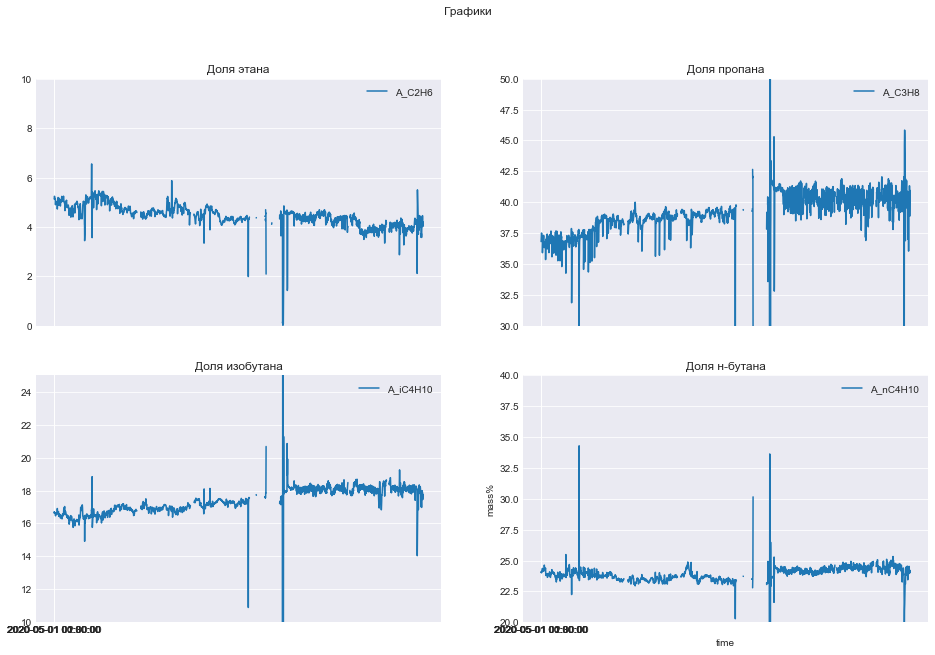

In [16]:
plotTargetGases(feat_test, False)

Для начала попробуем интерполировать данные для пропущенных участков. Построим прямые через две точки, каждая из которых усреднена по ближайшем 3 значениям. Плюс добавим случайного шума, чтобы выглядело максимально реально.

Позже побробовать настроить интерполяцию вручную

Надо удалить выбросы и их экстраполировать

In [7]:
def plotOneGas(df, gas):
    plt.figure(figsize=(10,8))
    plt.plot(df['timestamp'], df[gas])
    plt.title(gas)
    plt.legend()
    plt.xticks(np.arange(10))
    plt.ylabel('mass%')
    plt.xlabel('time')
    plt.style.use('seaborn-darkgrid')
    plt.show()

No handles with labels found to put in legend.


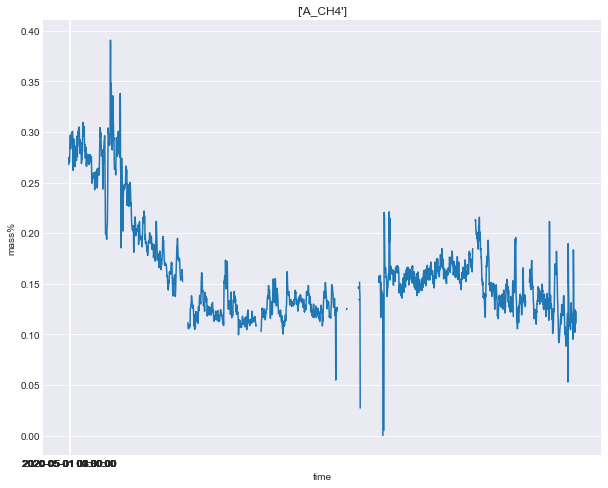

In [18]:
plotOneGas(feat_test, ['A_CH4'])

Функция для определения границ приемлемых значений для выбросов. Подбираем границы для каждого газа индивидуально.

In [8]:
feat_train = pd.read_csv('train_features.csv')
target_train = pd.read_csv('train_targets.csv')
feat_test = pd.read_csv('test_features.csv')
sample_sub = pd.read_csv('sample_submission.csv')

target_feats = ['B_C2H6', 'B_C3H8', 'B_iC4H10', 'B_nC4H10']
train_feats = ['A_rate', 'A_CH4','A_C2H6', 'A_C3H8', 'A_iC4H10', 'A_nC4H10', 'A_iC5H12', 'A_nC5H12', 'A_C6H14', 'B_rate']
df_train = pd.concat([feat_train, target_train[target_feats]], axis=1)[9:]

In [9]:
def checkBounds(df, gas, limits,inplace_train=False,inplace_test=False, window=144):
    df_c = df.copy(deep=True)
    perc = []
    
    for i, value in enumerate(df_c[gas].values):
        ratio = df_c[gas].values[i]/df_c[gas].values[i-1]
        if i>100:
            for_mean = [item for item in df_c[gas].values[i-50:i+50] if not pd.isnull(item)]
            means = np.mean(for_mean)
        else:
            for_mean_100 = [item for item in df_c[gas].values[:100] if not pd.isnull(item)]
            means = np.mean(for_mean_100)
            
        if (ratio>limits[1] or ratio<limits[0])\
        or (means*limits[1]<value or means*limits[0]>value)\
        or (for_mean_100*1.2<value or for_mean_100*0.8>value):
            perc.append(np.nan)
        else:
            perc.append(round(ratio, 2))
    perc[0]=1
    
    filtered = []
    for i, value in enumerate(perc):
        if pd.isnull(value):
            filtered.append(np.nan)
        else:
            filtered.append(df_c[gas].values[i])
    
    for i,value in enumerate(filtered):
        if i>100:
            for_mean = [item for item in df_c[gas].values[i-50:i+50] if not pd.isnull(item)]
            means = np.mean(for_mean)
        else:
            for_mean_100 = [item for item in df_c[gas].values[:50] if not pd.isnull(item)]
            means = np.mean(for_mean_100)
            
        if (means*limits[1]<value or means*limits[0]>value)\
        or (for_mean_100*1.2<value or for_mean_100*0.8>value):
            filtered[i] = np.nan
    filtered[:100] = np.ones(100)*np.mean([number for number in filtered[:100] if not pd.isnull(number)])
    df_c['filtered_gas'] = filtered
    
    #if df_c['filtered_gas'].interpolate(axis=0).rolling(window=window, min_periods=1).mean().isnull().sum().sum()!=0:
     #   print(limits)
     #   checkBounds(df, gas, [limits[0]-0.05,limits[1]+0.05],inplace_train=inplace_train,inplace_test=inplace_test, window=window)
    
    fig, ax = plt.subplots(ncols=2, nrows=2, sharex=True, figsize=(16, 10))
        
    ax[0,0].plot(df['timestamp'], df[gas])
    ax[0,0].plot(df_c['timestamp'], df_c['filtered_gas'].interpolate(axis=0).rolling(window=window, min_periods=1).mean())
    ax[0,0].set_title(gas)

    ax[0,1].plot(df_c['timestamp'], df_c['filtered_gas'])
    ax[0,1].set_title('Без выбросов')

    ax[1,0].plot(df_c['timestamp'], df_c['filtered_gas'].interpolate(axis=0))
    ax[1,0].set_title('Без выбросов + интерполяция')
    
    ax[1,1].plot(df_c['timestamp'], df_c['filtered_gas'].interpolate(axis=0).rolling(window=window, min_periods=1).mean())
    ax[1,1].set_title('Без выбр. + интерпол. + сглаж.')
    
    plt.xticks(np.arange(5))
    plt.xlabel('time')
    plt.style.use('seaborn-darkgrid')
    plt.show()
    if inplace_train:
        df_train[gas] = df_c['filtered_gas'].interpolate(axis=0).rolling(window=window, min_periods=1).mean()
    if inplace_test:
        feat_test[gas] = df_c['filtered_gas'].interpolate(axis=0).rolling(window=window, min_periods=1).mean()
    #fig = px.line(x=df_c['timestamp'], y=df_c[gas], title="Без выбросов")
    #fig.show()

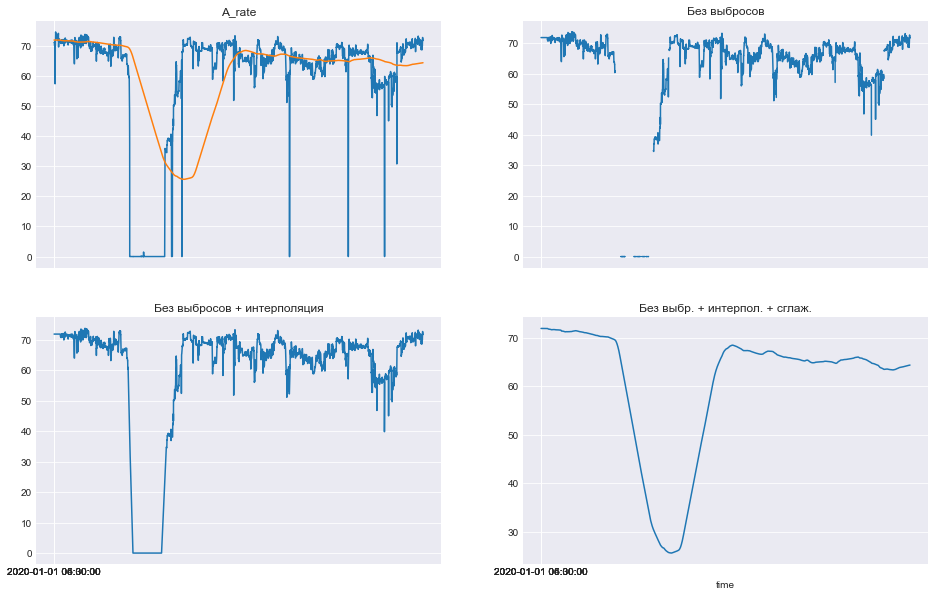

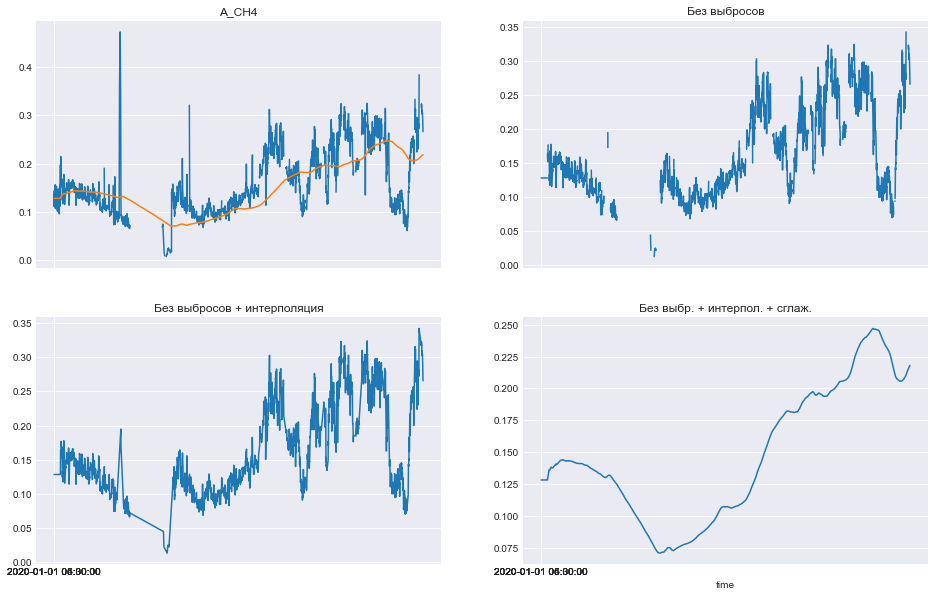

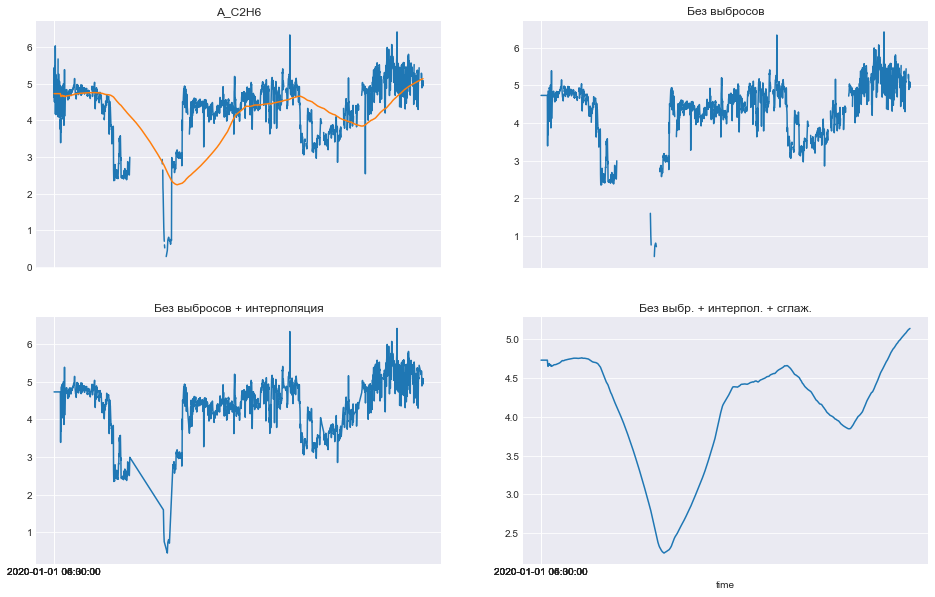

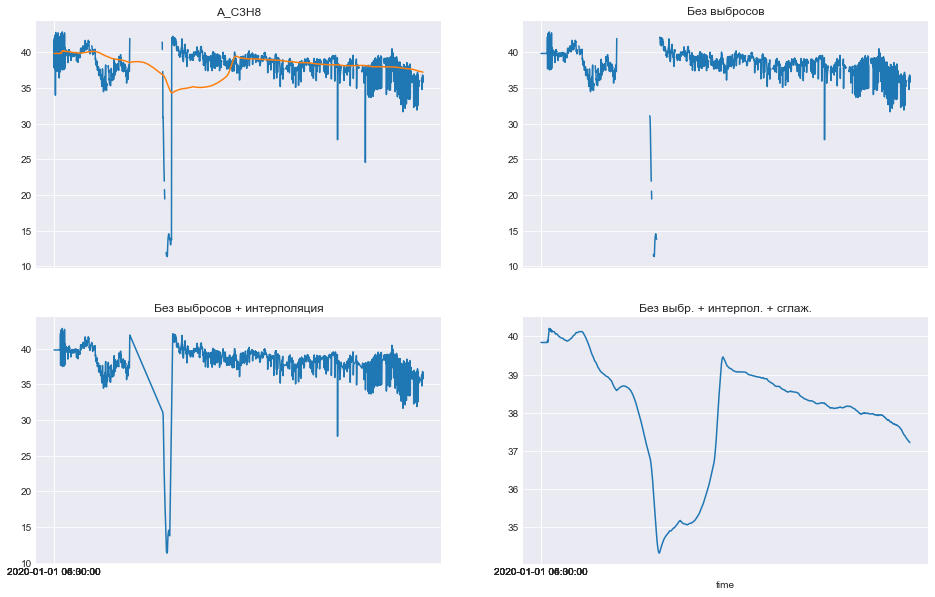

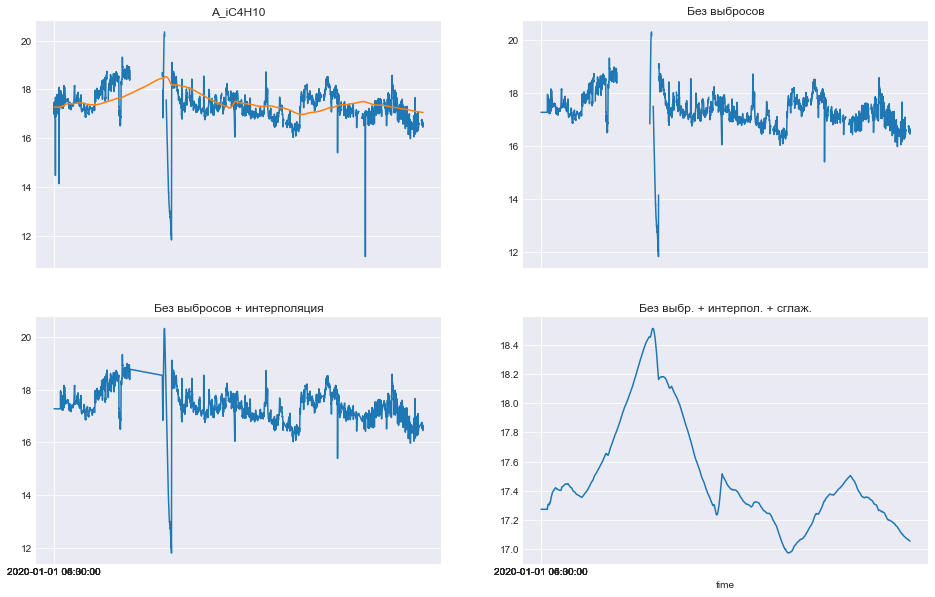

...

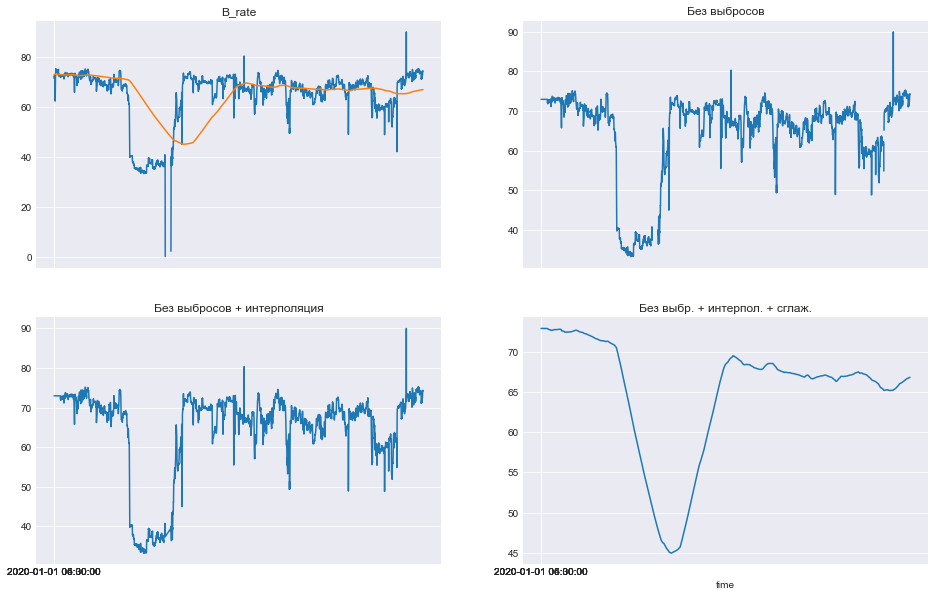

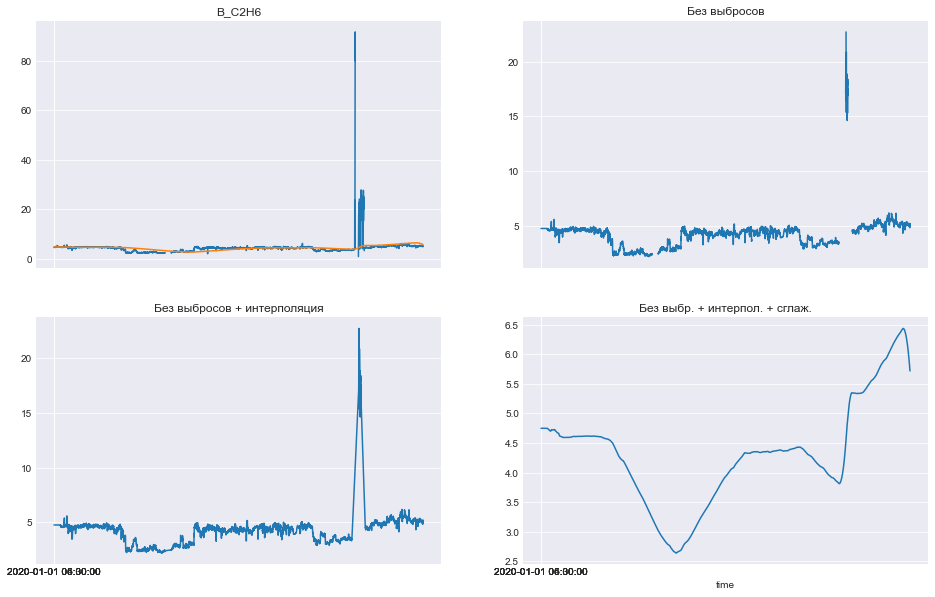

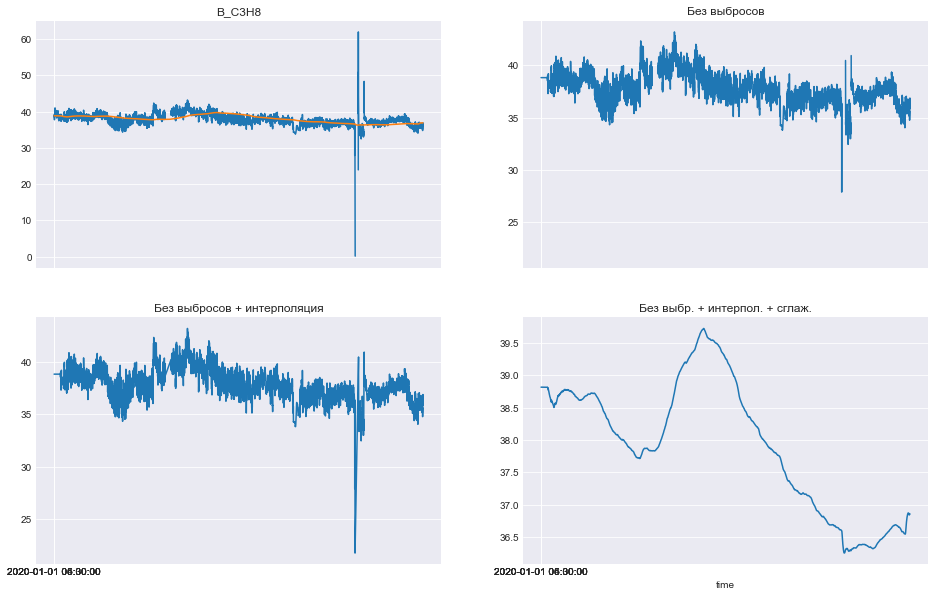

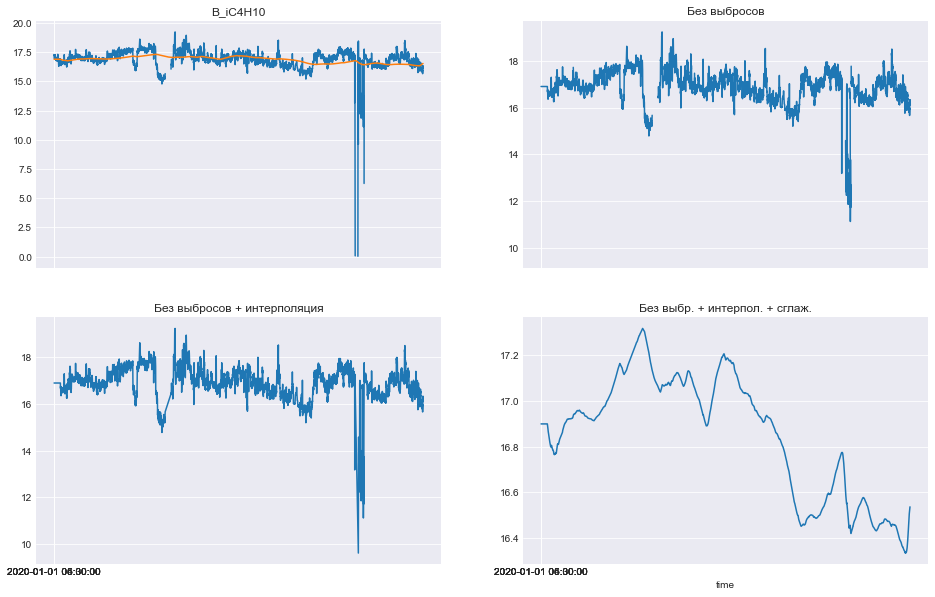

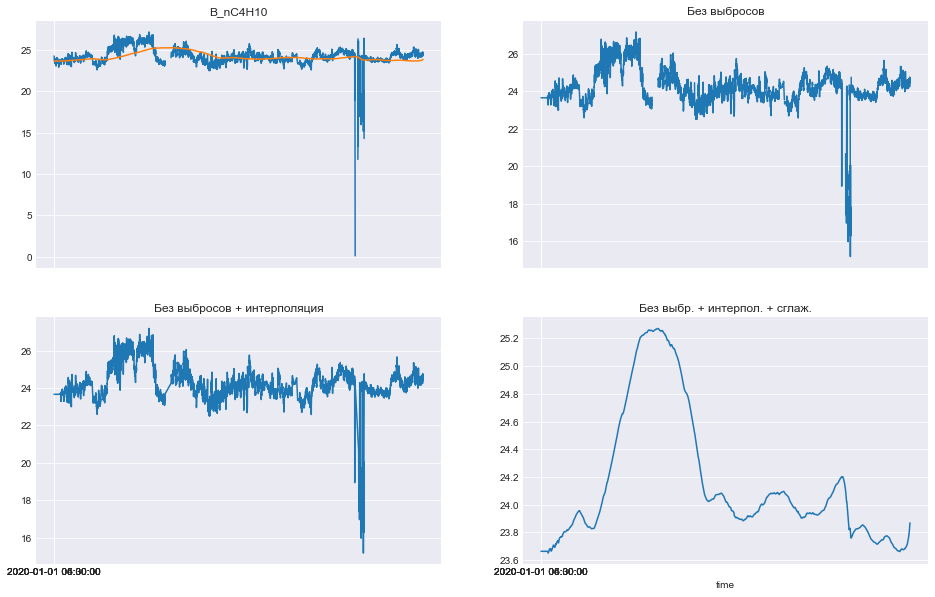

In [57]:
for value in list(df_train.columns)[1:]:
    checkBounds(df_train, value, [0.70, 1.30], False, False, 1000)
    print('======================================================================================================')

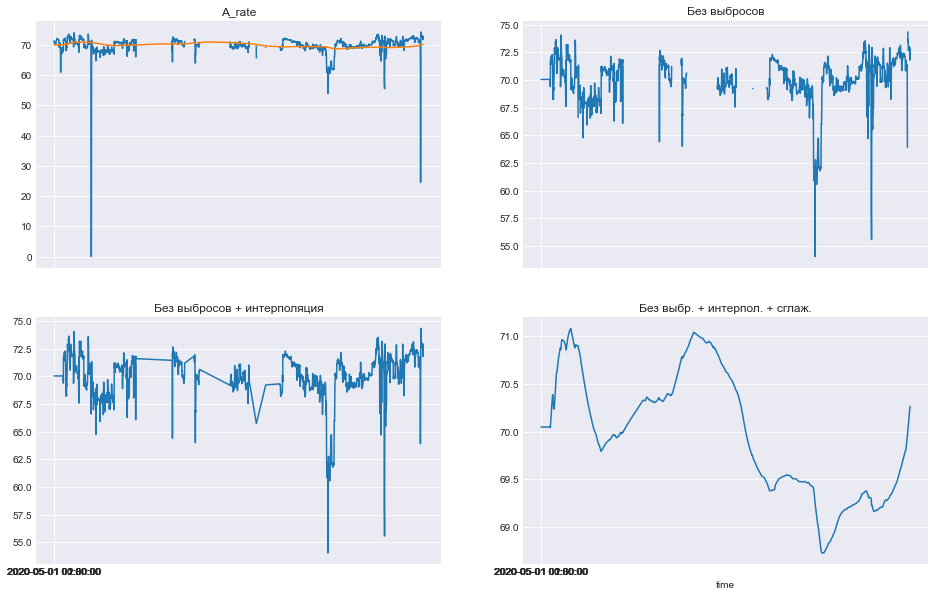

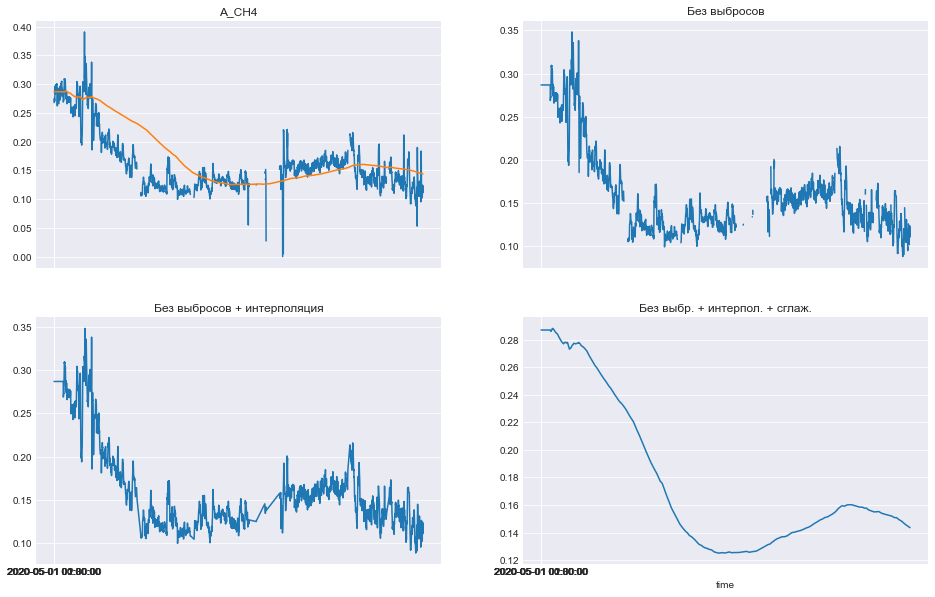

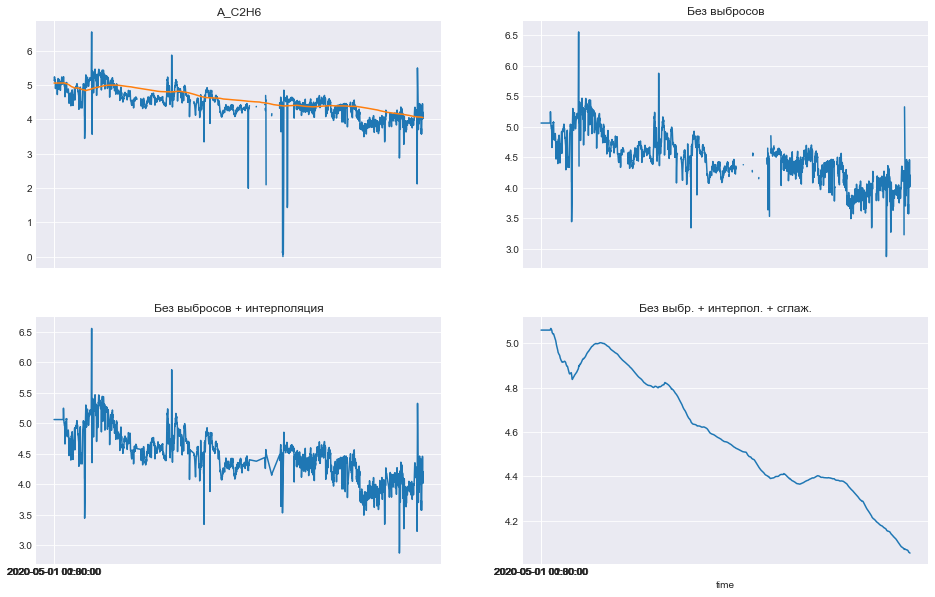

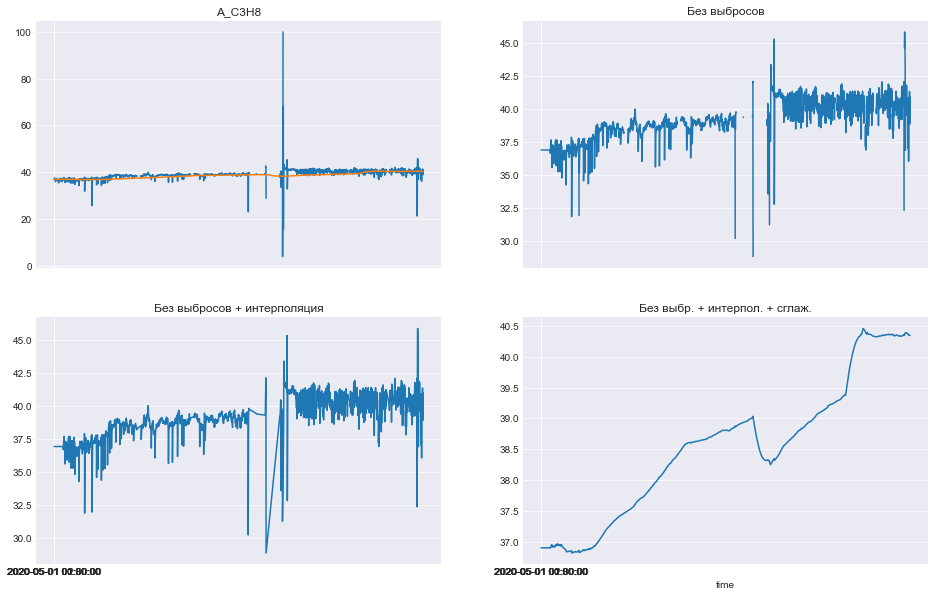

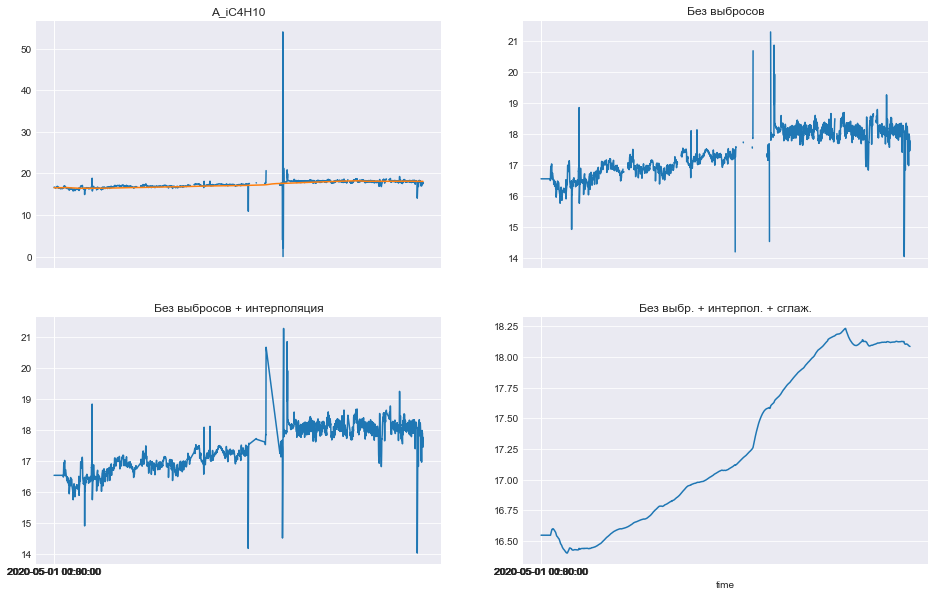

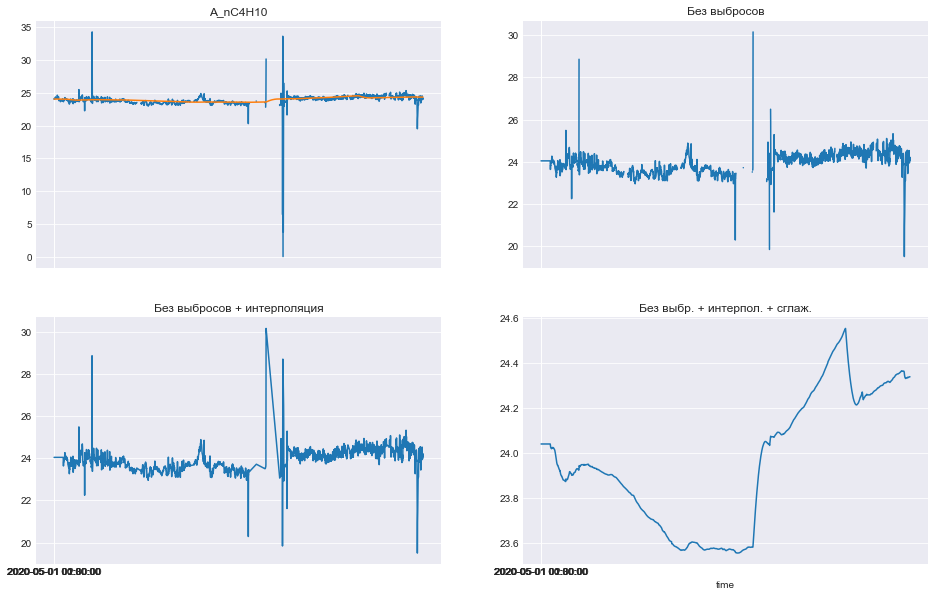

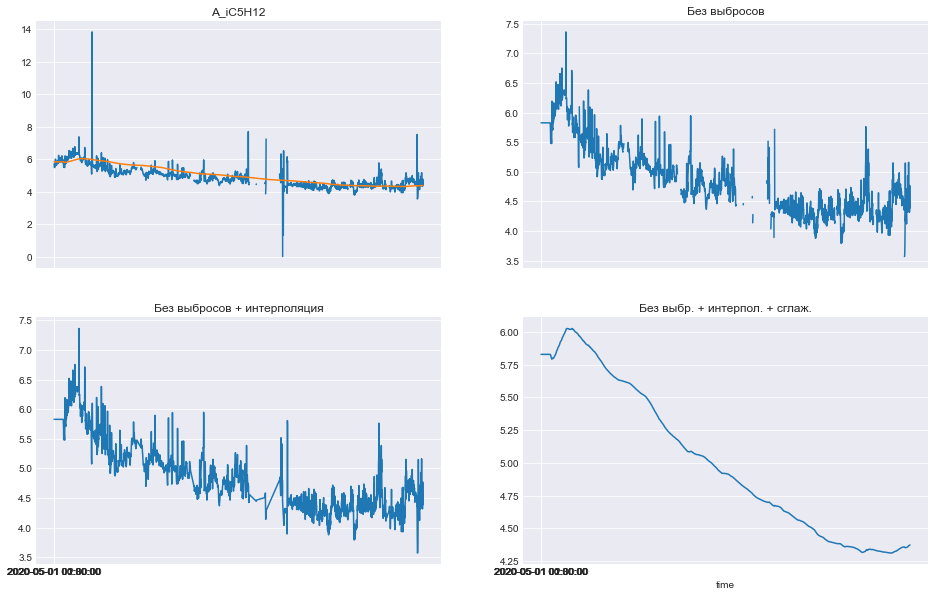

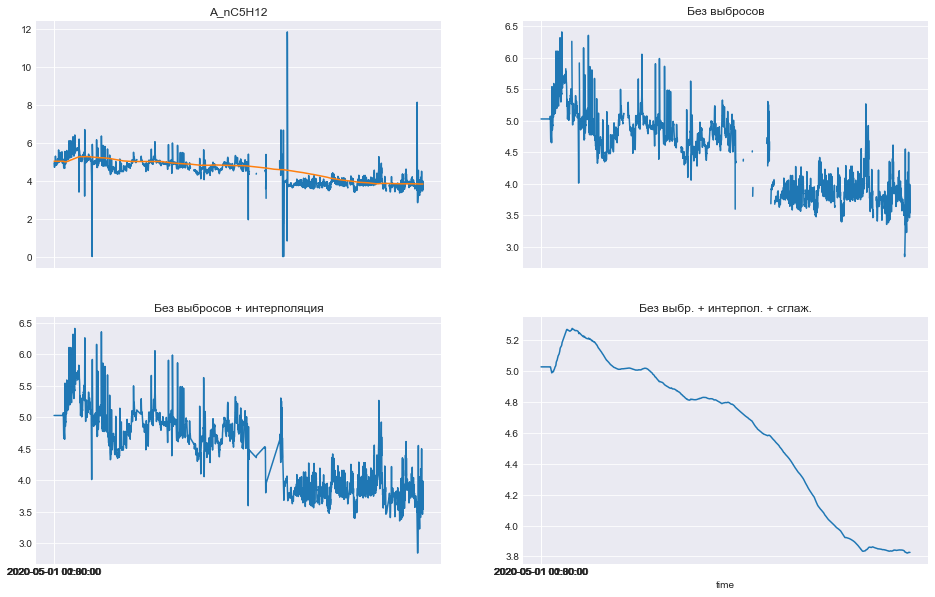

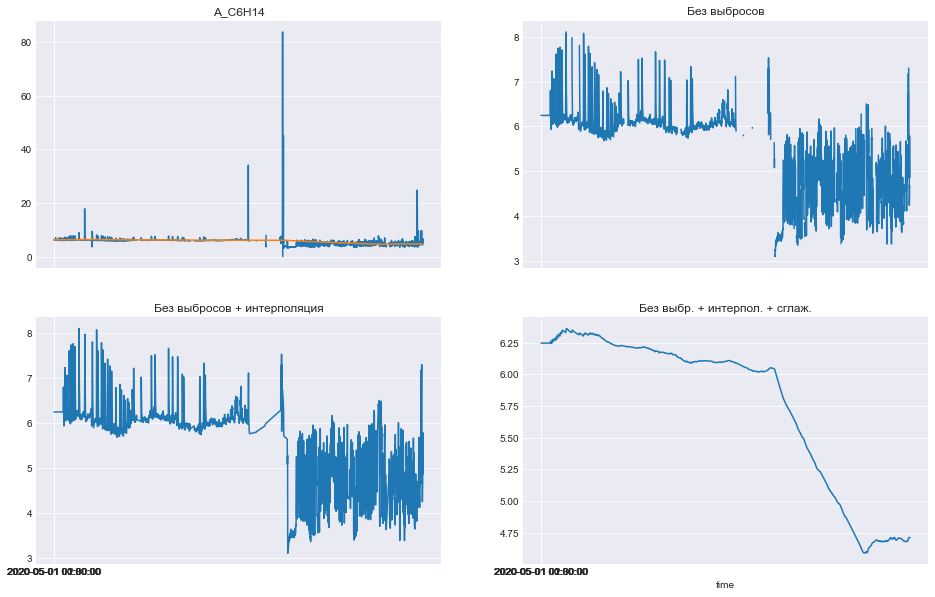

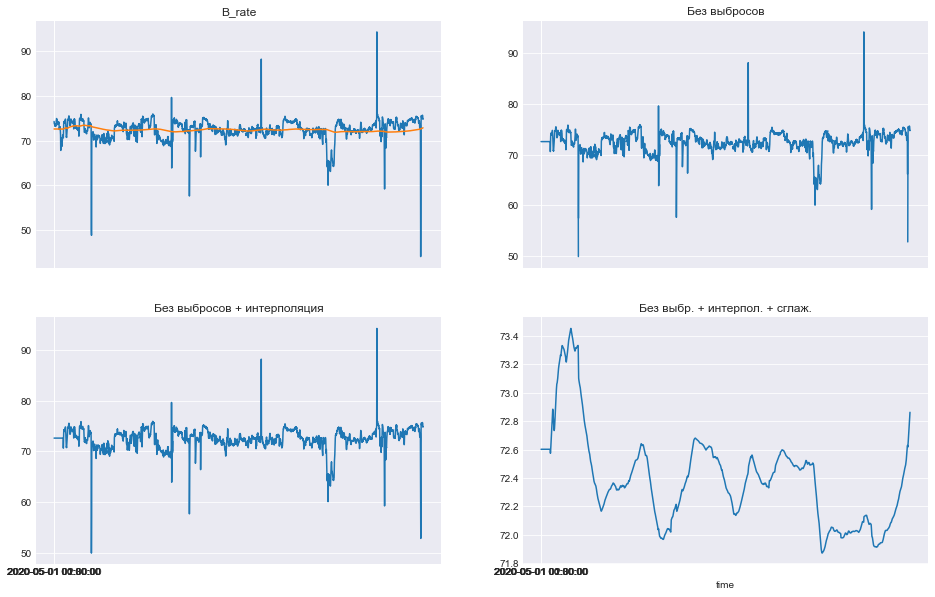

In [60]:
for value in list(feat_test.columns)[1:]:
    checkBounds(feat_test, value, [0.70, 1.30], False, False, 1000)

Убрали выбросы и линейно интерполировали

In [10]:
def findMissing(df=df_train):
    #Датасет только рядами, содержащими Nan
    df_nulls = df[pd.isnull(df_train).any(axis=1)]
    nulls = []
    for index, row in df_nulls.iterrows():
        item = [index, list(row[row.isnull()].index)]
        if len(nulls)!=0 and item[1]==nulls[-1][1] and type(nulls[-1][0])==list:
            if (item[0] == nulls[-1][0][-1] + 1):
                nulls[-1][0].append(item[0])
            else:
                nulls.append(item)
        elif len(nulls)!=0 and item[1]==nulls[-1][1] and type(nulls[-1][0]!=list):
            if (item[0] == nulls[-1][0] + 1):
                nulls[-1][0] = [nulls[-1][0], item[0]]
            else:
                nulls.append(item)
        else:
            nulls.append(item)
    return nulls

Получили список один элемент, которого это список, состояющий из:
1. Списка с индексами(если их несколько)
2. Списка со значениями столбцов которые пропущены

In [23]:
print(len(findMissing()))
findMissing()[:3]

117


[[60,
  ['A_CH4',
   'A_C2H6',
   'A_C3H8',
   'A_iC4H10',
   'A_nC4H10',
   'A_iC5H12',
   'A_nC5H12',
   'A_C6H14']],
 [[73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85],
  ['A_CH4',
   'A_C2H6',
   'A_C3H8',
   'A_iC4H10',
   'A_nC4H10',
   'A_iC5H12',
   'A_nC5H12',
   'A_C6H14']],
 [[120,
   121,
   122,
   123,
   124,
   125,
   126,
   127,
   128,
   129,
   130,
   131,
   132,
   133,
   134,
   135],
  ['A_CH4',
   'A_C2H6',
   'A_C3H8',
   'A_iC4H10',
   'A_nC4H10',
   'A_iC5H12',
   'A_nC5H12',
   'A_C6H14']]]

Наблюдается два периода аномальных значений:
- Во время первого нет данных по массовой доле у потребителя(В), а данные на точке А по н-бутану завышаются и по остальным целевым показателем занижаются
- Во время второго странные показания для целевых газов у потребителя(В)
- Плюс на в самом начале есть странные показания для массовых показаний у производителя(А)

Стоит экстраполировать пропущенные значения и посмотреть на сглаженные графики. Аномальные значения стоит заменить на более логичные, так как на основе имеющихся данных мы не может учитывать такие выбросы.

---
Нужно попробовать написать функцию, которая бы удаляла выбросы в зависимости от того насколько следующее значение отличается от предыдущих(существующих, например 3-5). Затем интерполировать данные, таким образом сможем выделить общий тренд, без сильных загонов.

## Models

In [11]:
df_scores = pd.read_pickle('df_scores.pickle')
def scores(result, descr):
    global df_scores
    df_scores=df_scores.append({'Результат': result,
                                'Описание сабмита': descr},
                                ignore_index=True)

def saveResultsDf():
    with open('df_scores.pickle', 'wb') as f:
        pickle.dump(df_scores, f)

In [12]:
def mape(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return round(np.mean(np.abs((y_true - y_pred) / y_true)) * 100,3)

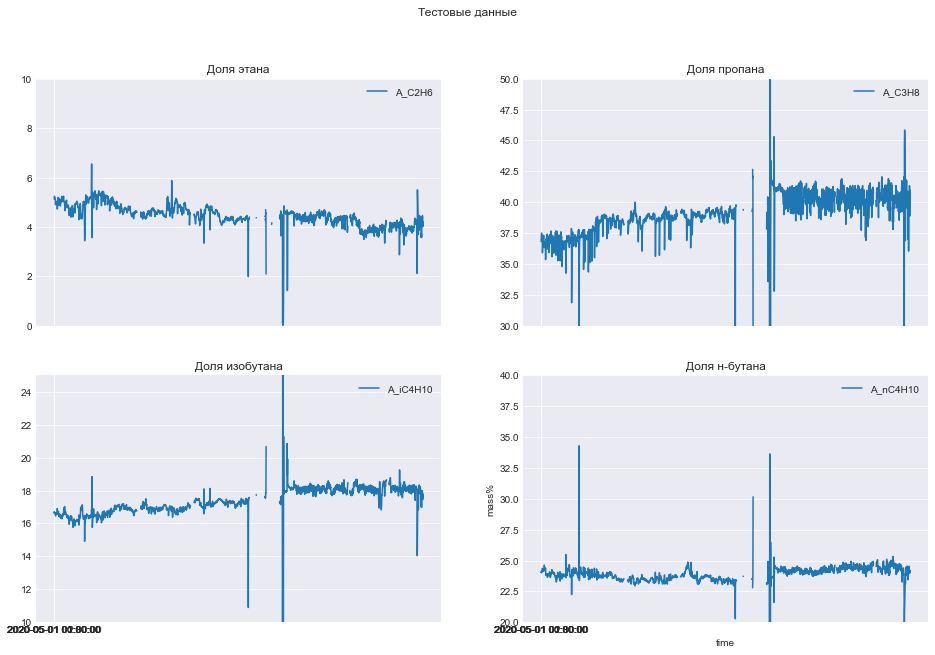

In [26]:
plotTargetGases(df=feat_test, b_feats=False, a_feats=True, rolling=False, window=0, title='Тестовые данные')

In [13]:
def outputSubmission(preds, name):
    sample_sub[target_feats] = preds
    sample_sub.to_csv(name, index=False)

Для sample_submission имеем 3.1382

### Baseline

Интерполируем пропущенные значения и пускаем на линейную регрессию без настройки параметров. И удаляем первые 9 записей из трейна.

In [14]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso, RidgeCV, LassoCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostRegressor, GradientBoostingRegressor, RandomForestRegressor
from sklearn import metrics
from sklearn.model_selection import GridSearchCV
from xgboost import XGBRegressor

In [189]:
lr = LinearRegression()
lr.fit(feat_train[train_feats][9:].interpolate(axis=0), target_train[target_feats][9:].interpolate(axis=0))
test_preds = lr.predict(feat_test[train_feats].interpolate(axis=0))

In [190]:
#outputSubmission(test_preds, 'baseline.csv')

In [15]:
def drawPreds(test_preds, title='graphs'):
    df = pd.DataFrame(data=test_preds, columns=target_feats)
    df['timestamp'] = sample_sub['timestamp']
    plotTargetGases(df=df, 
                    b_feats=True, a_feats=False, 
                    rolling=False, window=0, 
                    title=title)

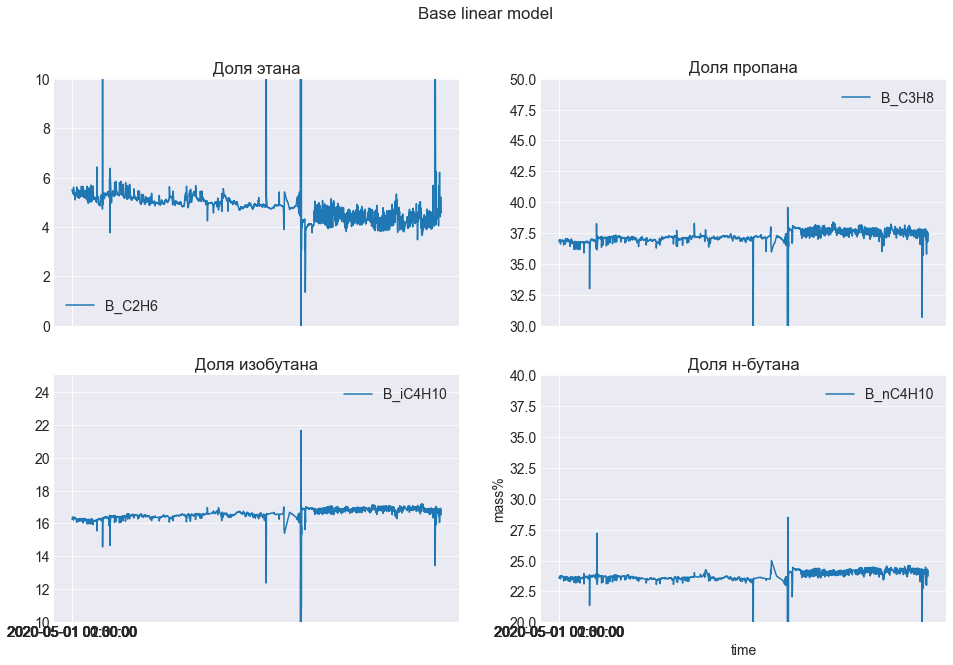

In [192]:
drawPreds(test_preds, 'Base linear model')

Получаем 4.5175

### Without outliers, linear interpolation on train+target, 144 window, 

Удаляем выбросы, интерполируем и сглаживаем по 144 точка(3 дня) весь трейн датасет

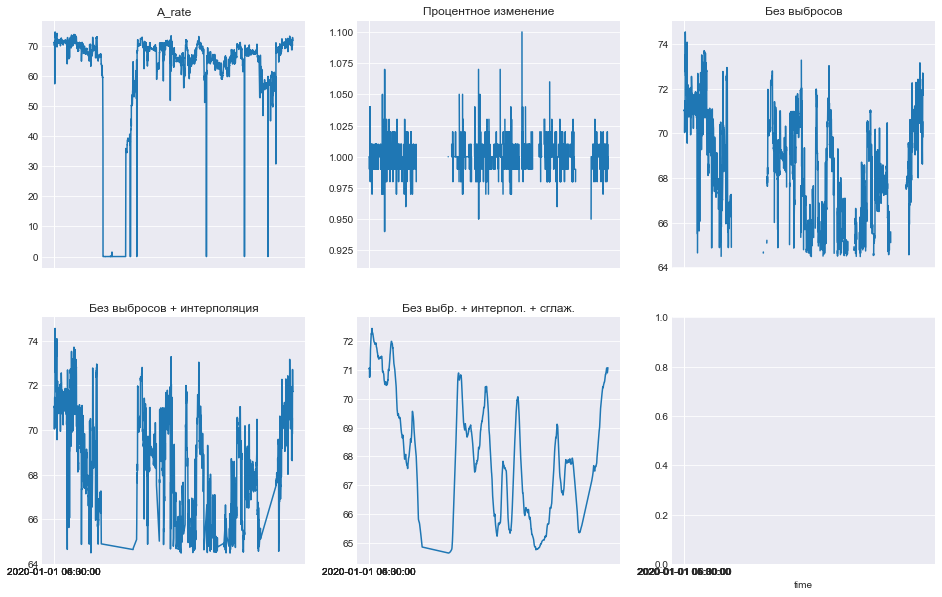

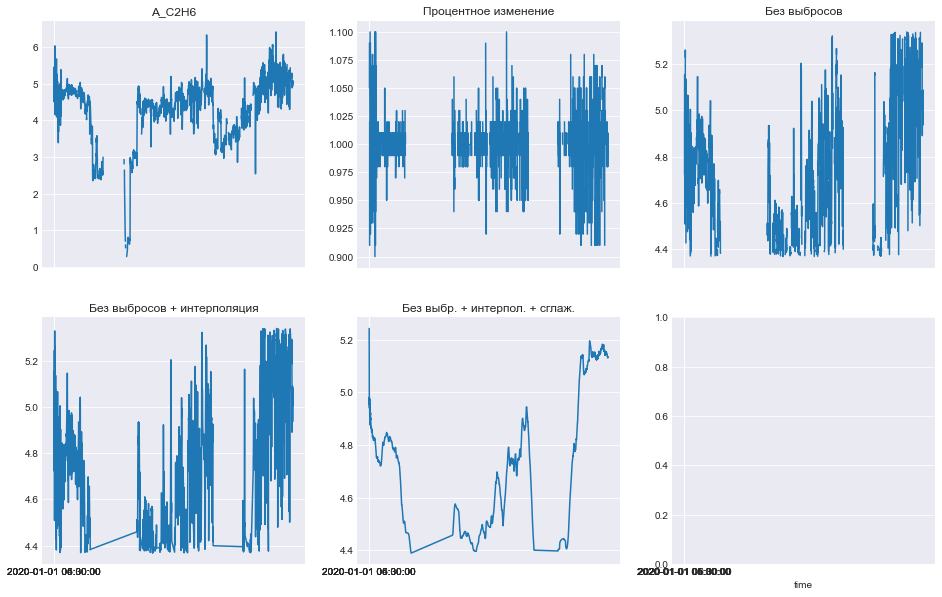

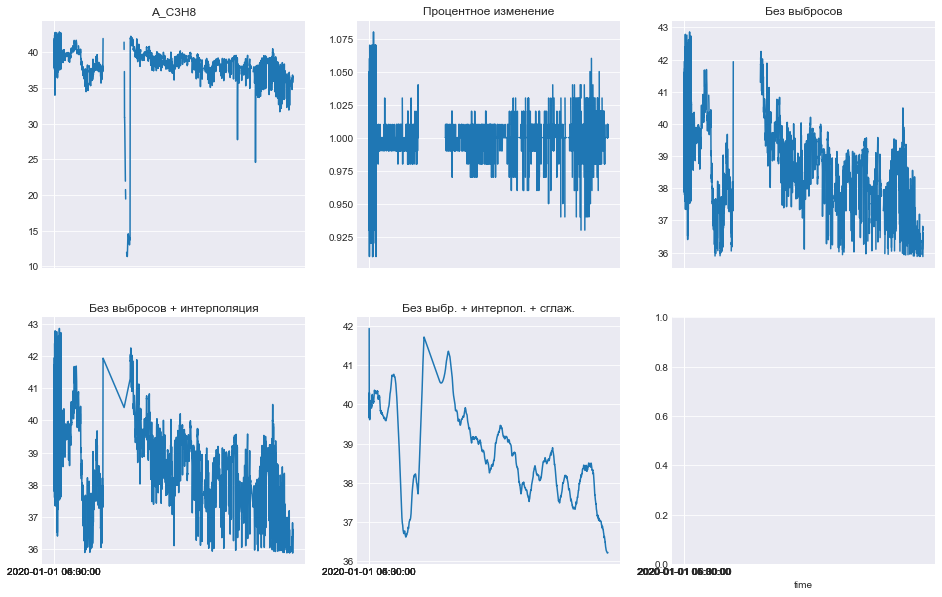

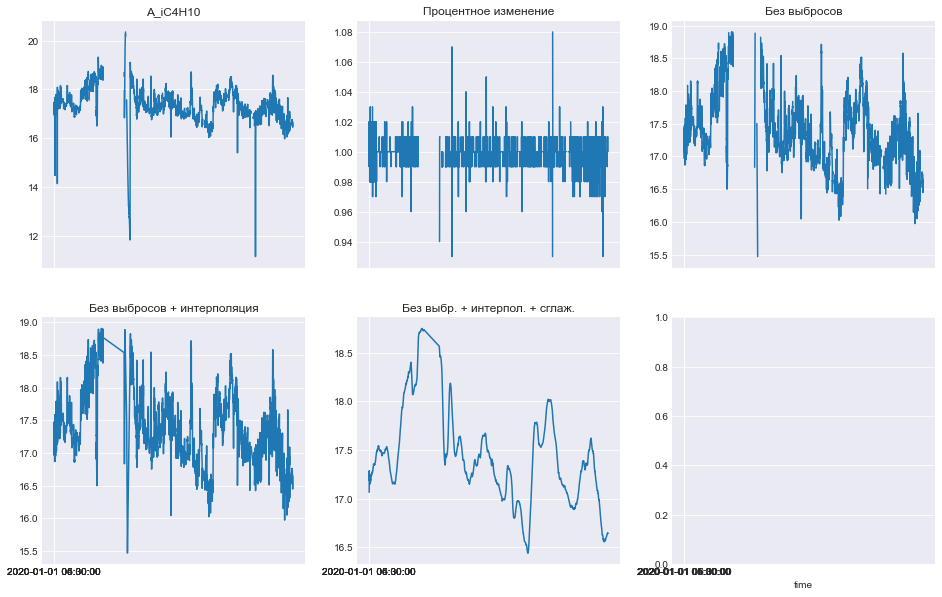

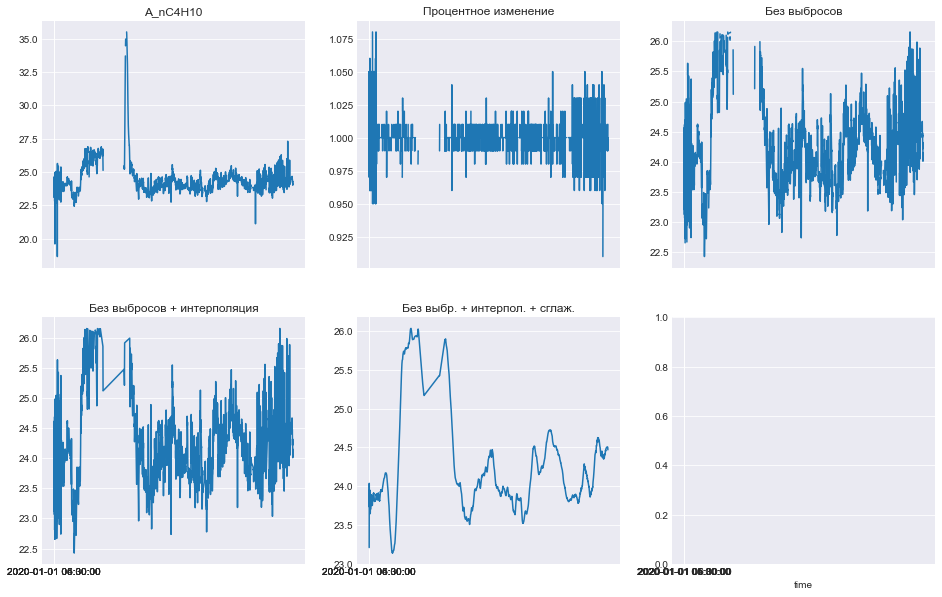

...

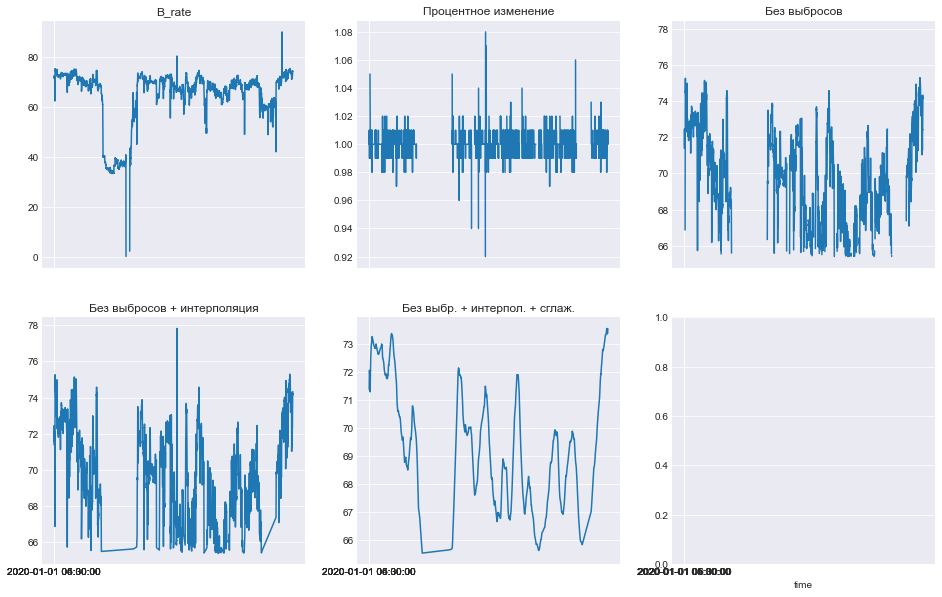

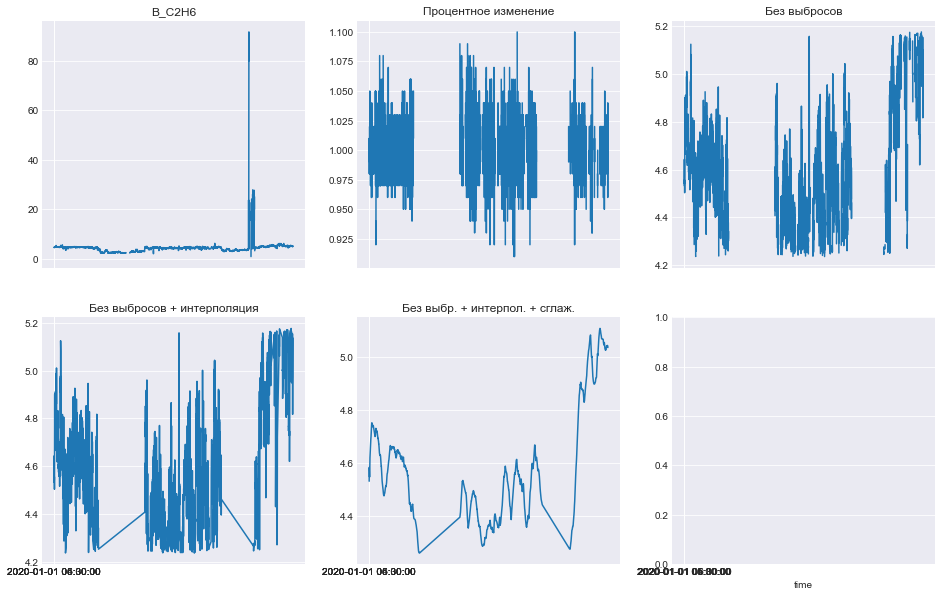

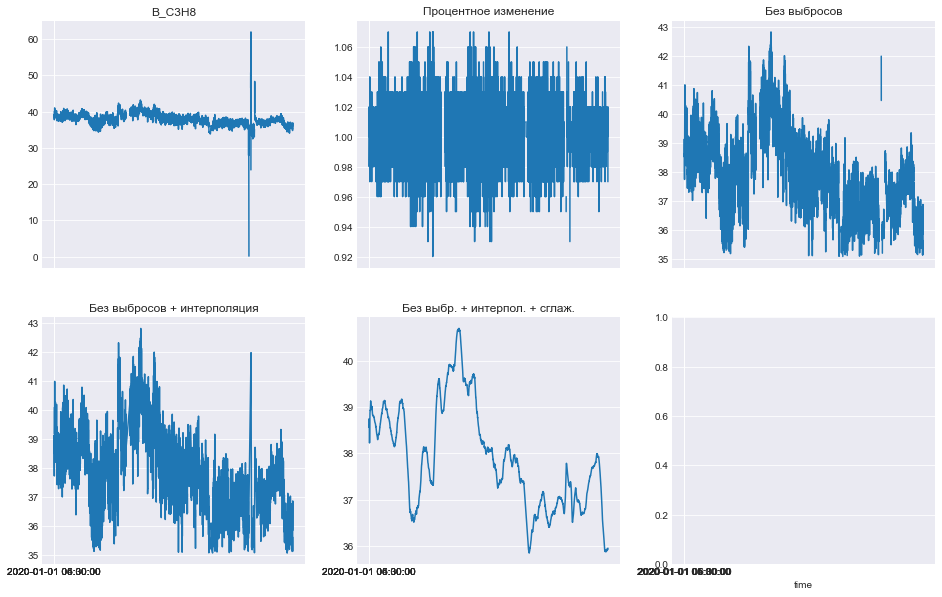

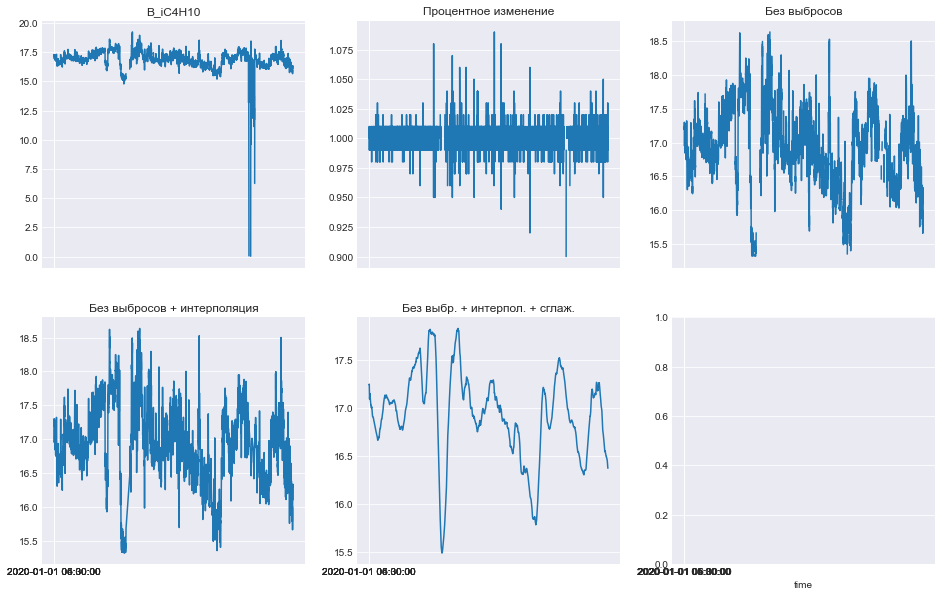

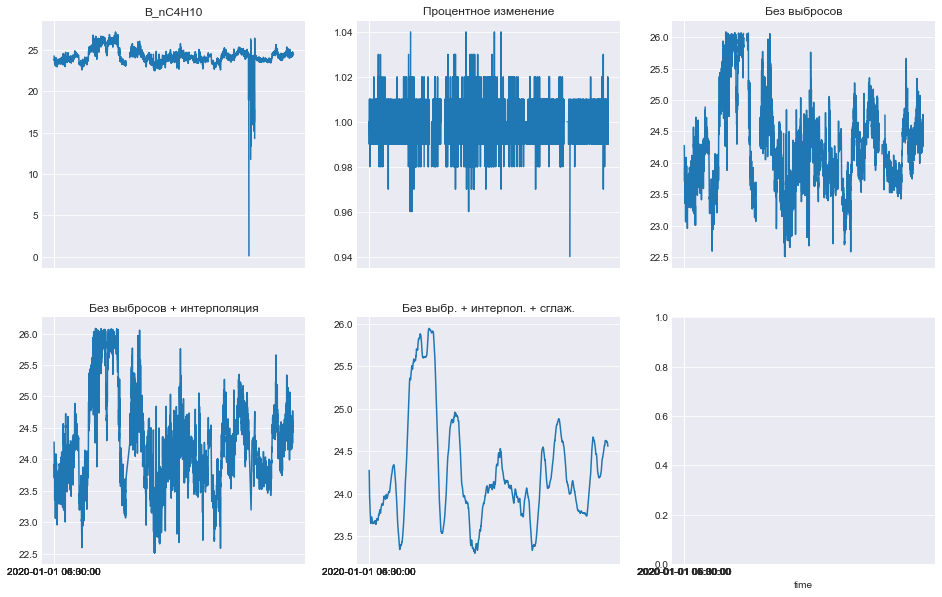

In [84]:
for value in (train_feats+target_feats):
    checkBounds(df_train, value, [0.9,1.1], True, False)
    print('======================================================================================================')

Удаляем выбросы, интерполируем и сглаживаем по 144 точка(3 дня) тестовый датасет, т.е. только трейн фичи

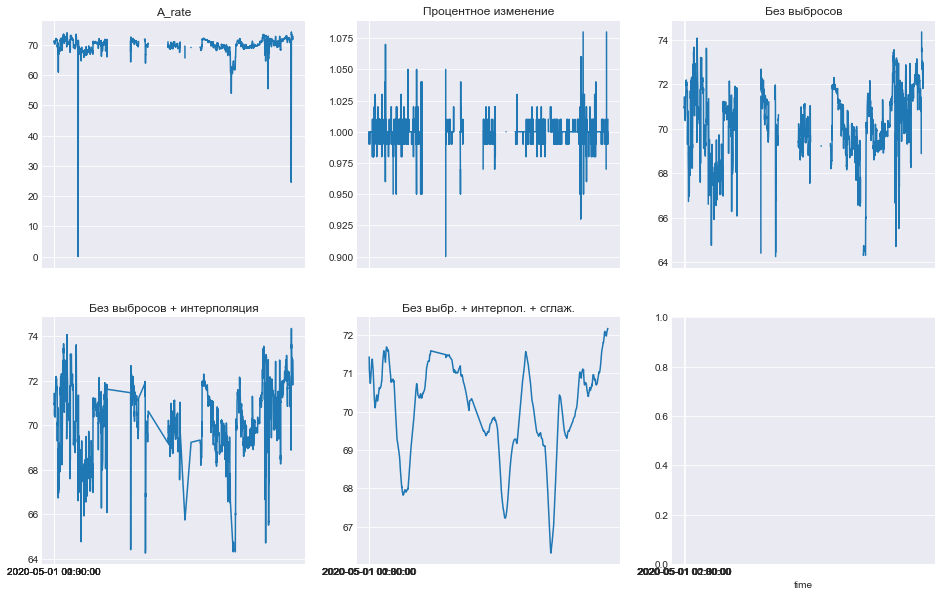

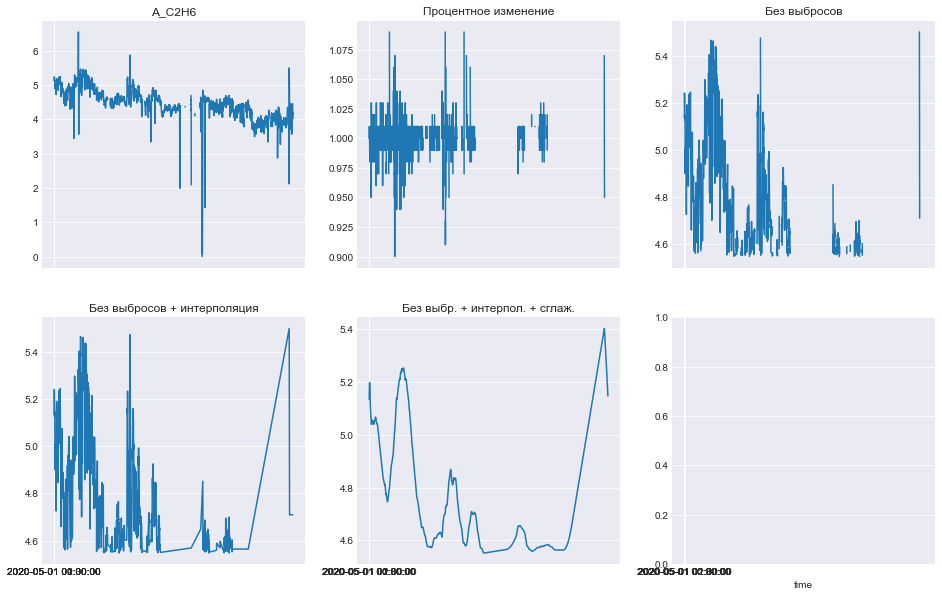

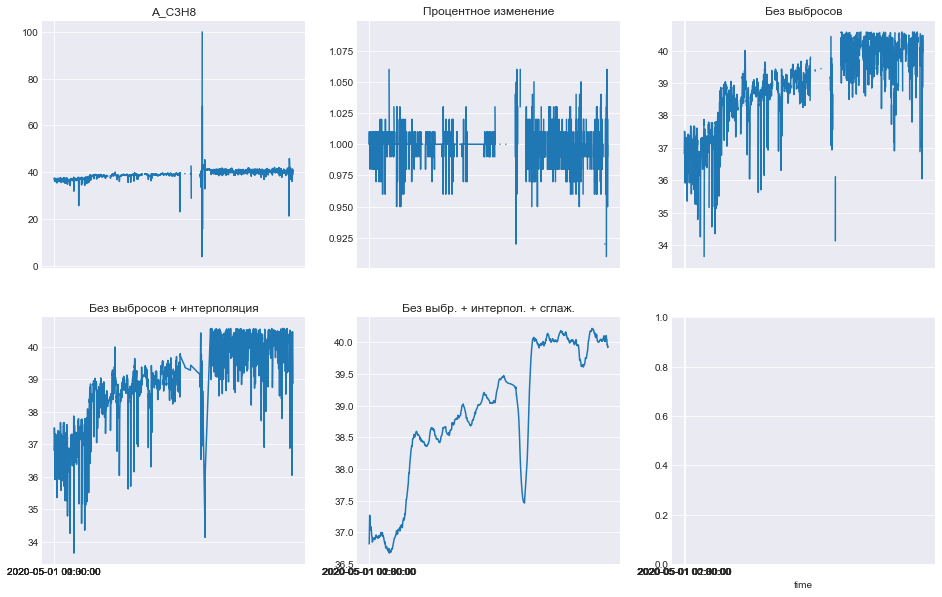

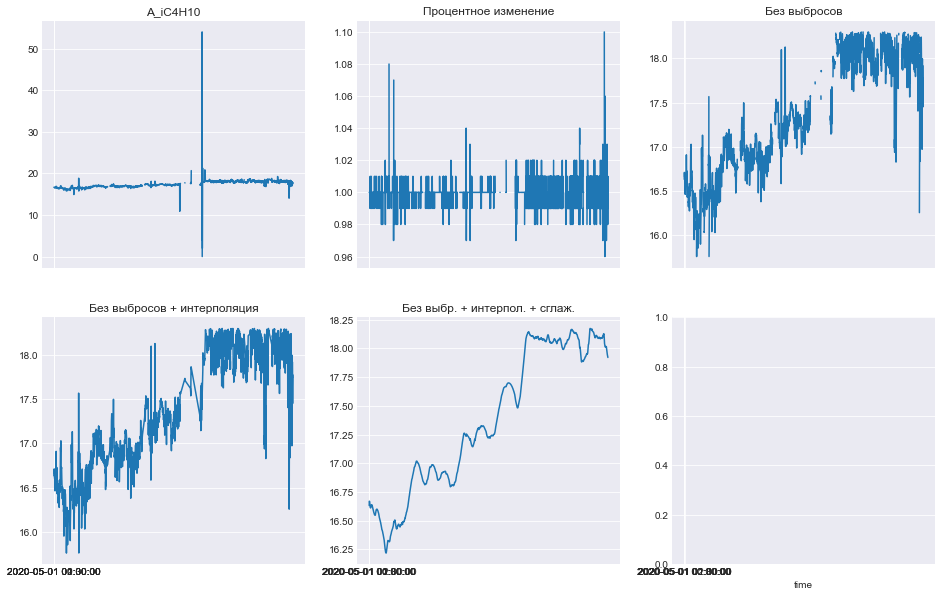

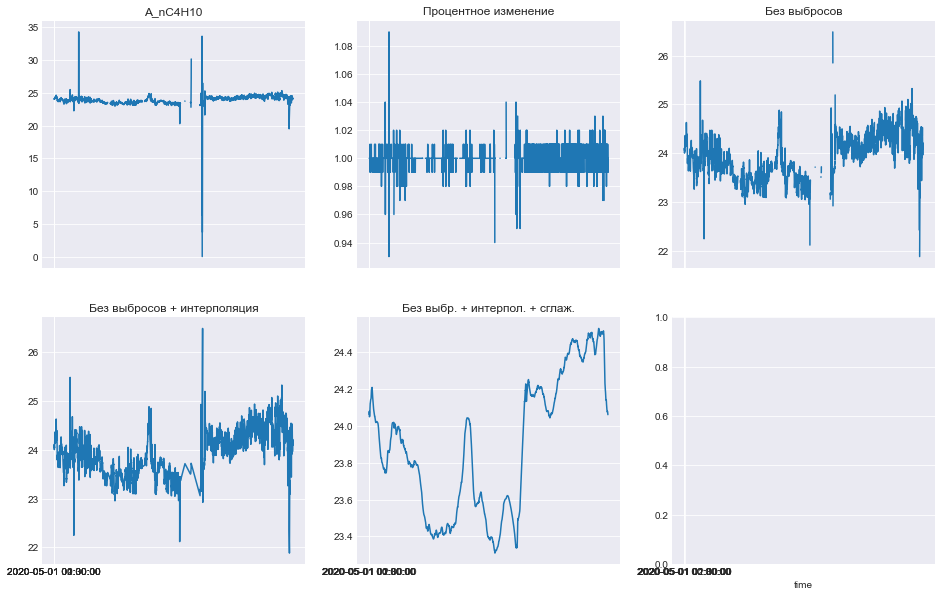

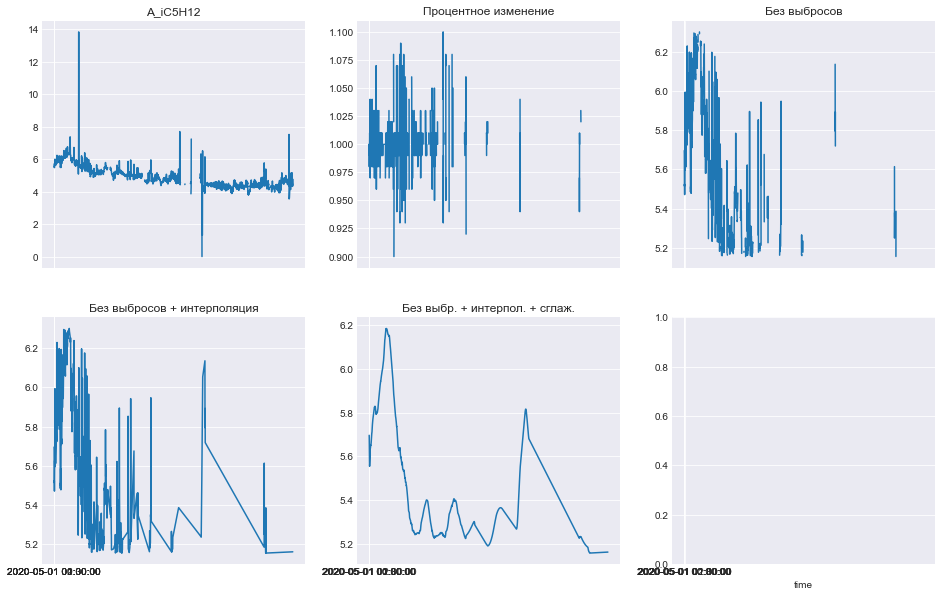

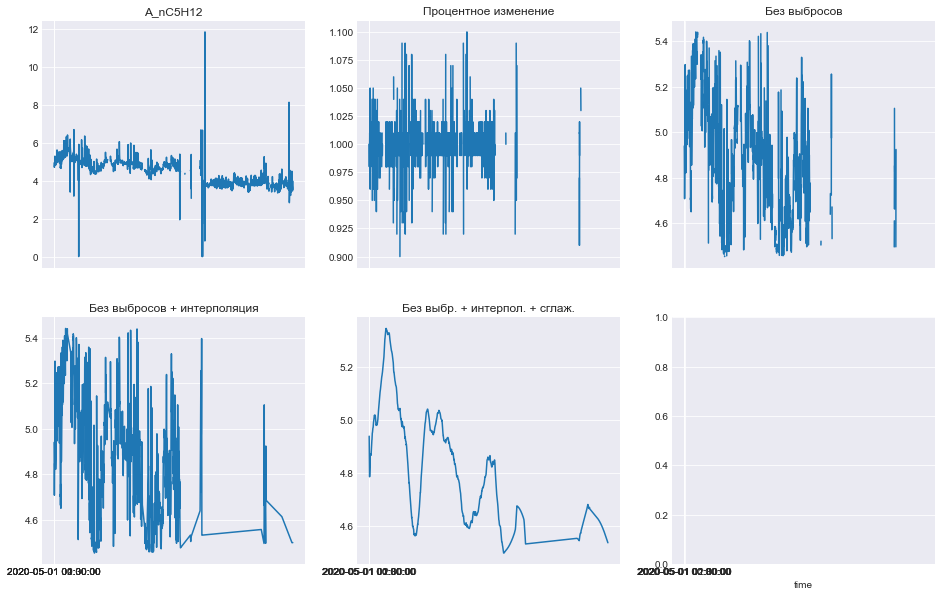

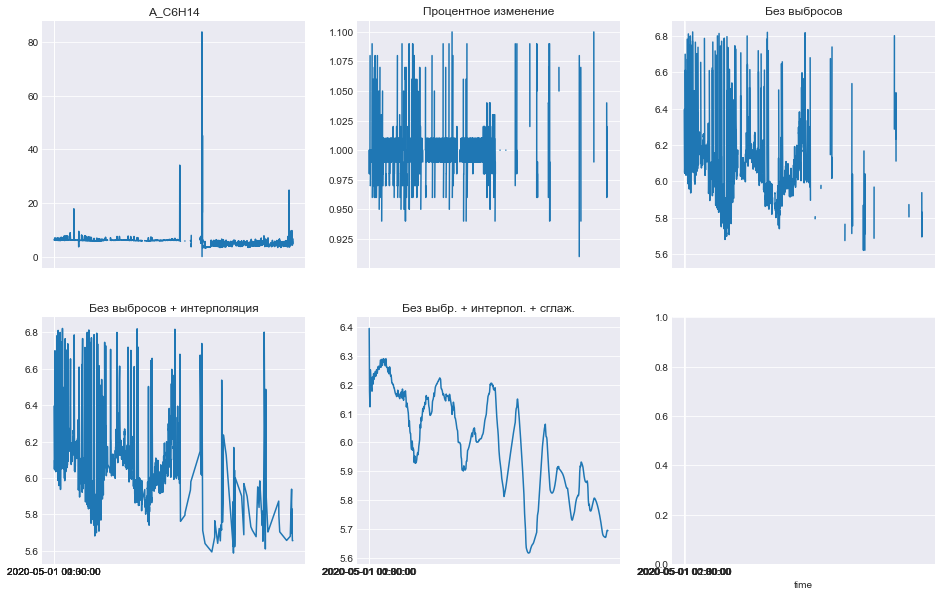

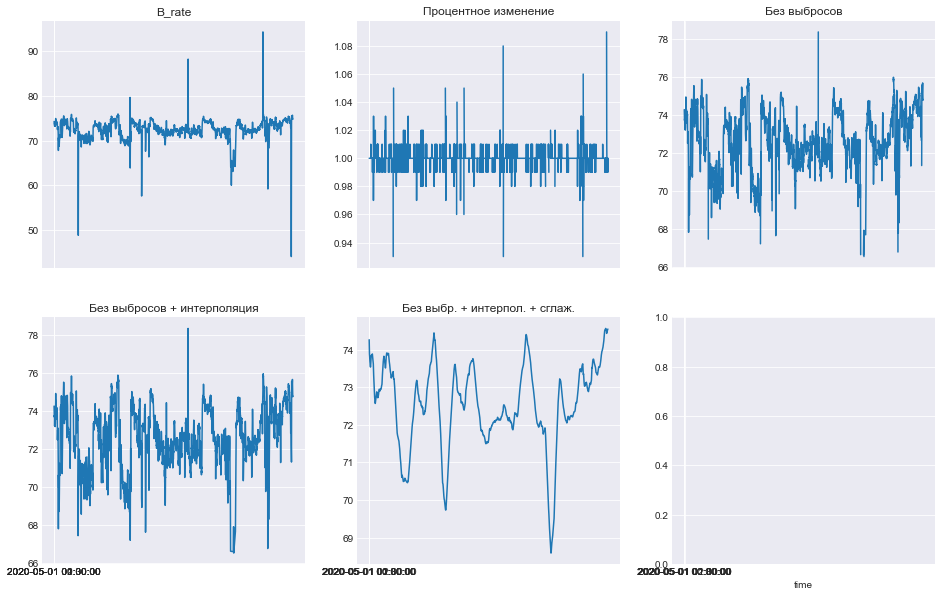

In [85]:
for value in train_feats:
    checkBounds(feat_test, value, [0.9,1.1], False, True)
    print('======================================================================================================')

In [195]:
lr = LinearRegression()
lr.fit(df_train[train_feats][9:].interpolate(axis=0), df_train[target_feats][9:])
test_preds = lr.predict(feat_test[train_feats])

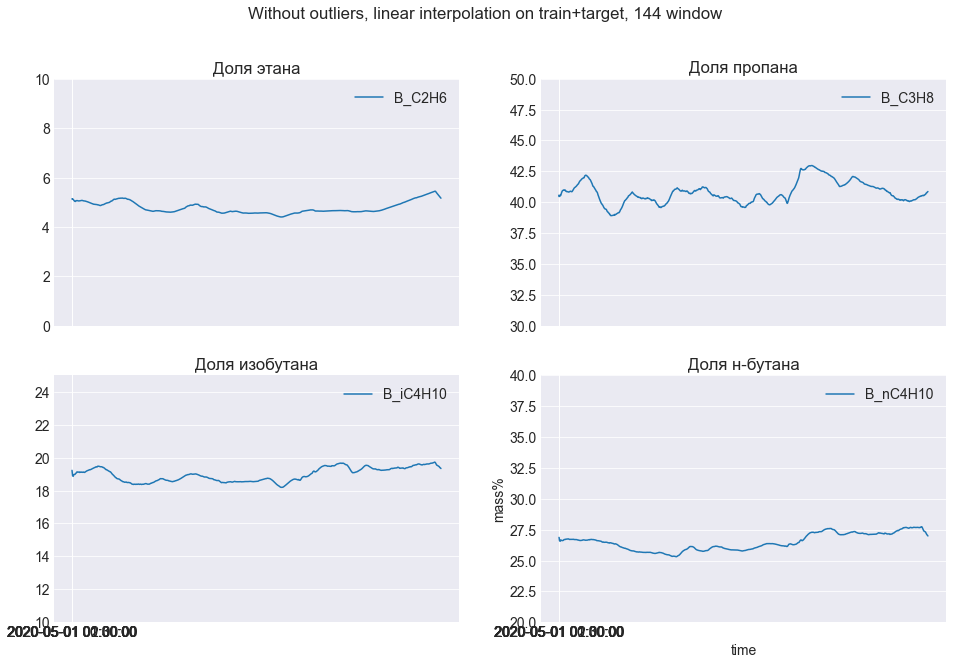

In [197]:
drawPreds(test_preds, 'Without outliers, linear interpolation on train+target, 144 window')

Получили 9.48

### Without outliers, linear interpolation on train, 144 window

Удаляем выбросы, интерполируем и сглаживаем по 144 точка(3 дня) только трейн фичи

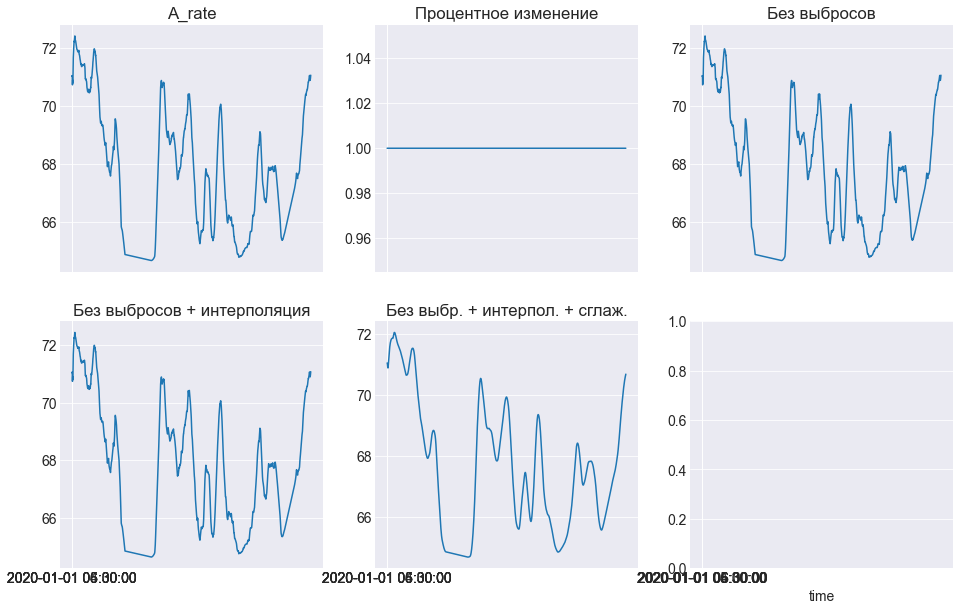

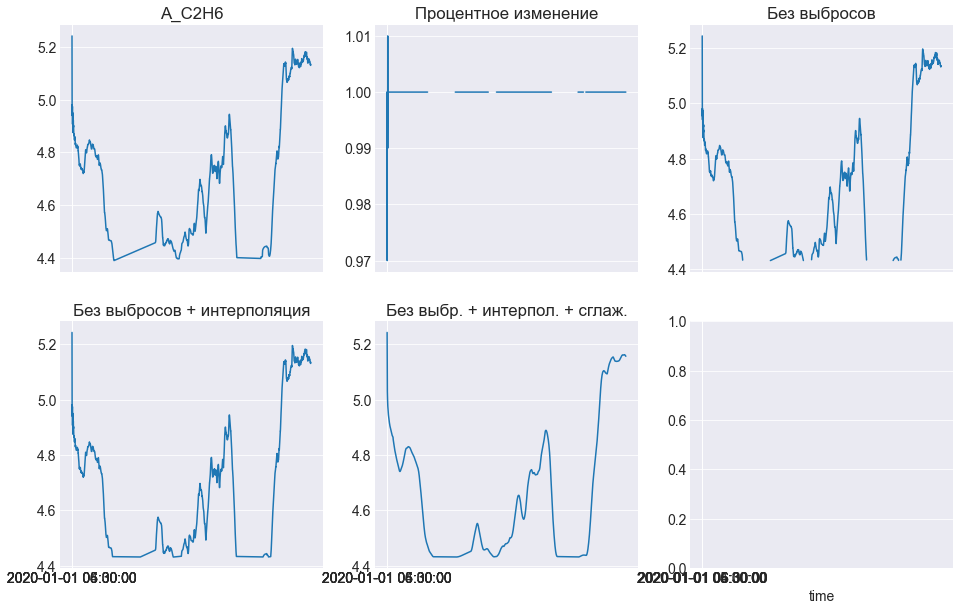

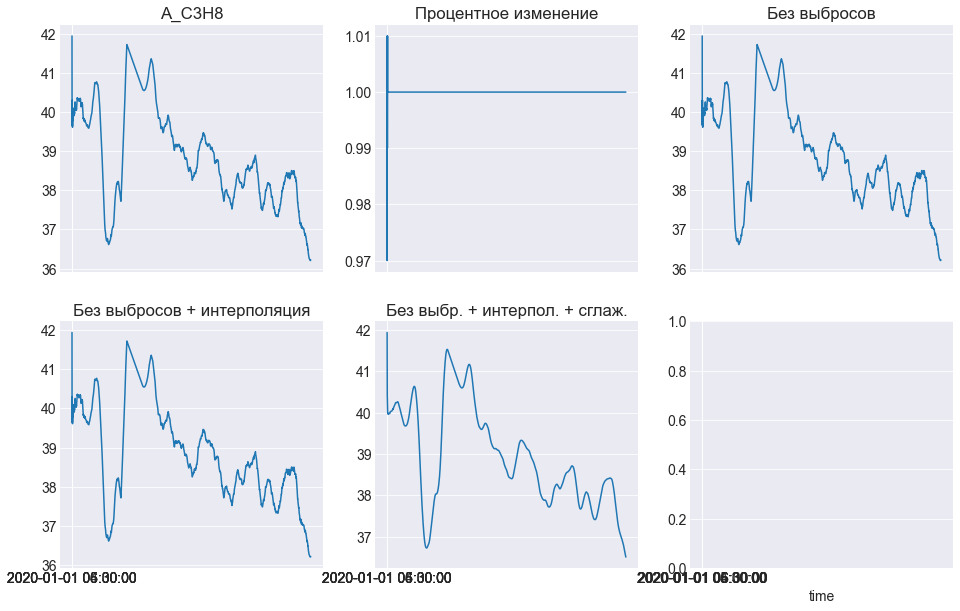

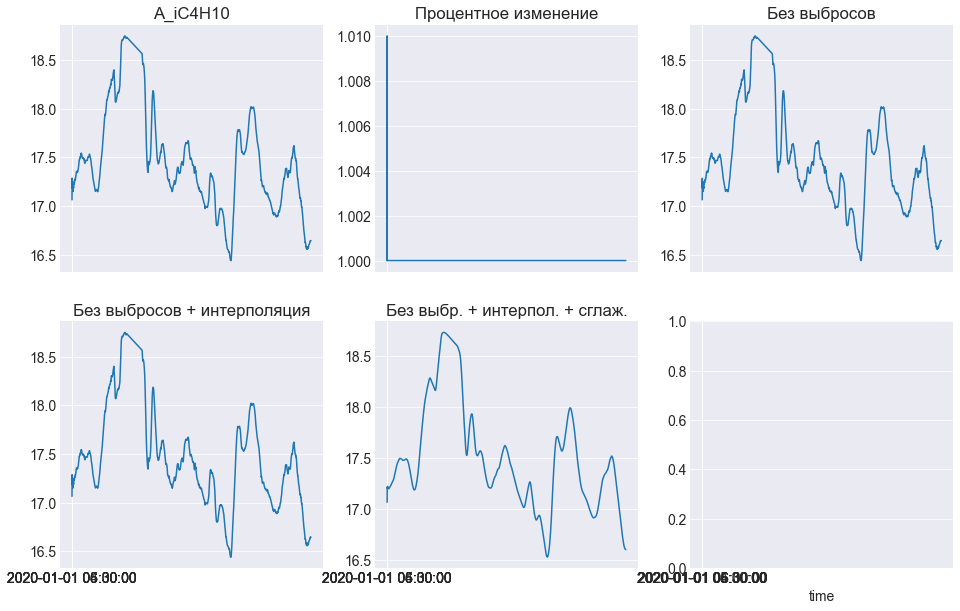

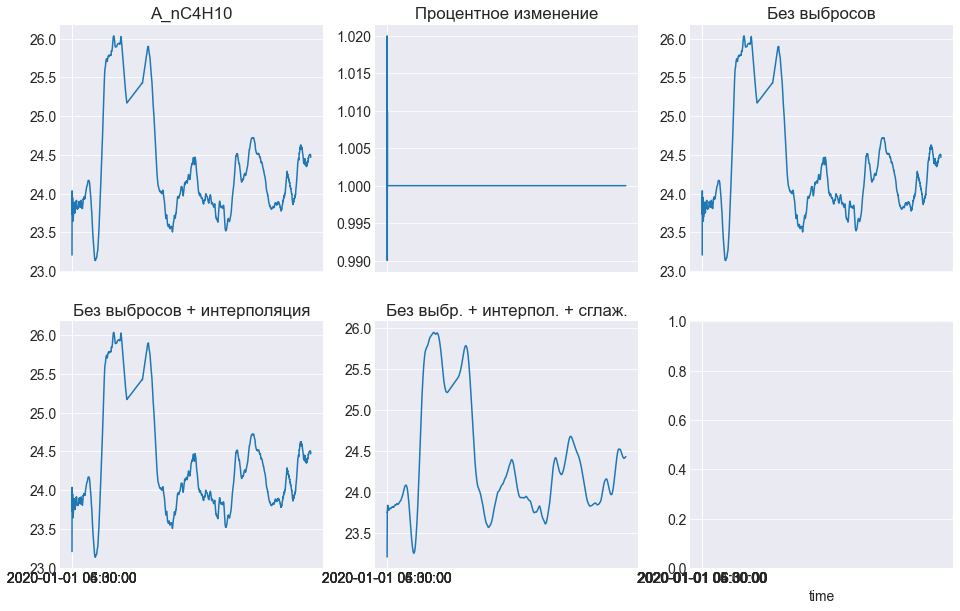

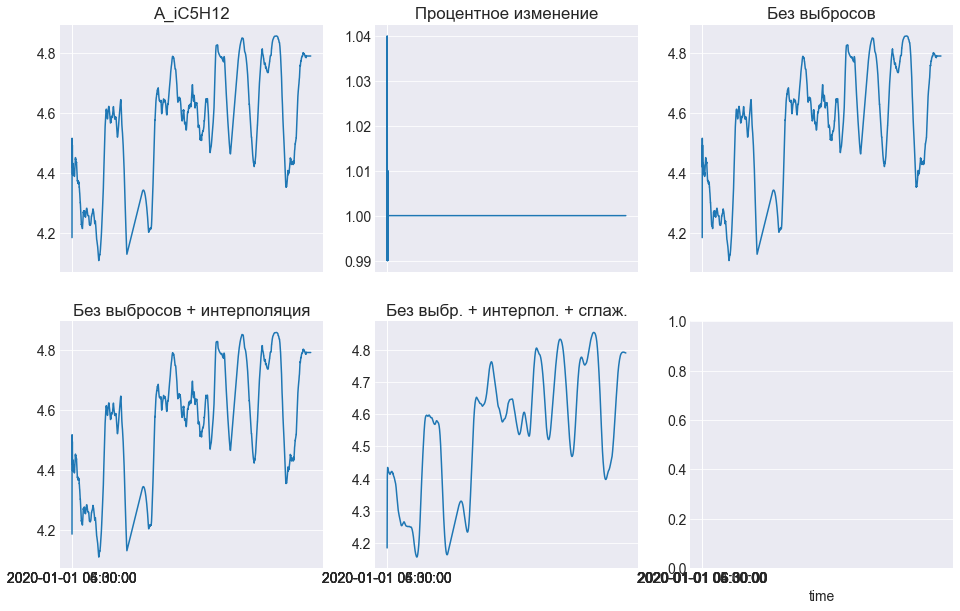

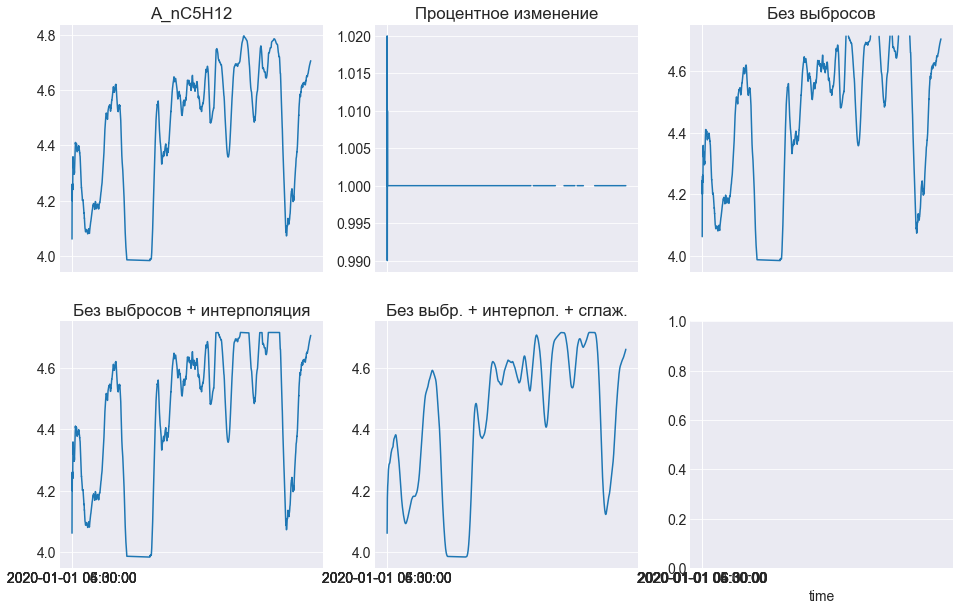

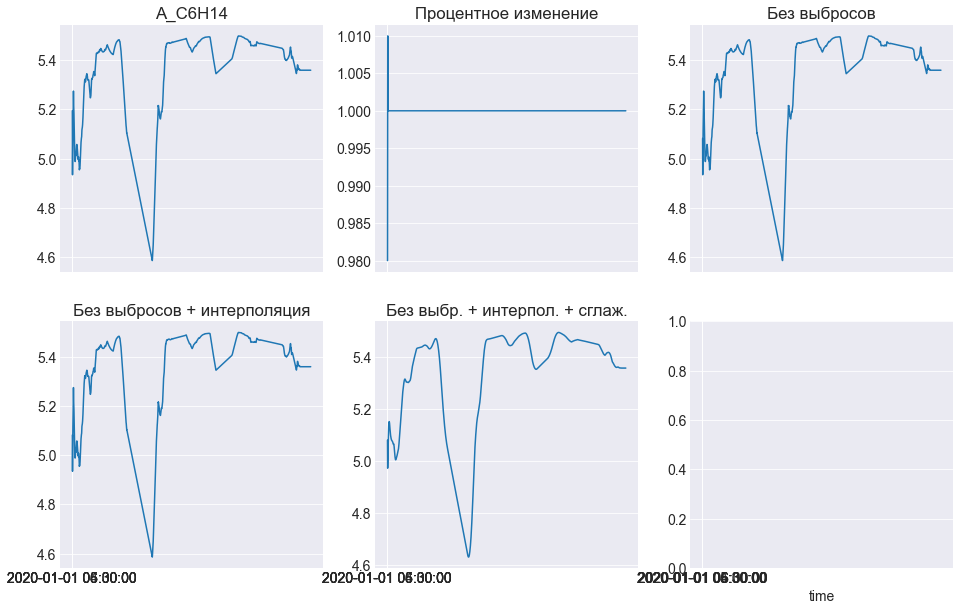

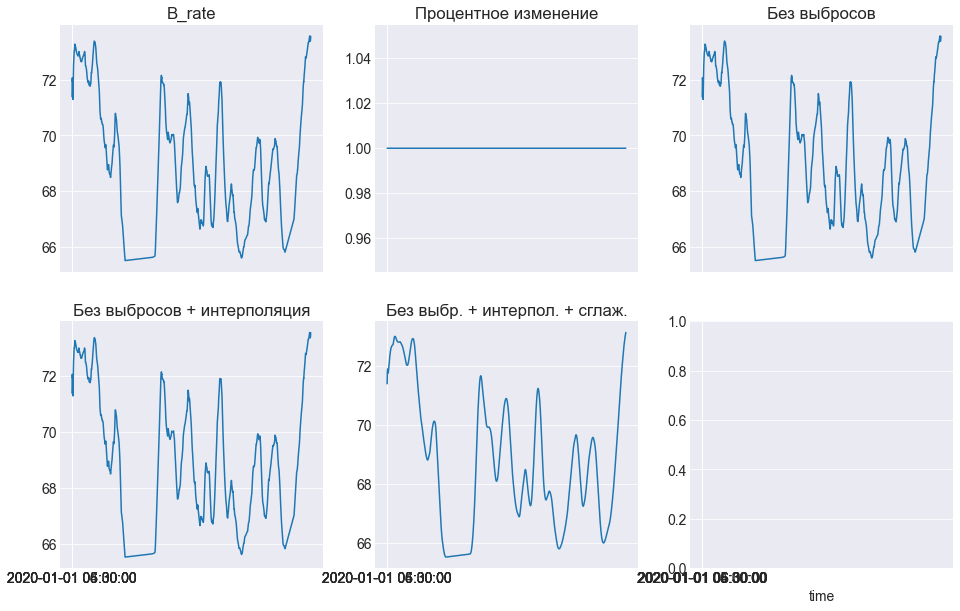

In [224]:
for value in train_feats:
    checkBounds(df_train, value, [0.9,1.1], True, False)
    print('======================================================================================================')

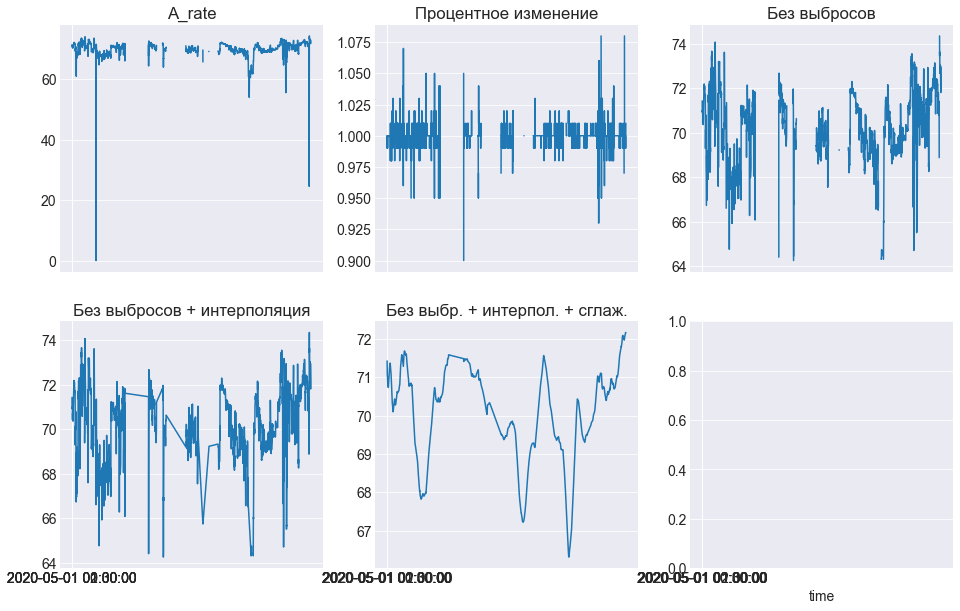

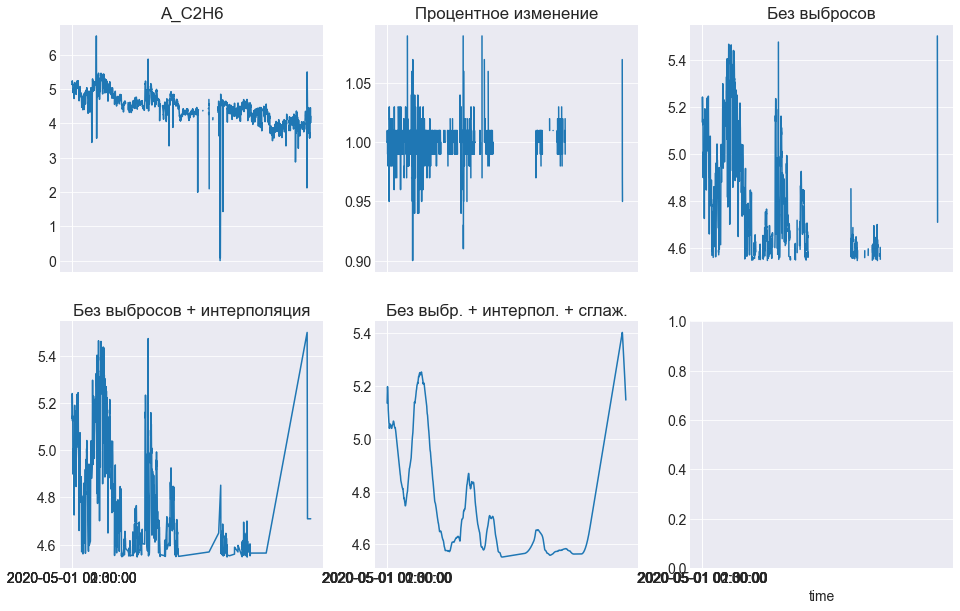

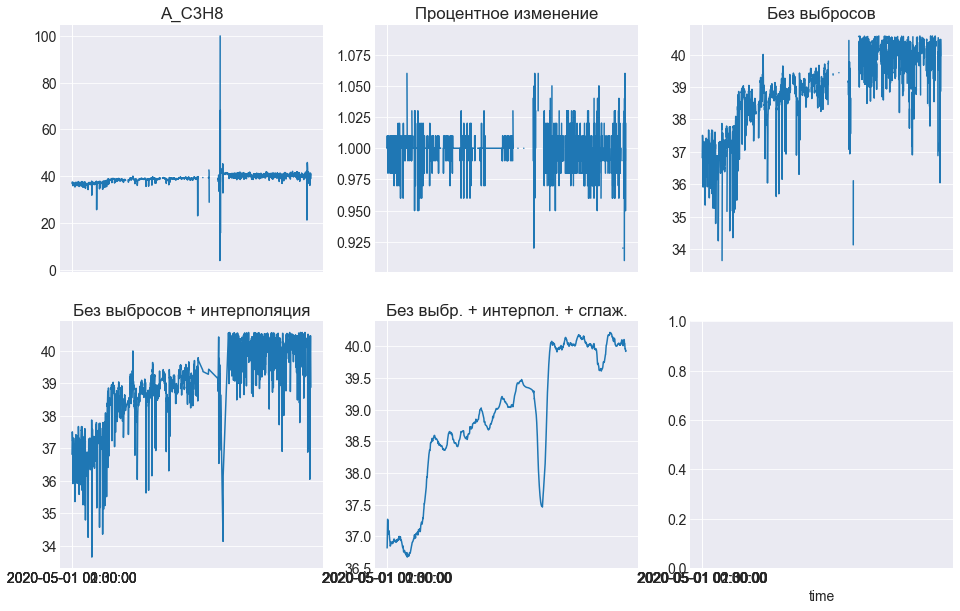

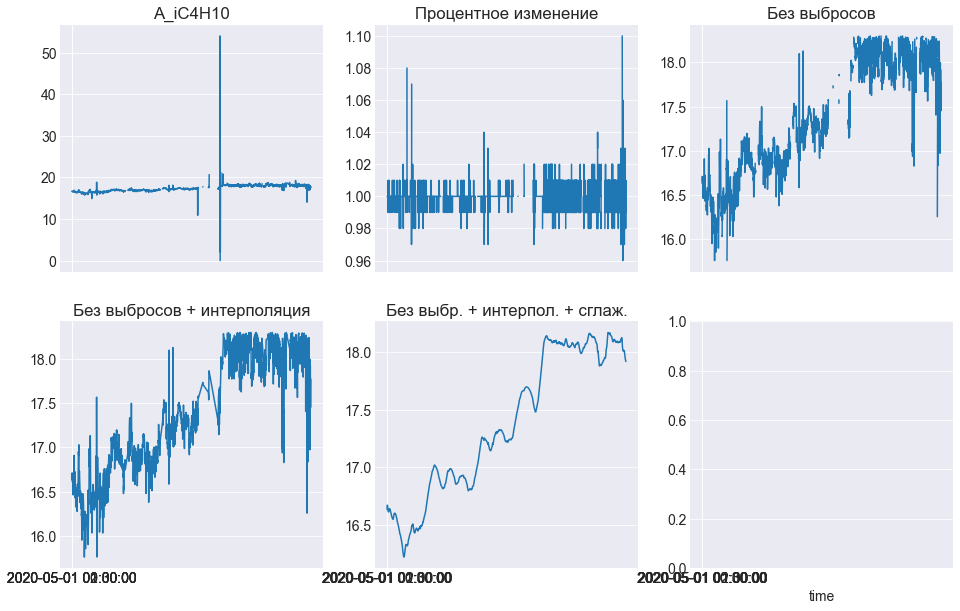

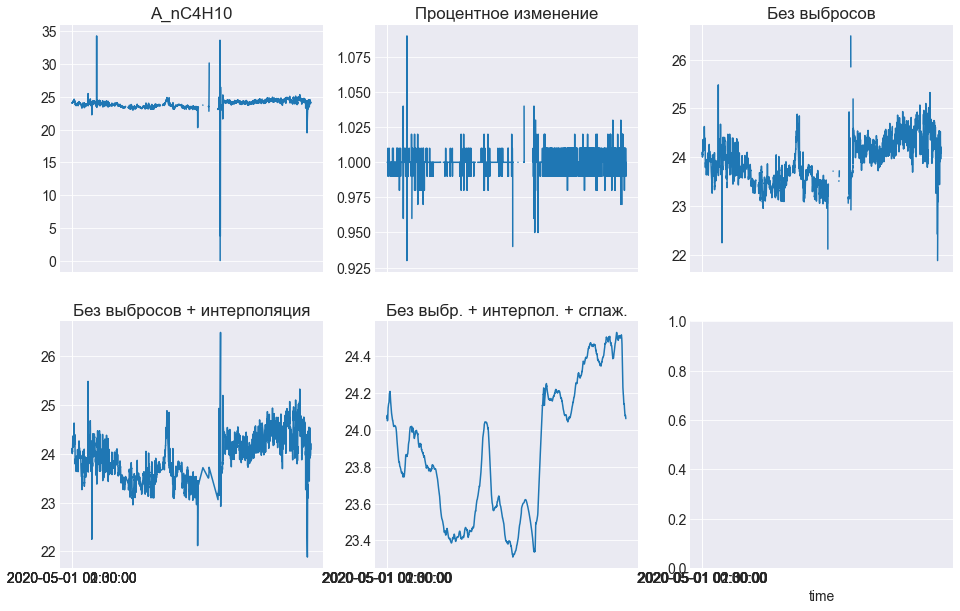

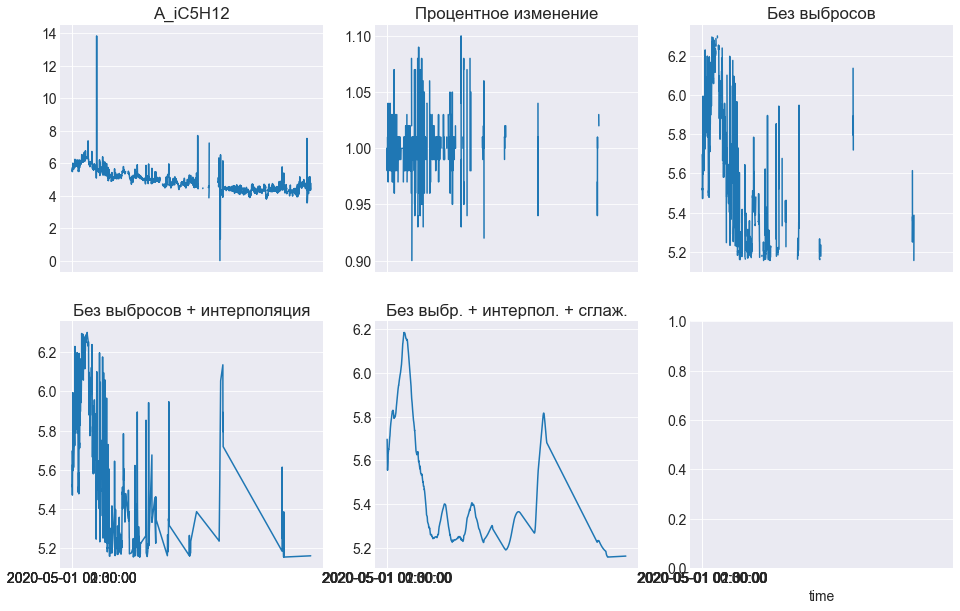

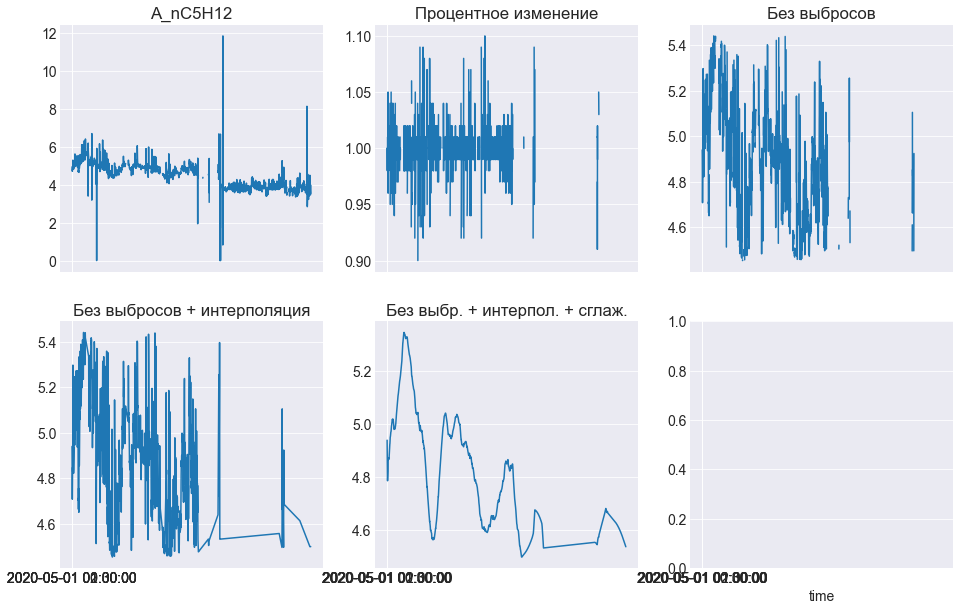

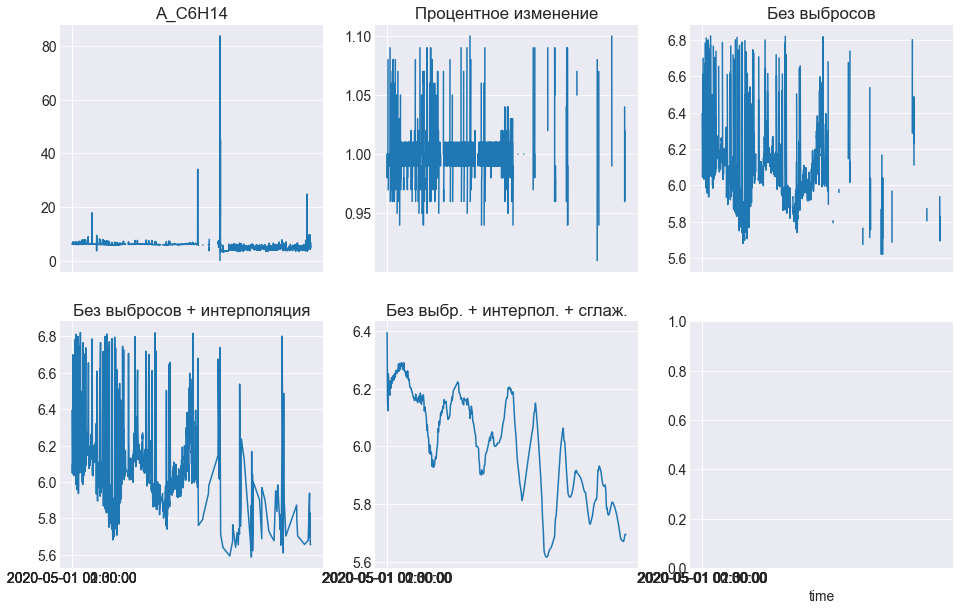

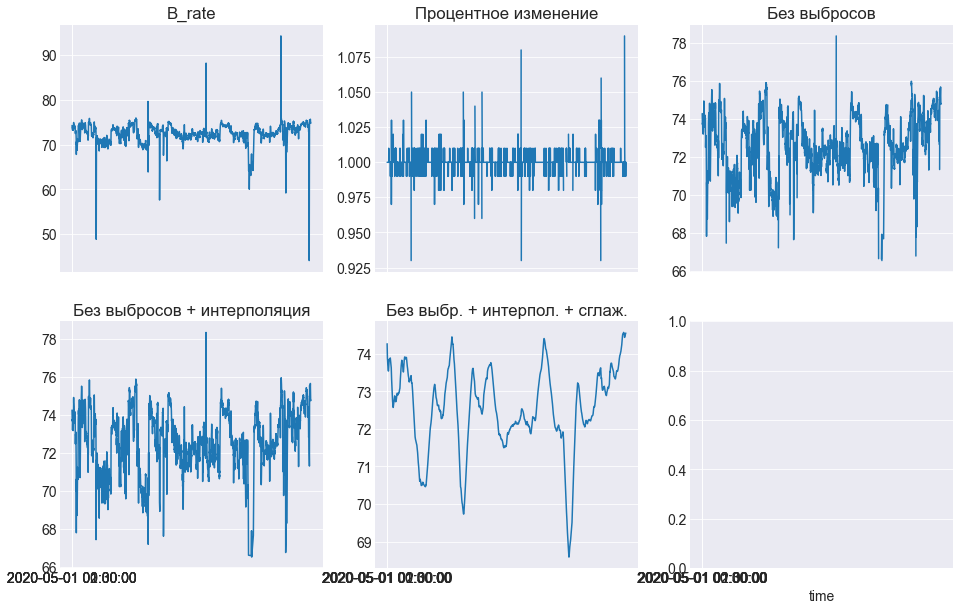

In [225]:
for value in train_feats:
    checkBounds(feat_test, value, [0.9,1.1], False, True)
    print('======================================================================================================')

In [226]:
lr = LinearRegression()
lr.fit(df_train[train_feats][9:].interpolate(axis=0), df_train[target_feats][9:])
test_preds = lr.predict(feat_test[train_feats])

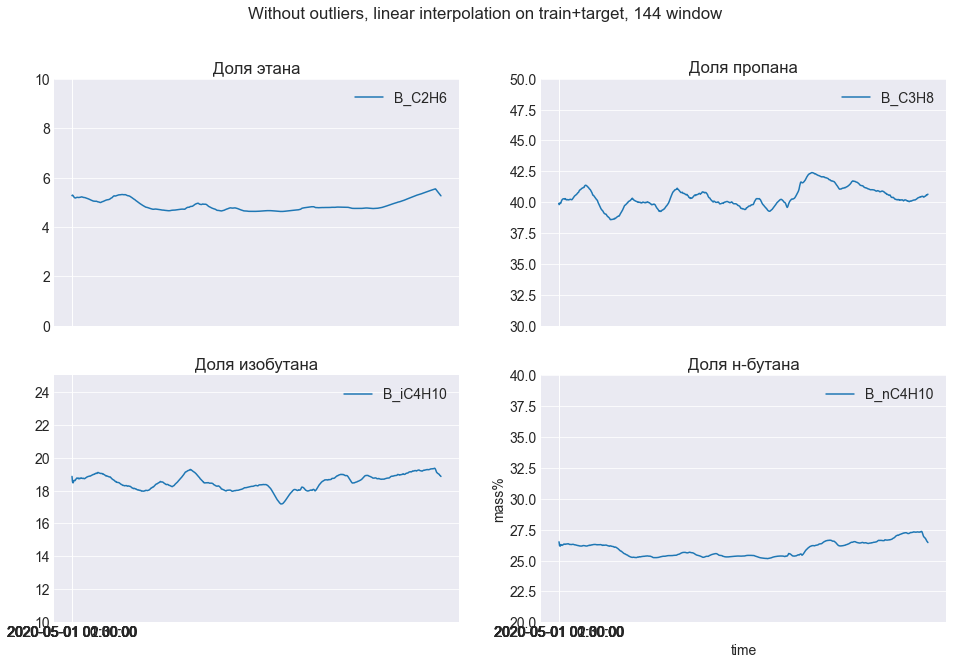

In [228]:
drawPreds(test_preds, 'Without outliers, linear interpolation on train+target, 144 window')

Получили 8.6734

### Without outliers(means on all previous points), linear interpolation on train+target, 1000 window

In [72]:
for value in (train_feats+target_feats):
    checkBounds(df_train, value, [0.7,1.3], True, False, 800)
    print('======================================================================================================')

TypeError: can't multiply sequence by non-int of type 'float'

In [73]:
for value in train_feats:
    checkBounds(feat_test, value, [0.7,1.3], False, True, 800)
    print('======================================================================================================')

TypeError: can't multiply sequence by non-int of type 'float'

In [63]:
df_train.isnull().sum()

timestamp    0
A_rate       0
A_CH4        0
A_C2H6       0
A_C3H8       0
A_iC4H10     0
A_nC4H10     0
A_iC5H12     0
A_nC5H12     0
A_C6H14      0
B_rate       0
B_C2H6       0
B_C3H8       0
B_iC4H10     0
B_nC4H10     0
dtype: int64

In [64]:
feat_test.isnull().sum()

timestamp    0
A_rate       0
A_CH4        0
A_C2H6       0
A_C3H8       0
A_iC4H10     0
A_nC4H10     0
A_iC5H12     0
A_nC5H12     0
A_C6H14      0
B_rate       0
dtype: int64

In [68]:
rf = RandomForestRegressor(n_estimators=50, max_depth=8, min_samples_split=4,n_jobs=-1)
rf.fit(df_train[train_feats].interpolate(axis=0), df_train[target_feats])
test_preds = rf.predict(feat_test[train_feats])

outputSubmission(test_preds, 'wo_ll_plainfirst100_tt_800_30%_rf.csv')

#drawPreds(test_preds, 'Without outliers, linear interpolation on train+target, 1000 window')

In [120]:
y_pred=[]
for i in range(4):
    grad_boost=GradientBoostingRegressor(n_estimators=500, loss='ls', 
                                         min_samples_split=2, learning_rate=0.1, 
                                         max_features='auto')
    grad_boost.fit(df_train[train_feats].interpolate(axis=0), df_train[target_feats].iloc[:,i])
    y_pred = grad_boost.predict(feat_test[train_feats])
    sample_sub[target_feats].iloc[:,i] = y_pred
outputSubmission(sample_sub[target_feats], 'wo_li_tt_1000_30%_gb.csv')

In [135]:
y_pred=[]
for i in range(4):
    xgb=XGBRegressor()
    xgb.fit(df_train[train_feats].interpolate(axis=0), df_train[target_feats].iloc[:,i])
    y_pred = xgb.predict(feat_test[train_feats])
    sample_sub[target_feats].iloc[:,i] = y_pred
outputSubmission(sample_sub[target_feats], 'wo_li_tt_1000_30%_xgb.csv')

In [112]:
grad_boost=GradientBoostingRegressor(n_estimators=500, loss='ls', 
                                     min_samples_split=2, learning_rate=0.1, 
                                     max_features='auto')
grad_boost.fit(df_train[train_feats].interpolate(axis=0), df_train[target_feats].iloc[:,0])
y_pred = grad_boost.predict(feat_test[train_feats])

30% 1000 window

In [59]:
X_train, X_test, y_train, y_test = train_test_split(df_train[train_feats], 
                                                    df_train[target_feats], test_size=0.2, random_state=23)
X=df_train[train_feats]
y=df_train[target_feats]

In [72]:
lr = LinearRegression()
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)

In [73]:
mape(y_test, y_pred)

0.389

In [63]:
clf = RidgeCV(alphas=[0.005, 0.001, 0.01, 0.1, 1]).fit(X_train, y_train)
clf.score(X_train, y_train)

0.9669202470101197

In [71]:
ridgeReg = Ridge(alpha=0.001).fit(X_train, y_train)
y_pred = ridgeReg.predict(X_test)
mape(y_test, y_pred)

0.389

In [74]:
params = {
    'n_estimators': [50, 100, 200, 300, 500],
    'max_depth': [1,2,3,4,5,6,8],
    'min_samples_split': [2,4,6,8],
    
}
random_forest = RandomForestRegressor(n_jobs=-1)
gc_cv = GridSearchCV(random_forest, params)
gc_cv.fit(X_train, y_train)
print(gc_cv.best_score_, gc_cv.best_params_)

0.9985796615554365 {'max_depth': 8, 'min_samples_split': 4, 'n_estimators': 50}


In [75]:
random_forest=RandomForestRegressor(n_estimators=50, max_depth=8, min_samples_split=4,n_jobs=-1).fit(X_train, y_train)
y_pred = random_forest.predict(X_test)
mape(y_test, y_pred)

0.047

In [90]:
params = {
    'n_estimators': [50, 100, 200, 300, 500],
    'loss': ['ls', 'lad', 'huber', 'quantile'],
    'learning_rate': [0.001, 0.01, 0.1, 0.5, 1],
    'min_samples_split': [2,4,6,8],
    'max_features': ['auto', 'sqrt', 'log2']
    
}
grad_boost = GradientBoostingRegressor()
gc_cv = GridSearchCV(grad_boost, params)
for i in range(4):
    gc_cv.fit(X_train, y_train.iloc[:,i])
    print(i, gc_cv.best_score_, gc_cv.best_params_)

0 0.9997788282219225 {'learning_rate': 0.1, 'loss': 'ls', 'max_features': 'sqrt', 'min_samples_split': 2, 'n_estimators': 500}
1 0.9996007428817999 {'learning_rate': 0.1, 'loss': 'ls', 'max_features': 'sqrt', 'min_samples_split': 8, 'n_estimators': 500}
2 0.9991917514253859 {'learning_rate': 0.1, 'loss': 'ls', 'max_features': 'auto', 'min_samples_split': 2, 'n_estimators': 500}
3 0.9994474912646252 {'learning_rate': 0.1, 'loss': 'ls', 'max_features': 'auto', 'min_samples_split': 6, 'n_estimators': 500}


In [97]:
for i in range(4):
    grad_boost=GradientBoostingRegressor(n_estimators=500, loss='ls', 
                                         min_samples_split=2, learning_rate=0.1, 
                                         max_features='auto').fit(X_train, y_train.iloc[:,i])
    y_pred = grad_boost.predict(X_test)
    print(mape(y_test.iloc[:,i], y_pred))

0.107
0.022
0.018
0.017


In [134]:
for i in range(4):
    xgb=XGBRegressor().fit(X_train, y_train.iloc[:,i])
    y_pred = xgb.predict(X_test)
    print(mape(y_test.iloc[:,i], y_pred))

0.095
0.018
0.015
0.014


In [16]:
def plot4(df_c, gas, window):
    fig, ax = plt.subplots(ncols=2, nrows=2, sharex=True, figsize=(16, 10))

    ax[0,0].plot(df_c['timestamp'], df_c[gas])
    ax[0,0].plot(df_c['timestamp'], df_c['filtered_gas'].interpolate(axis=0).rolling(window=window, min_periods=1).mean())
    ax[0,0].set_title(gas)

    ax[0,1].plot(df_c['timestamp'], df_c['filtered_gas'])
    ax[0,1].set_title('Без выбросов')

    ax[1,0].plot(df_c['timestamp'], df_c['filtered_gas'].interpolate(axis=0))
    ax[1,0].set_title('Без выбросов + интерполяция')

    ax[1,1].plot(df_c['timestamp'], df_c['filtered_gas'].interpolate(axis=0).rolling(window=window, min_periods=1).mean())
    ax[1,1].set_title('Без выбр. + интерпол. + сглаж.')

    plt.xticks(np.arange(5))
    plt.xlabel('time')
    plt.style.use('seaborn-darkgrid')
    plt.show()

In [17]:
def filterColumn(df, gas, inplace_train=False, inplace_test=False, window=1000):
    df_c = df.copy(deep=True)
    if gas in ['A_rate', 'B_rate']:
        thres = [75,65]
    elif gas == 'A_CH4':
        thres = [0.3,0.07]
    elif gas in ['A_C2H6', 'B_C2H6']:
        thres = [5.5,3]
    elif gas in ['A_C3H8', 'B_C3H8']:
        thres = [41,35]
    elif gas in ['A_iC4H10', 'B_iC4H10']:
        thres = [19,16.5]
    elif gas in ['A_nC4H10', 'B_nC4H10']:
        thres = [27,22]
    elif gas in ['A_iC5H12', 'A_nC5H12']:
        thres = [6.5,4]
    elif gas == 'A_C6H14':
        thres = [7,3]
    filtered = []
    for i, value in enumerate(df_c[gas].values):
        if value<thres[1] or value>thres[0]:
            filtered.append(np.nan)
        else:
            filtered.append(value)
    df_c['filtered_gas'] = filtered
    
    if inplace_train:
        df_train[gas] = df_c['filtered_gas'].interpolate(axis=0).rolling(window=window, min_periods=1).mean()
    if inplace_test:
        feat_test[gas] = df_c['filtered_gas'].interpolate(axis=0).rolling(window=window, min_periods=1).mean()
        
    plot4(df_c, gas, window)

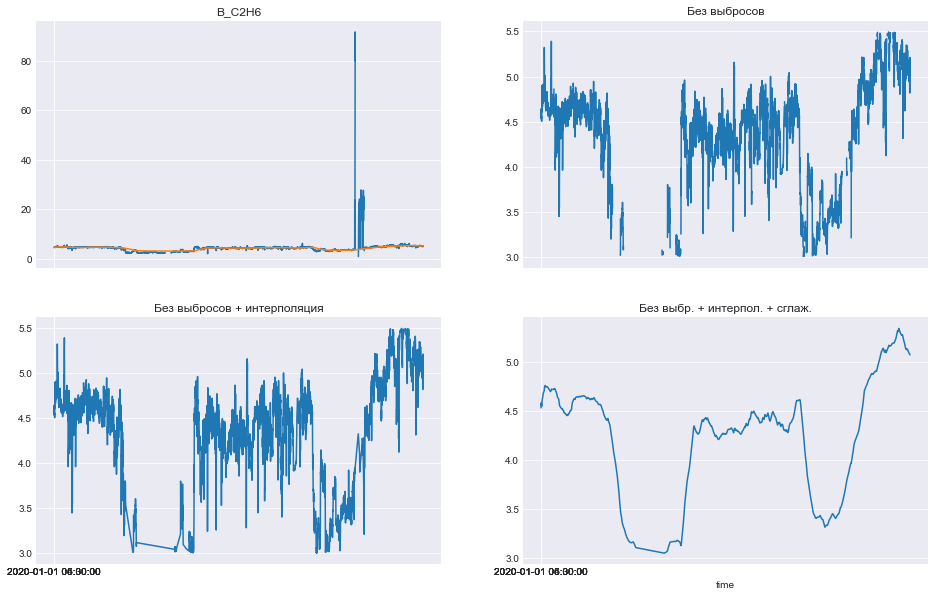

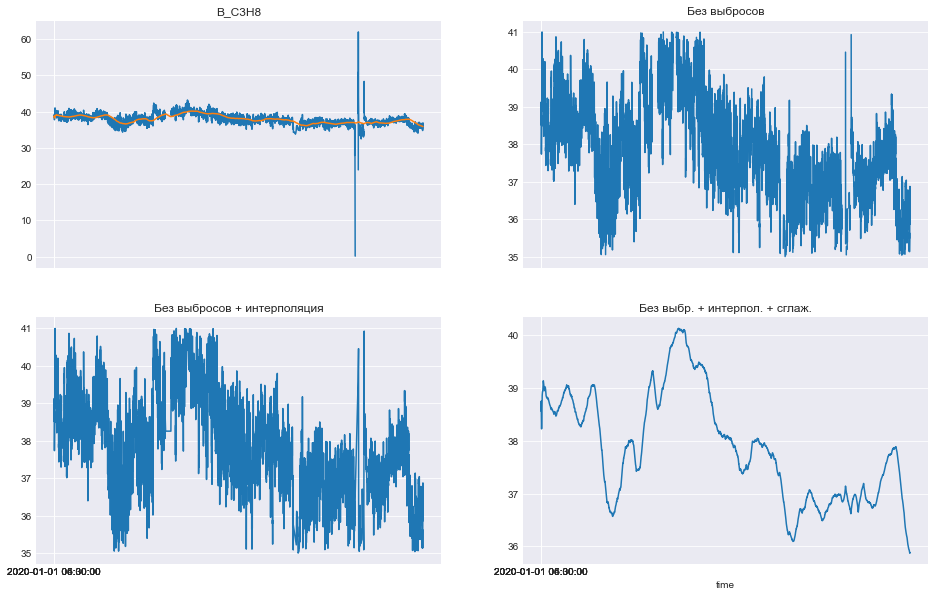

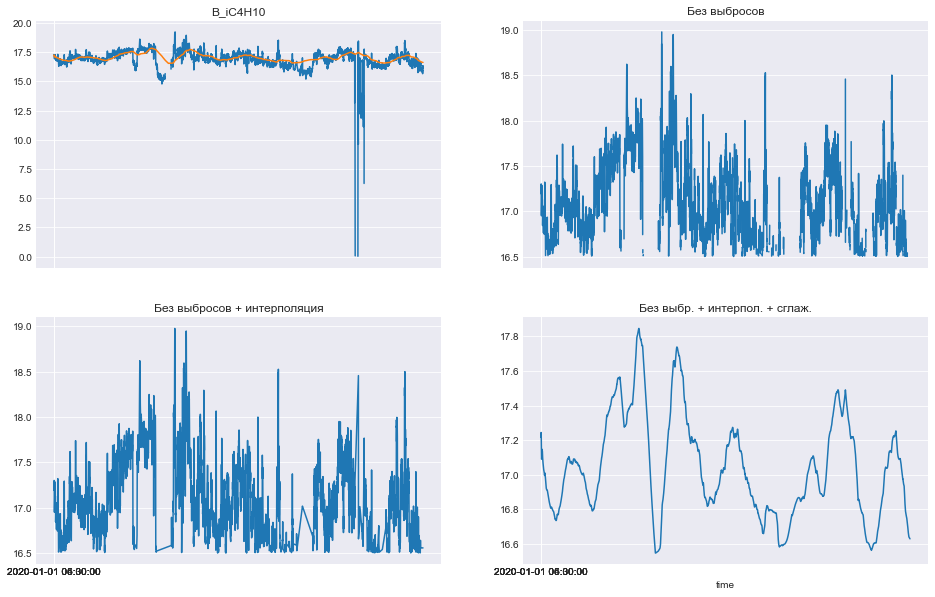

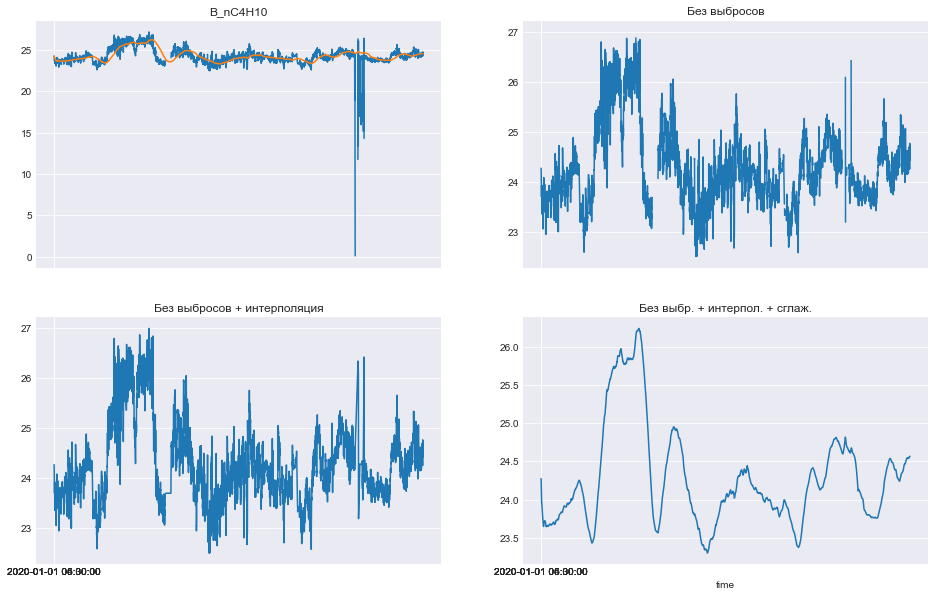

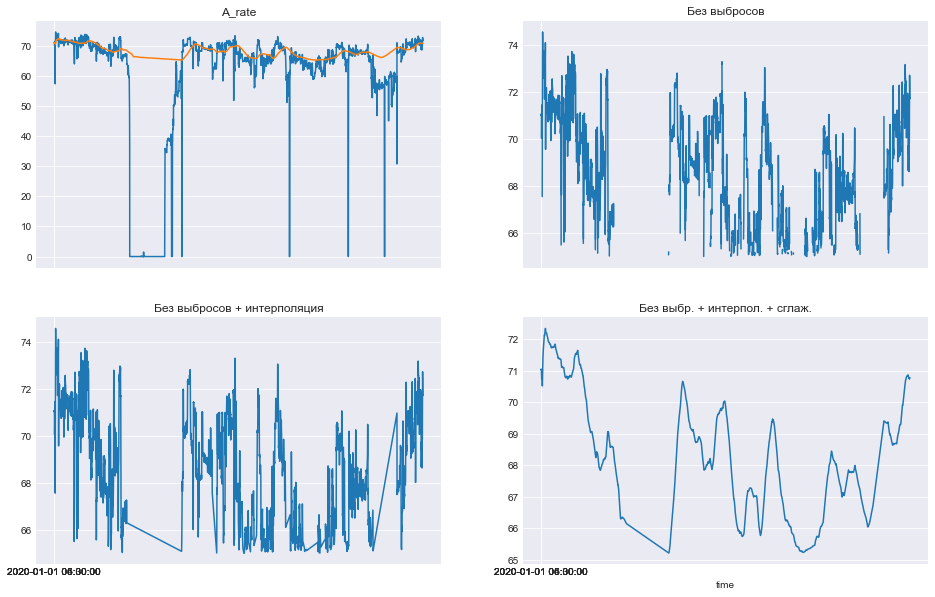

...

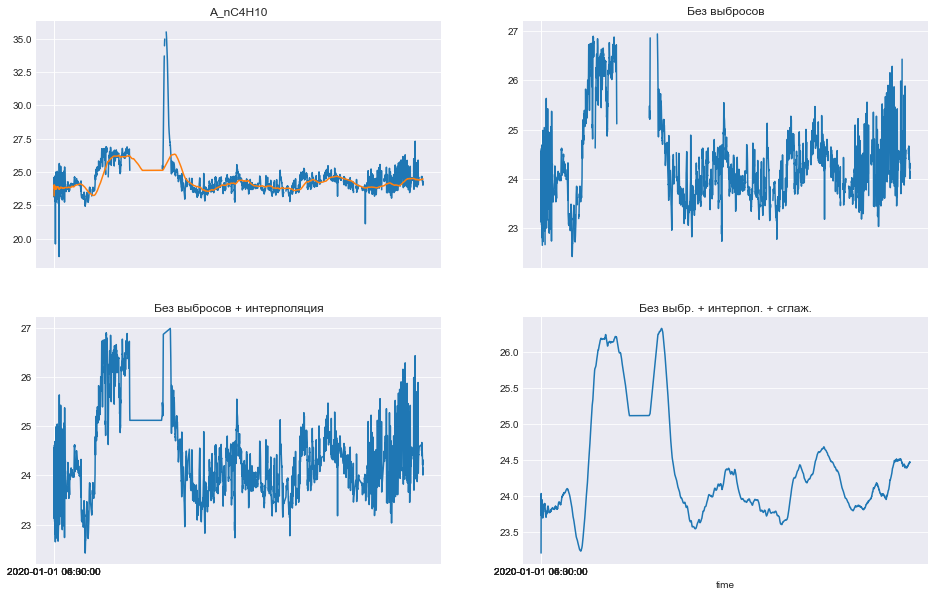

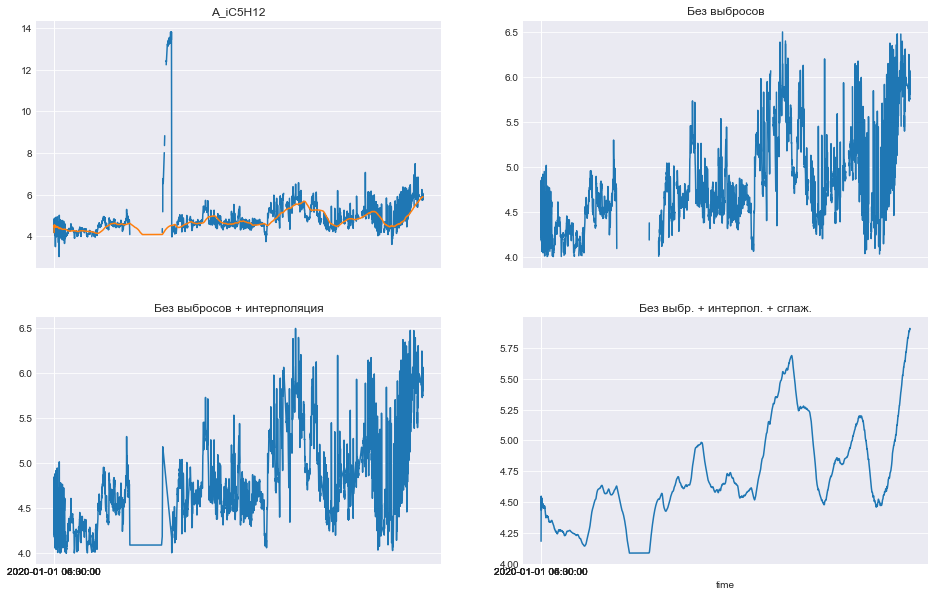

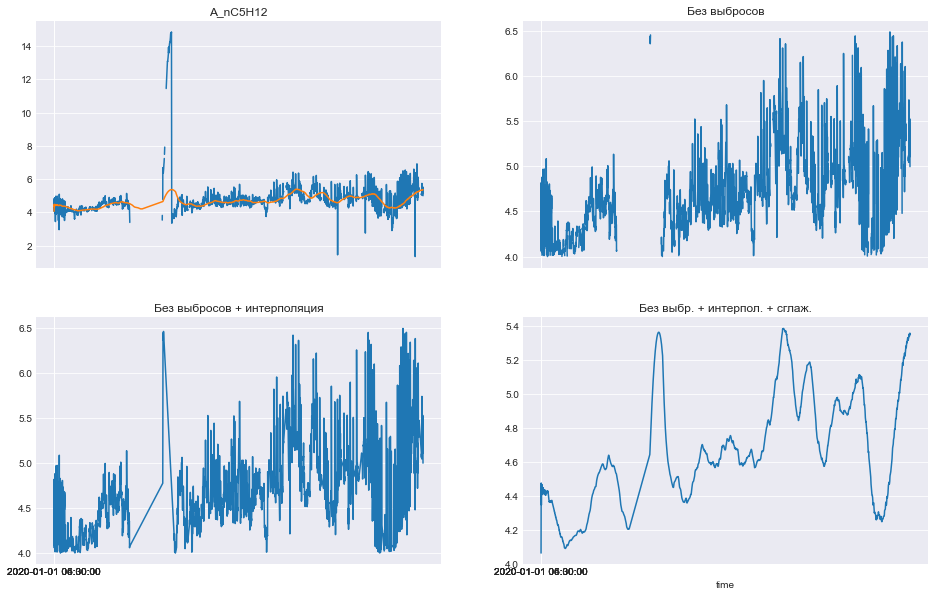

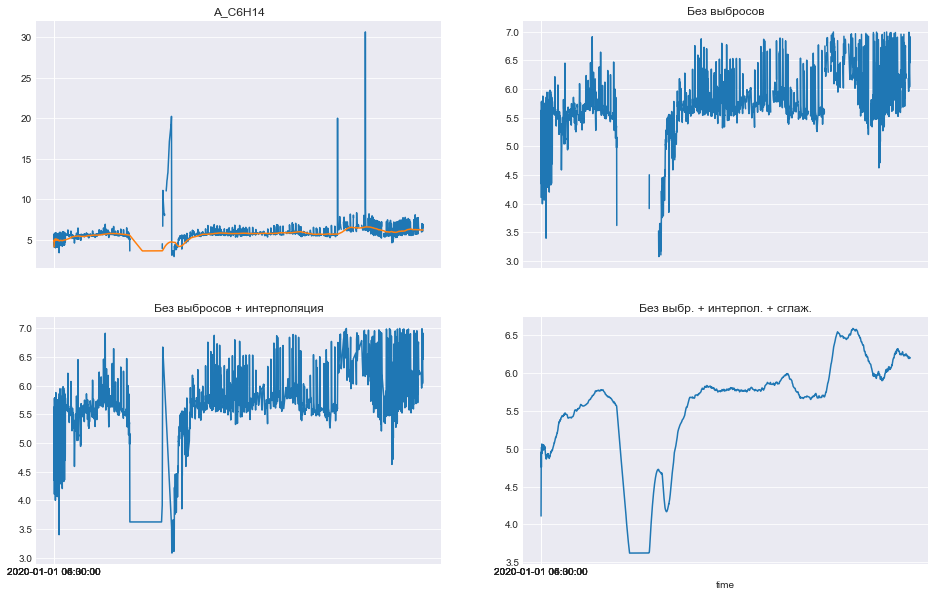

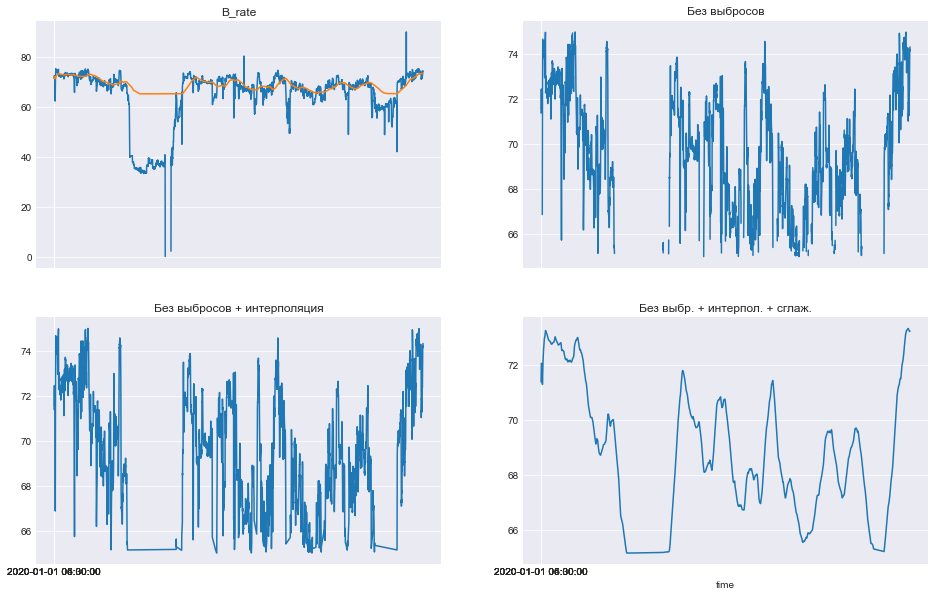

In [440]:
for col in target_feats+train_feats:
    filterColumn(df_train, col, True, False, 200)

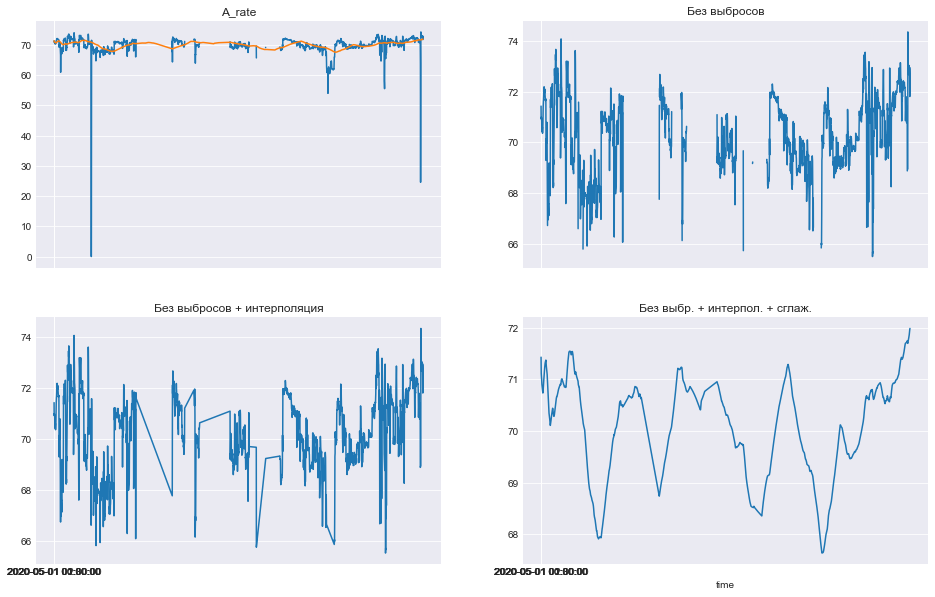

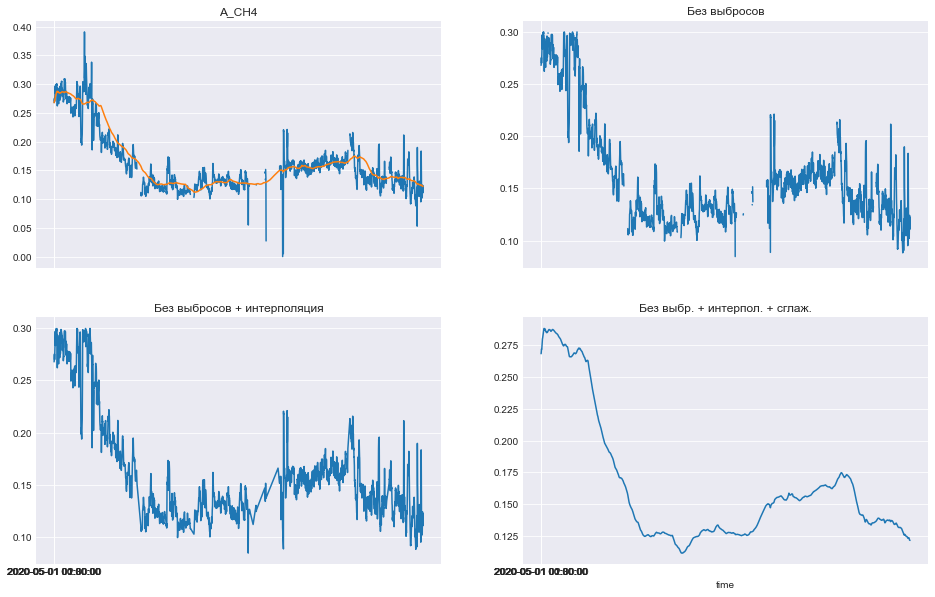

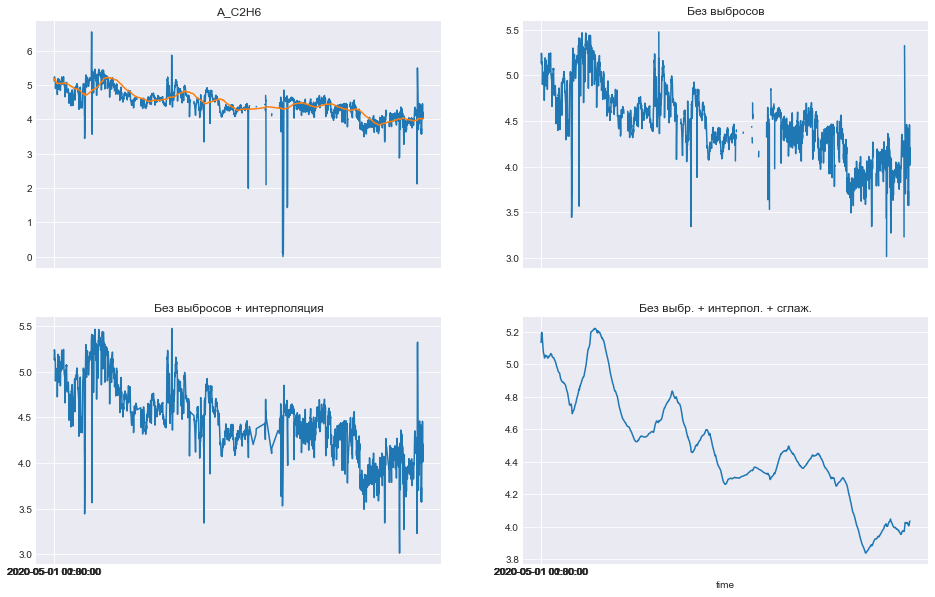

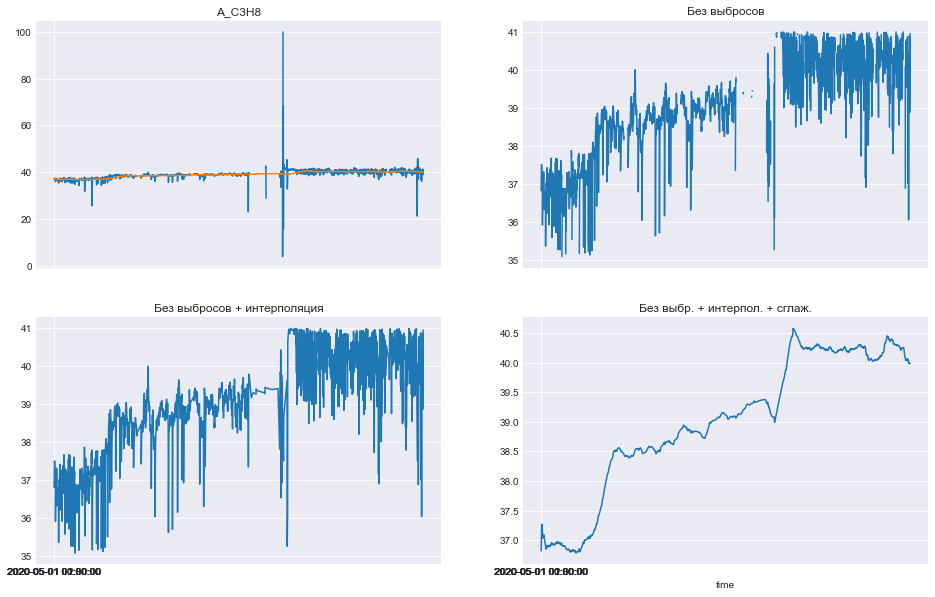

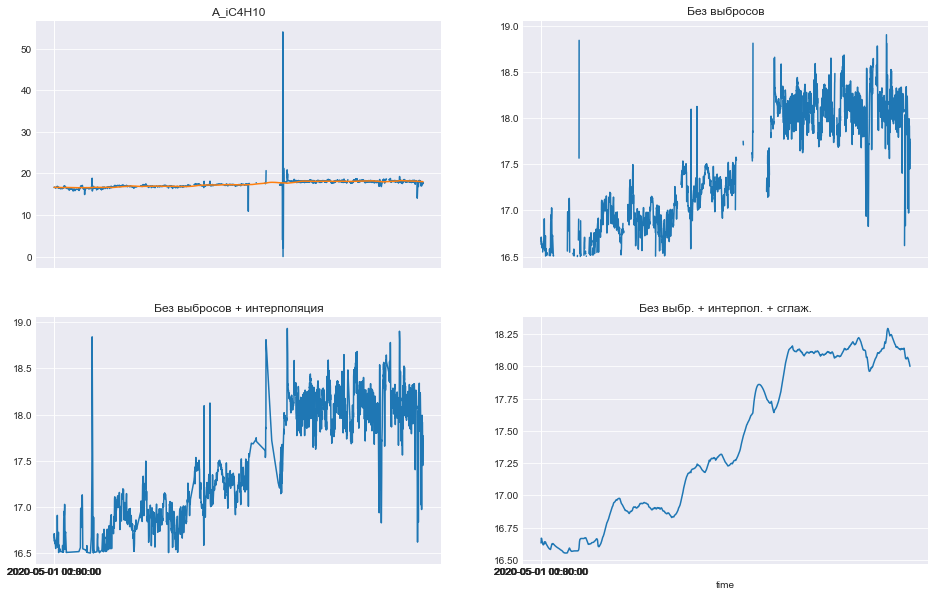

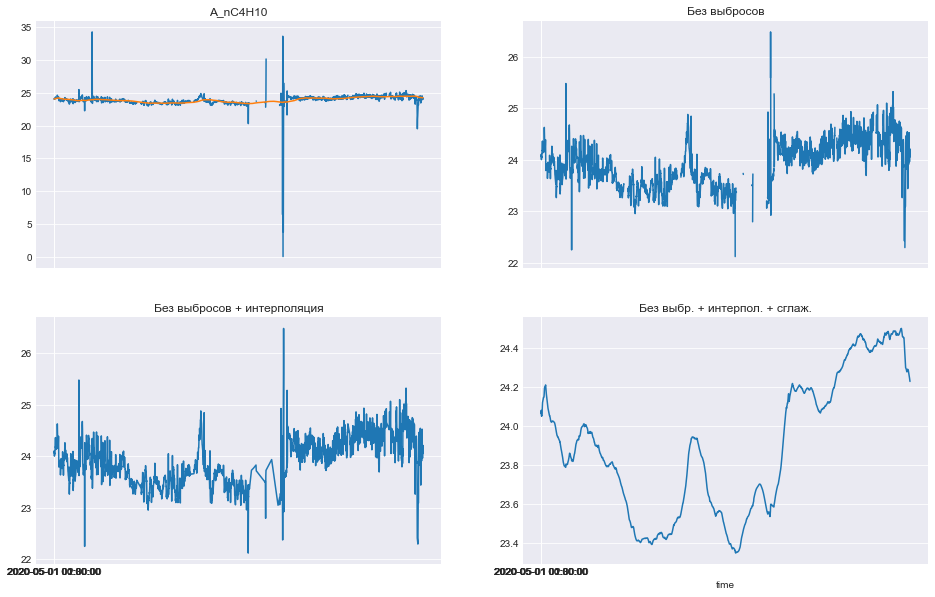

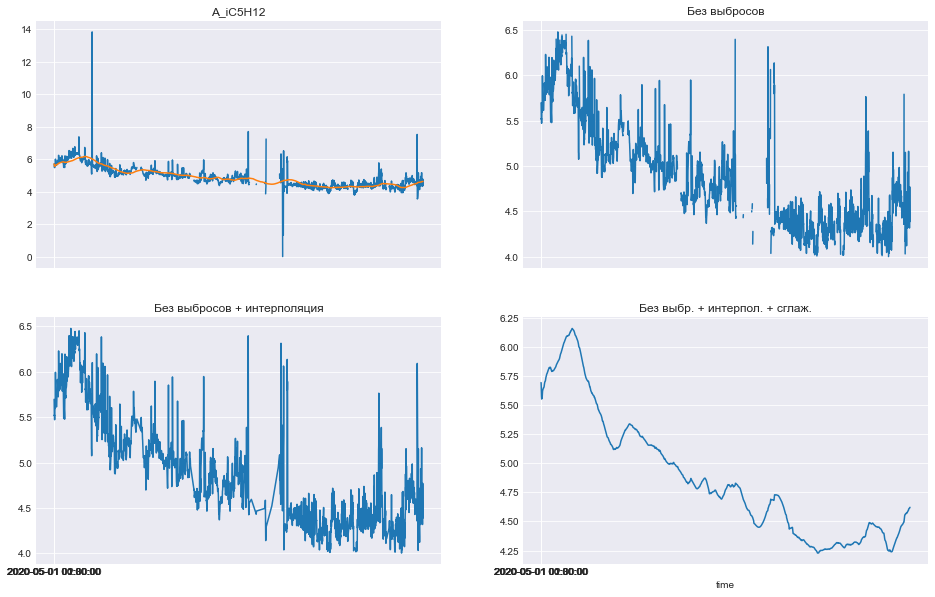

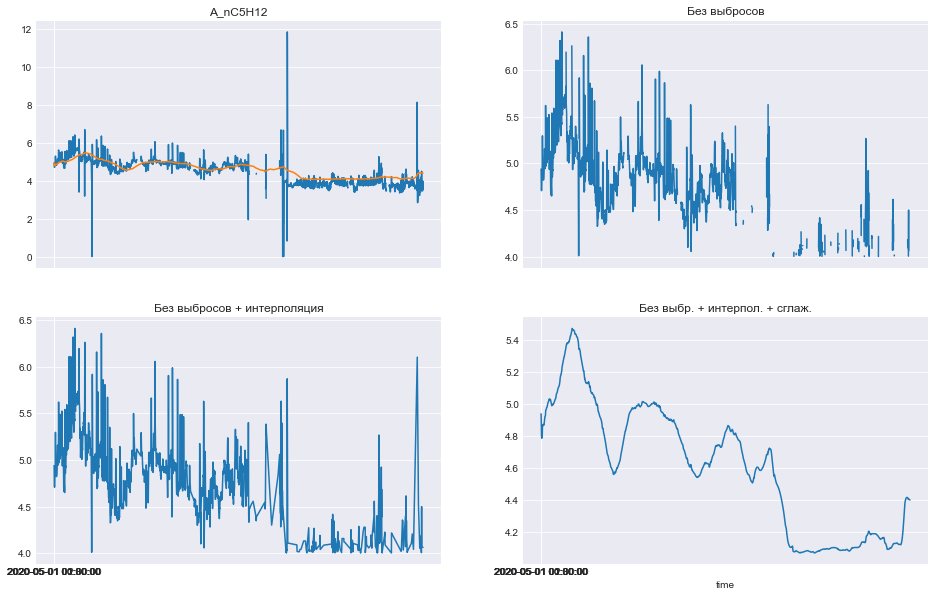

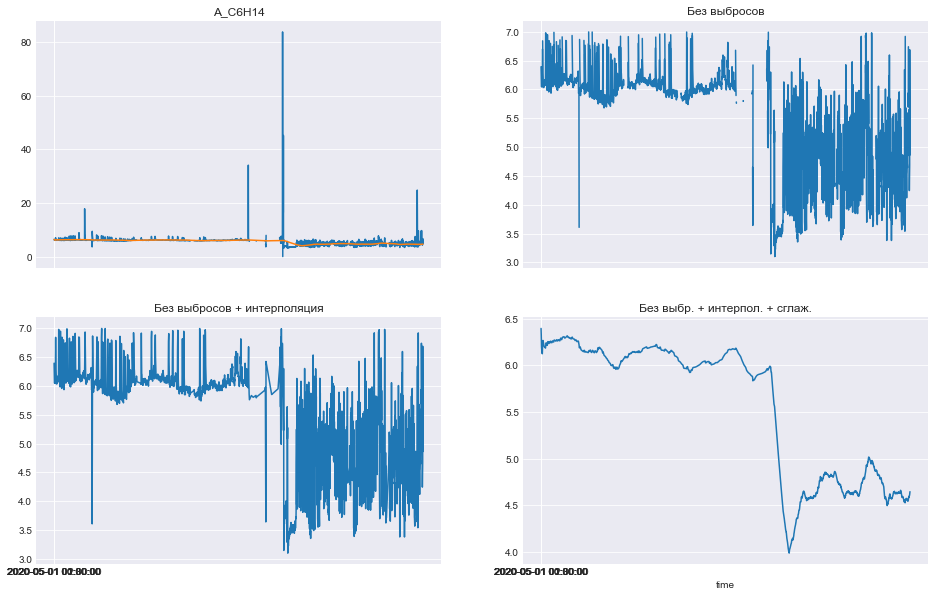

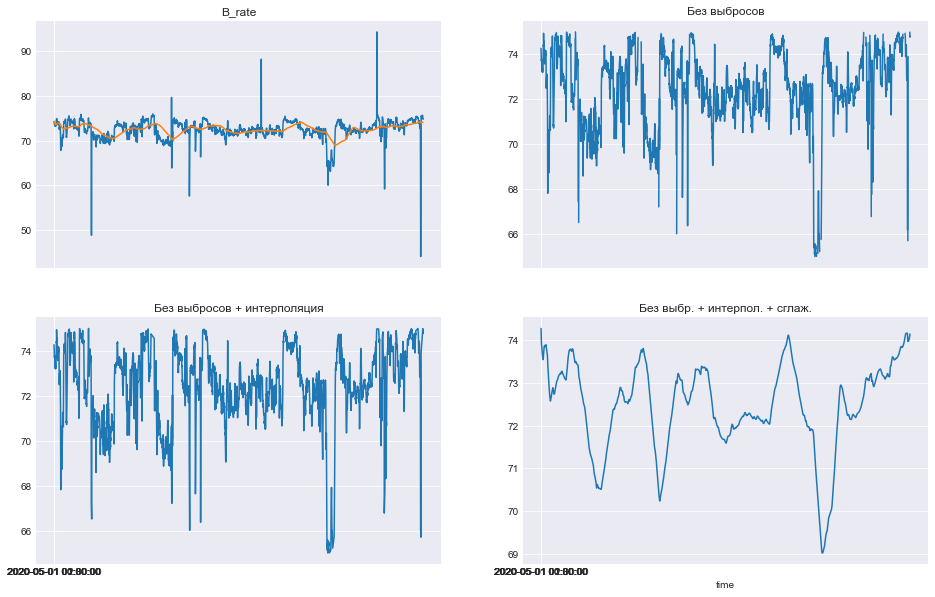

In [441]:
for col in train_feats:
    filterColumn(feat_test, col, False, True, 200)

In [446]:
df_train['A_C3H8'].iloc[0] = df_train['A_C3H8'].iloc[1]

In [447]:
df_train.isnull().sum()

timestamp    0
A_rate       0
A_CH4        0
A_C2H6       0
A_C3H8       0
A_iC4H10     0
A_nC4H10     0
A_iC5H12     0
A_nC5H12     0
A_C6H14      0
B_rate       0
B_C2H6       0
B_C3H8       0
B_iC4H10     0
B_nC4H10     0
dtype: int64

In [434]:
X_train, X_test, y_train, y_test = train_test_split(df_train[train_feats], 
                                                    df_train[target_feats], test_size=0.2, random_state=23)
X=df_train[train_feats]
y=df_train[target_feats]

In [448]:
params = {
    'n_estimators': [50, 100, 200, 300, 500],
    'max_depth': [1,2,3,4,5,6,8],
    'min_samples_split': [2,4,6,8],
    
}
random_forest = RandomForestRegressor(n_jobs=-1)
gc_cv = GridSearchCV(random_forest, params)
gc_cv.fit(X_train, y_train)
print(gc_cv.best_score_, gc_cv.best_params_)

0.9988985500761143 {'max_depth': 8, 'min_samples_split': 8, 'n_estimators': 50}


In [436]:
random_forest=RandomForestRegressor(n_estimators=500, max_depth=8, min_samples_split=2,n_jobs=-1).fit(X_train, y_train)
y_pred = random_forest.predict(X_test)
mape(y_test, y_pred)

0.034

In [437]:
random_forest=RandomForestRegressor(n_estimators=50, max_depth=8, min_samples_split=4,n_jobs=-1).fit(X_train, y_train)
y_pred = random_forest.predict(X_test)
mape(y_test, y_pred)

0.035

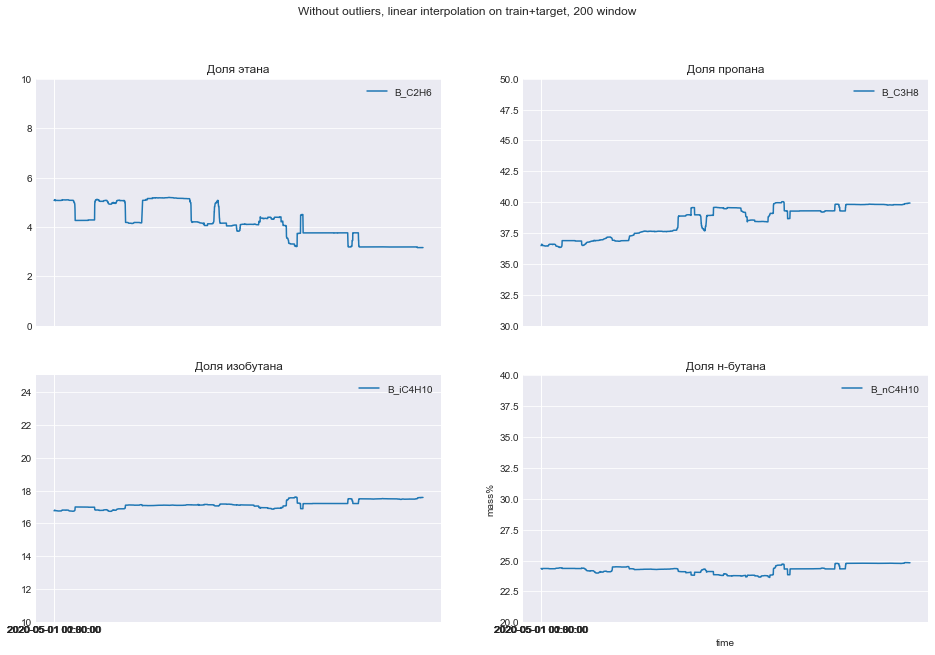

In [449]:
rf = RandomForestRegressor(n_estimators=50, max_depth=8, min_samples_split=8,n_jobs=-1)
rf.fit(df_train[train_feats].interpolate(axis=0), df_train[target_feats])
test_preds = rf.predict(feat_test[train_feats])

outputSubmission(test_preds, 'wo_li_handthresh_tt_200_rf.csv')

drawPreds(test_preds, 'Without outliers, linear interpolation on train+target, 200 window')

In [54]:
df_scores.sort_values('Результат')

,Результат,Описание сабмита
6,2.73,"Удаляем выбросы(третья версия на основе всех предыдущих значений-30% плюс 20% окно на первые 100 значений), интерполируем линейно, сглаживаем на 1000 точек random forest"
4,2.74,"Удаляем выбросы(третья версия на основе всех предыдущих значений-30% плюс 20% окно на первые 100 значений), интерполируем линейно, сглаживаем на 1000 точек random forest"
5,2.77,"Удаляем выбросы(третья версия на основе всех предыдущих значений-30% плюс 20% окно на первые 50 значений), интерполируем линейно, сглаживаем на 1000 точек random forest"
7,2.93,"Удаляем выбросы(вторая версия на основе всех предыдущих значений-30%), интерполируем линейно, сглаживаем на 1000 точек random forest"
14,3.02,"Вручную подобранные интервалы для каждой колонки, сглаживание на 1000 значений, random forest"
0,3.14,Sample submission(горизонтальные прямые средних)
13,3.74,"Удаляем выбросы(вторая версия на основе всех предыдущих значений-30%), интерполируем линейно, сглаживаем на 1000 точек"
10,3.85,"Удаляем выбросы(вторая версия на основе всех предыдущих значений-20%), интерполируем линейно, сглаживаем на 1000 точек"
12,4.44,"Удаляем выбросы(вторая версия на основе всех предыдущих значений-20%), интерполируем линейно, сглаживаем на 1500 точек"
15,4.50,"Вручную подобранные интервалы для каждой колонки, сглаживание на 200 значений, random forest"


# Вторая версия

In [18]:
feat_train = pd.read_csv('train_features.csv')
target_train = pd.read_csv('train_targets.csv')
feat_test = pd.read_csv('test_features.csv')
sample_sub = pd.read_csv('sample_submission.csv')

target_feats = ['B_C2H6', 'B_C3H8', 'B_iC4H10', 'B_nC4H10']
not_train_target_feats = ['A_rate', 'A_CH4', 'A_iC5H12', 'A_nC5H12', 'A_C6H14', 'B_rate']
train_feats = ['A_rate', 'A_CH4','A_C2H6', 'A_C3H8', 'A_iC4H10', 'A_nC4H10', 'A_iC5H12', 'A_nC5H12', 'A_C6H14', 'B_rate']
df_train = pd.concat([feat_train, target_train[target_feats]], axis=1)[9:]

In [75]:
df_train.head()

,timestamp,A_rate,A_CH4,A_C2H6,A_C3H8,A_iC4H10,A_nC4H10,A_iC5H12,A_nC5H12,A_C6H14,B_rate,B_C2H6,B_C3H8,B_iC4H10,B_nC4H10
9,2020-01-01 04:30:00,71.055792,0.126244,5.242957,41.941480,17.064213,23.205953,4.184848,4.062079,4.110170,71.389674,4.532649,38.604149,17.238489,24.275393
10,2020-01-01 05:00:00,71.029881,0.111301,4.632455,39.198330,17.440245,24.331520,4.615703,4.545702,5.072316,71.792506,4.578543,38.510623,17.193441,24.242152
11,2020-01-01 05:30:00,71.008884,0.125176,4.730933,37.874656,17.353362,24.567692,4.847911,4.818913,5.626975,71.939558,4.642879,39.124029,17.301609,24.211492
12,2020-01-01 06:00:00,71.060109,0.141546,5.214231,39.763493,17.098163,23.758240,4.512244,4.429068,5.021207,72.124690,4.549837,38.247333,17.118282,24.044074
13,2020-01-01 06:30:00,71.067865,0.143911,5.440833,41.616510,16.964787,23.121613,4.212636,4.088066,4.347822,72.278288,4.556611,37.985776,17.038811,23.931490


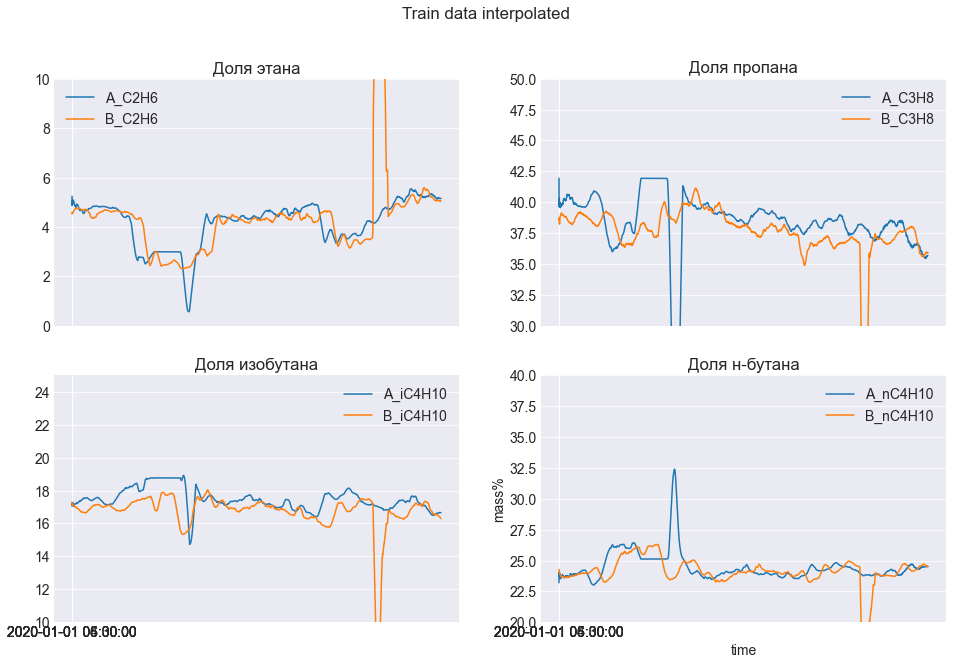

In [107]:
plotTargetGases(df_train.interpolate(axis=0, method='polynomial', order=1), 
                b_feats=True, a_feats=True, 
                rolling=True, window=100,
                title='Train data interpolated')

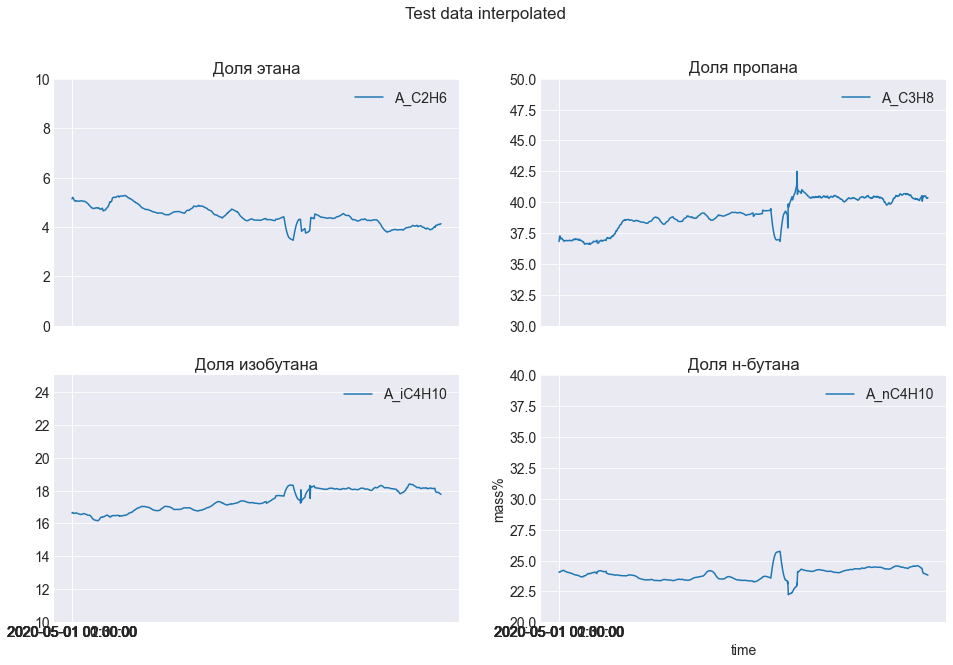

In [104]:
plotTargetGases(feat_test.interpolate(axis=0, method='polynomial', order=1), 
                b_feats=False, a_feats=True, 
                rolling=True, window=100,
                title='Test data interpolated')

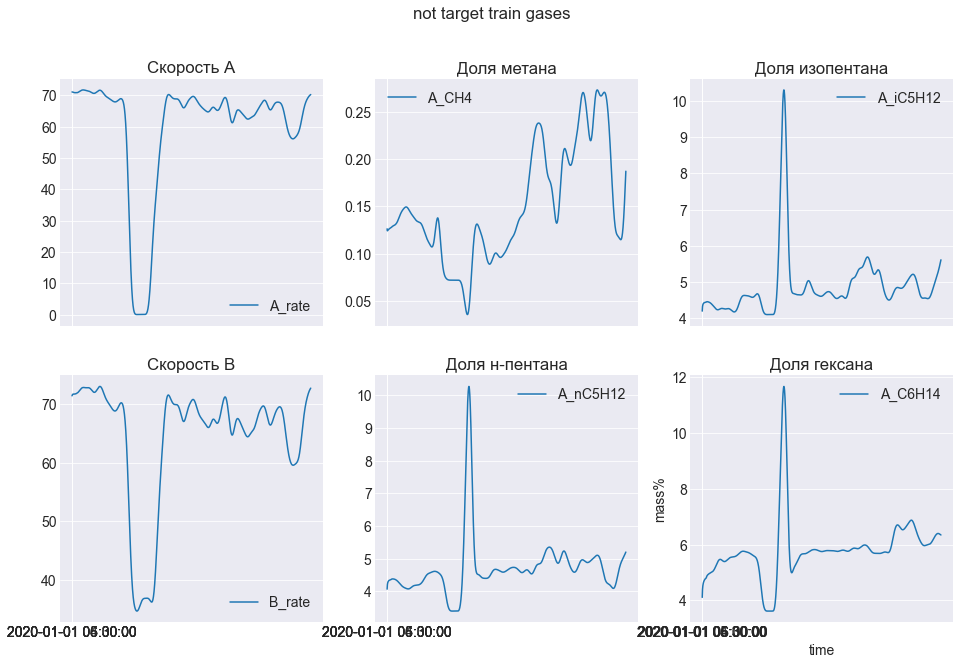

In [105]:
plotTrainGases(df_train, rolling=True, window=100, title='not target train gases')

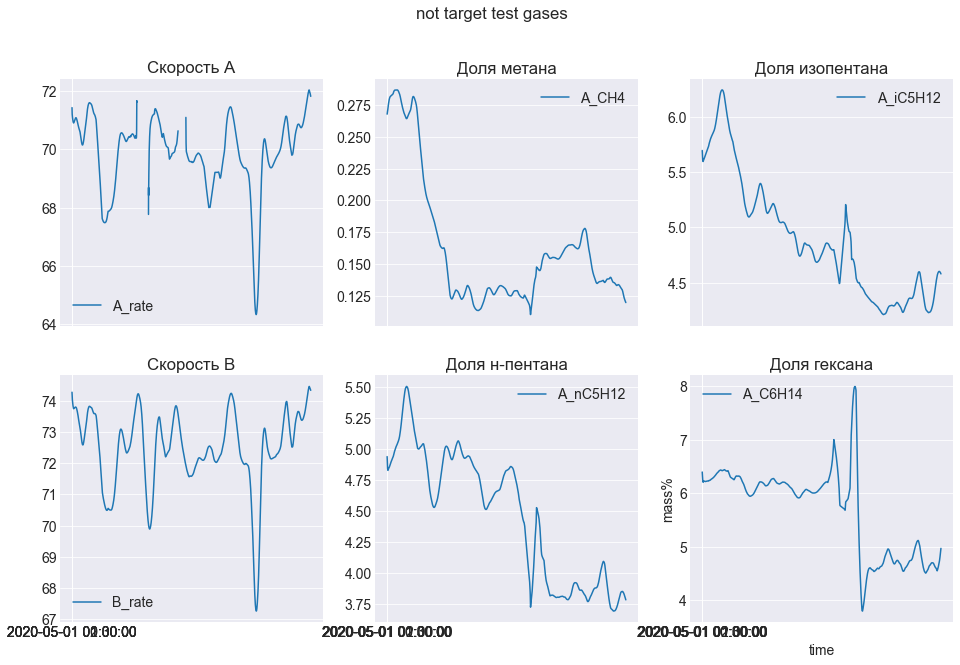

In [106]:
plotTrainGases(feat_test, rolling=True, window=100, title='not target test gases')

In [155]:
date_time_str_0 = df_train['timestamp'].values[0]

In [185]:
date_time_0 = datetime.datetime.strptime(date_time_str_0, '%Y-%m-%d %H:%M:%S')

In [186]:
date_time_str_1 = df_train['timestamp'].values[1]
date_time_48 = datetime.datetime.strptime(date_time_str_1, '%Y-%m-%d %H:%M:%S')

In [187]:
date_time_0-date_time_48

datetime.timedelta(days=-1, seconds=84600)

In [189]:
date_time_0

datetime.datetime(2020, 1, 1, 4, 30)

In [188]:
date_time_0 + datetime.timedelta(1,0)

datetime.datetime(2020, 1, 2, 4, 30)

In [172]:
datetime.strftime(date_time_0, '%Y-%m-%d %H:%M:%S')

'2020-01-01 04:30:00'

In [19]:
# Отрезаем первые 4 дня от output и последние 4 дня от input
def plotTargetGasesShifted():
    new_dates = []
    for date in df_train['timestamp'].values:
        # Переводим строку в объект даты и добавляем 4 дня
        new_date = datetime.datetime.strptime(date, '%Y-%m-%d %H:%M:%S')+datetime.timedelta(4,0)
        # Переводим объект даты обратно в строку
        new_dates.append(datetime.datetime.strftime(new_date, '%Y-%m-%d %H:%M:%S'))
        
    fig, ax = plt.subplots(ncols=2, nrows=2, sharex=True, figsize=(16, 10))

    ax[0,0].plot(new_dates[:-192], df_train['A_C2H6'][:-192].interpolate(axis=0, method='polynomial', order=1)\
         .rolling(window=100, min_periods=1).mean(), label='input')
    ax[0,0].plot(df_train['timestamp'][192:], df_train['B_C2H6'][192:].interpolate(axis=0, method='polynomial', order=1)\
         .rolling(window=100, min_periods=1).mean(), label='output')
    ax[0,0].set_title('A_C2H6')
    ax[0,0].set_ylim([0,10])
    ax[0,0].legend()
    
    ax[0,1].plot(new_dates[:-192], df_train['A_C3H8'][:-192].interpolate(axis=0, method='polynomial', order=1)\
         .rolling(window=100, min_periods=1).mean(), label='input',)
    ax[0,1].plot(df_train['timestamp'][192:], df_train['B_C3H8'][192:].interpolate(axis=0, method='polynomial', order=1)\
         .rolling(window=100, min_periods=1).mean(), label='output')
    ax[0,1].set_title('A_C3H8')
    ax[0,1].set_ylim([35,45])
    ax[0,1].legend()
    
    ax[1,0].plot(new_dates[:-192], df_train['A_nC4H10'][:-192].interpolate(axis=0, method='polynomial', order=1)\
         .rolling(window=100, min_periods=1).mean(), label='input',)
    ax[1,0].plot(df_train['timestamp'][192:], df_train['B_nC4H10'][192:].interpolate(axis=0, method='polynomial', order=1)\
         .rolling(window=100, min_periods=1).mean(), label='output')
    ax[1,0].set_title('A_nC4H10')
    ax[1,0].set_ylim([20,30])
    ax[1,0].legend()
    
    ax[1,1].plot(new_dates[:-192], df_train['A_iC4H10'][:-192].interpolate(axis=0, method='polynomial', order=1)\
         .rolling(window=100, min_periods=1).mean(), label='input',)
    ax[1,1].plot(df_train['timestamp'][192:], df_train['B_iC4H10'][192:].interpolate(axis=0, method='polynomial', order=1)\
         .rolling(window=100, min_periods=1).mean(), label='output')
    ax[1,1].set_title('A_iC4H10')
    ax[1,1].set_ylim([15,20])
    ax[1,1].legend()
    
    plt.xticks(np.arange(5))
    plt.xlabel('time')
    plt.style.use('seaborn-darkgrid')
    plt.show()

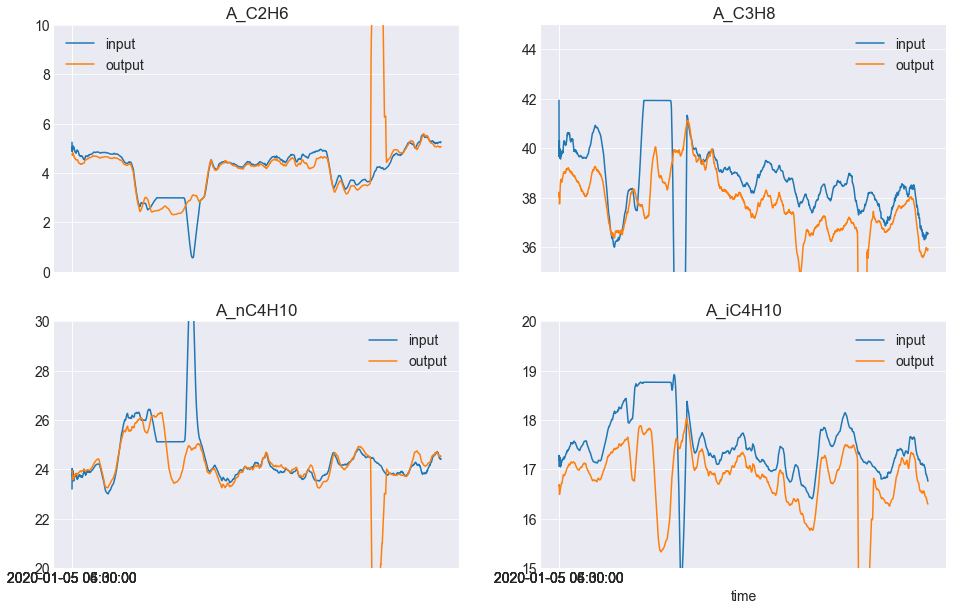

In [224]:
plotTargetGasesShifted()

In [228]:
df_train.isnull().sum()

timestamp      0
A_rate         0
A_CH4          0
A_C2H6       950
A_C3H8       950
A_iC4H10     950
A_nC4H10     950
A_iC5H12       0
A_nC5H12       0
A_C6H14        0
B_rate         0
B_C2H6       184
B_C3H8       180
B_iC4H10     180
B_nC4H10     180
dtype: int64

На точку В из точки А газы доходят за 4 дня.

In [233]:
df_train.set_index('timestamp')['A_C2H6'].interpolate(axis=0)

timestamp
2020-01-01 04:30:00    5.242957
2020-01-01 05:00:00    4.632455
2020-01-01 05:30:00    4.730933
2020-01-01 06:00:00    5.214231
2020-01-01 06:30:00    5.440833
                         ...   
2020-04-30 21:30:00    4.936343
2020-04-30 22:00:00    4.960453
2020-04-30 22:30:00    5.013878
2020-04-30 23:00:00    5.080144
2020-04-30 23:30:00    5.069165
Name: A_C2H6, Length: 5799, dtype: float64

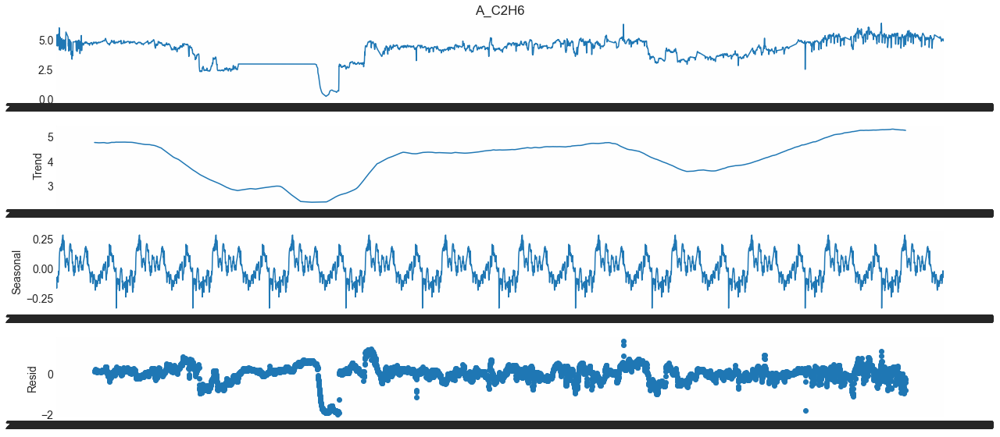

In [236]:
from pylab import rcParams
rcParams['figure.figsize'] = 18, 8
decomposition = sm.tsa.seasonal_decompose(df_train.set_index('timestamp')['A_C2H6'].interpolate(axis=0),
                                          model='additive',
                                          period =500)
fig = decomposition.plot()
plt.show()

In [20]:
def rateABOutliers():
    df_c = df_train.copy()
    thres = [75,55]
    
    filtered = []
    for i, value in enumerate(df_c['A_rate'].values):
        if value<thres[1] or value>thres[0]:
            filtered.append(np.nan)
        else:
            filtered.append(value)
    df_c['A_rate'] = filtered
    
    filtered = []
    for i, value in enumerate(df_c['B_rate'].values):
        if value<thres[1] or value>thres[0]:
            filtered.append(np.nan)
        else:
            filtered.append(value)
    df_c['B_rate'] = filtered
    return df_c

def stlTrend(df, gas, period=600, plots=True):
    stl = STL(df.set_index('timestamp')[gas].interpolate(axis=0), period=period, robust=True).fit()
    if plots:
        plt.figure(figsize=(18,6))
        plt.plot(df['timestamp'], stl.observed.values, label='observed')
        plt.plot(df['timestamp'], stl.trend.values, label='trend')
        plt.title(gas)
        plt.legend()
        plt.xticks(np.arange(10))
        plt.ylabel('mass%')
        plt.xlabel('time')
        plt.style.use('seaborn-darkgrid')
        plt.show()
    return stl.trend.values

In [45]:
df_train_copy = df_train.copy()
df_train_copy['A_rate'] = rateABOutliers()['A_rate']
df_train_copy['B_rate'] = rateABOutliers()['B_rate']
df_test_copy = feat_test.copy()

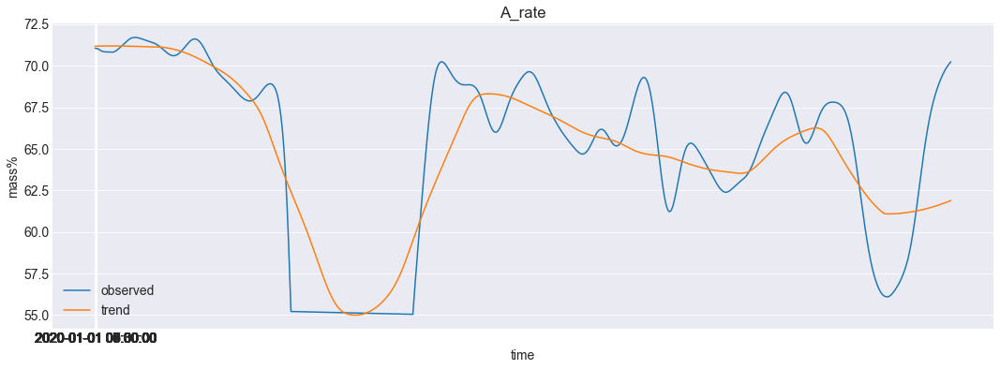

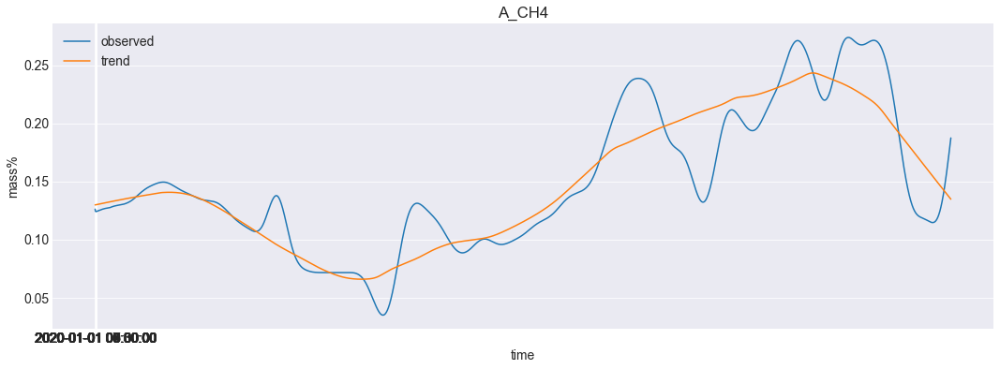

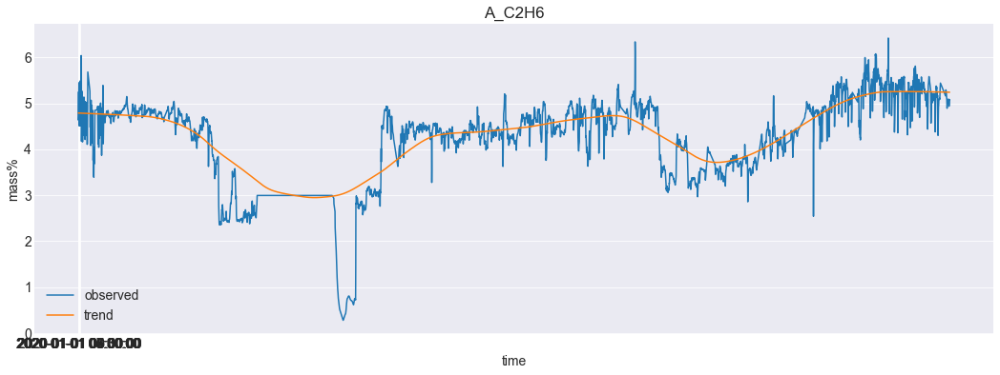

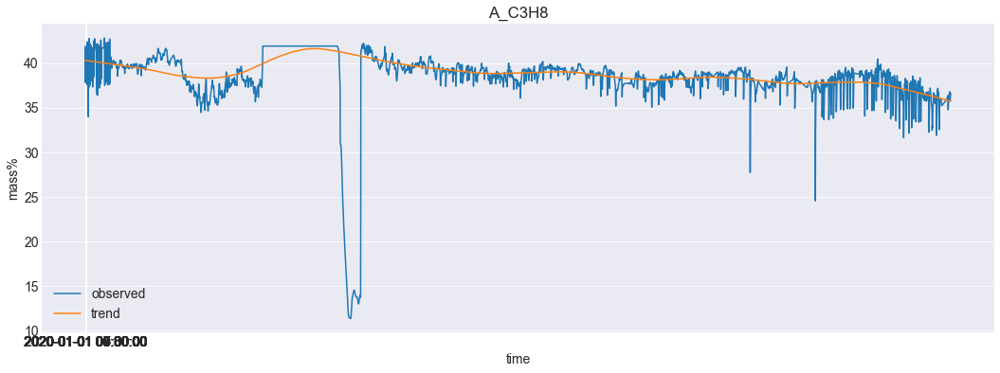

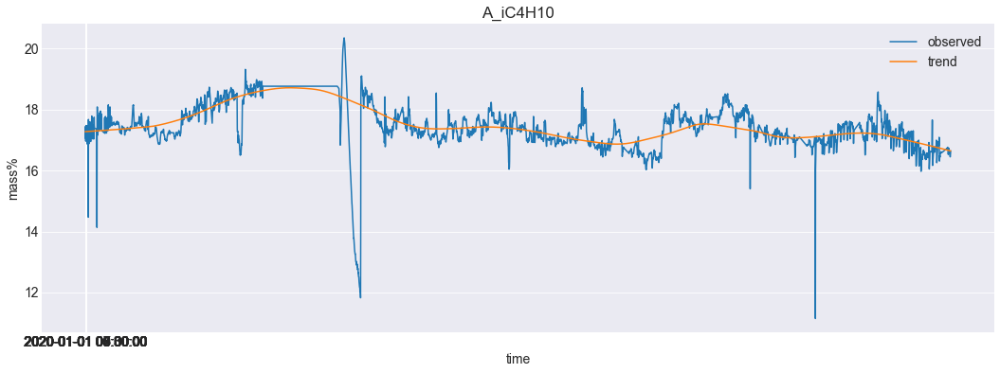

...

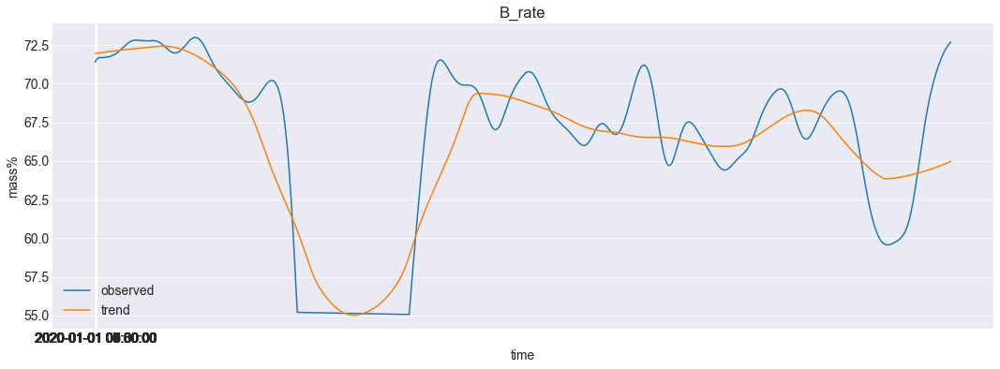

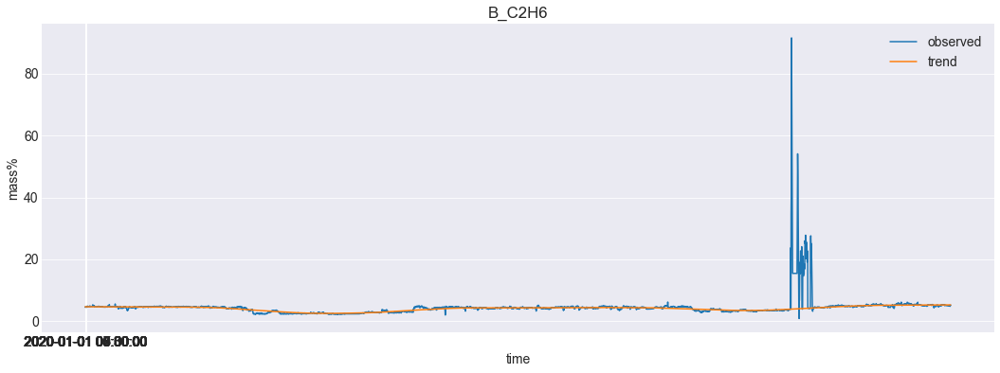

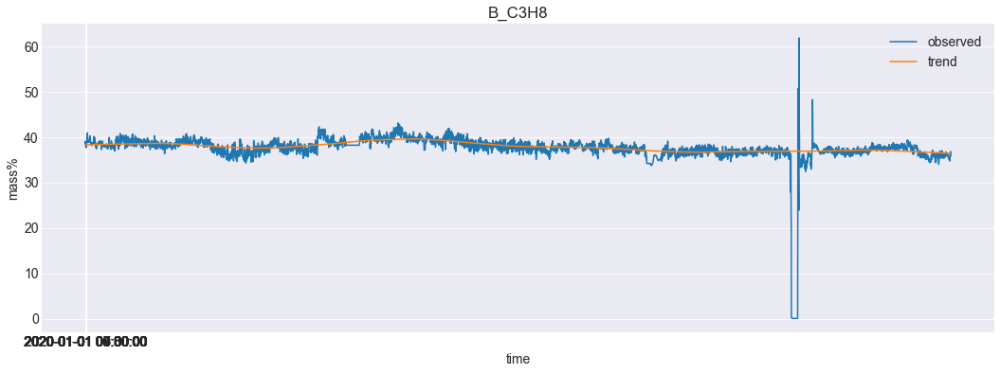

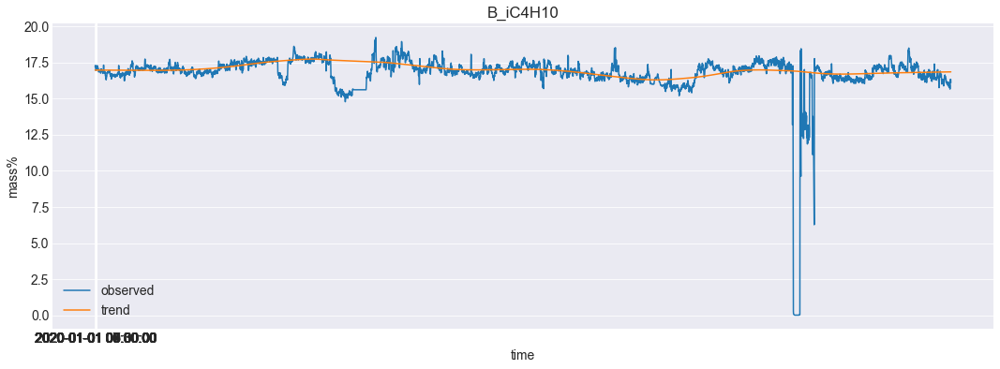

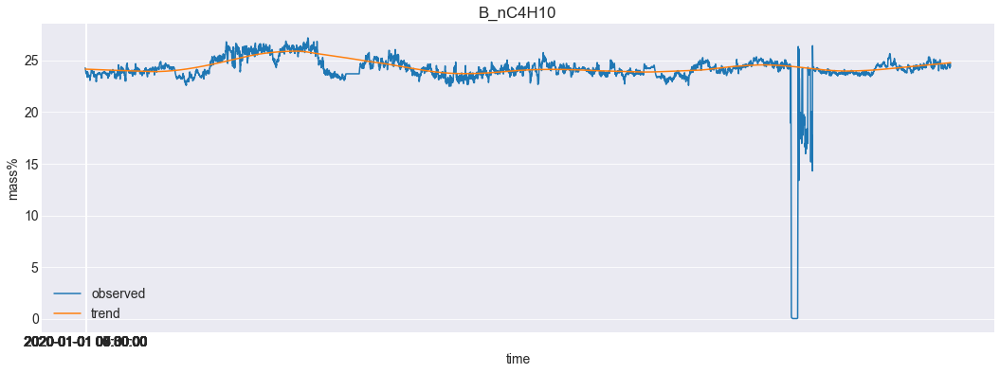

In [431]:
for column in train_feats+target_feats:
    df_train_copy[column] = stlTrend(df_train_copy, column, 600)

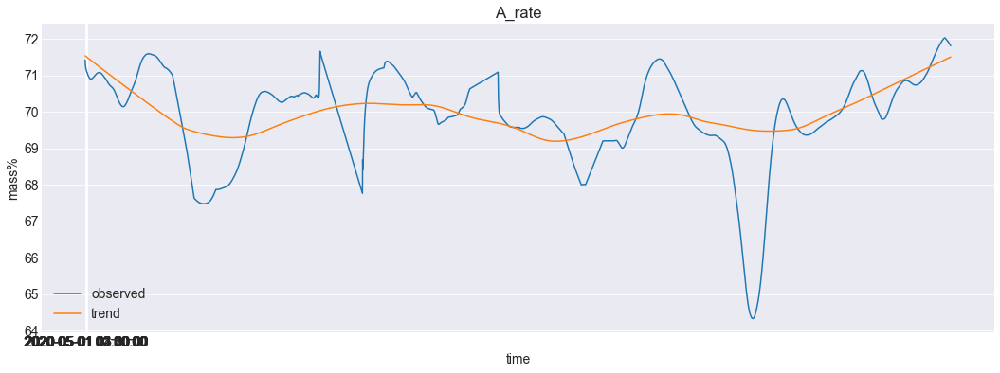

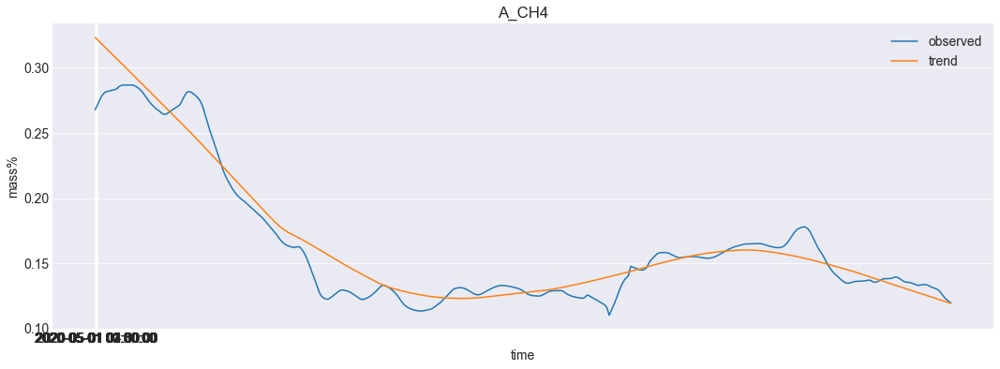

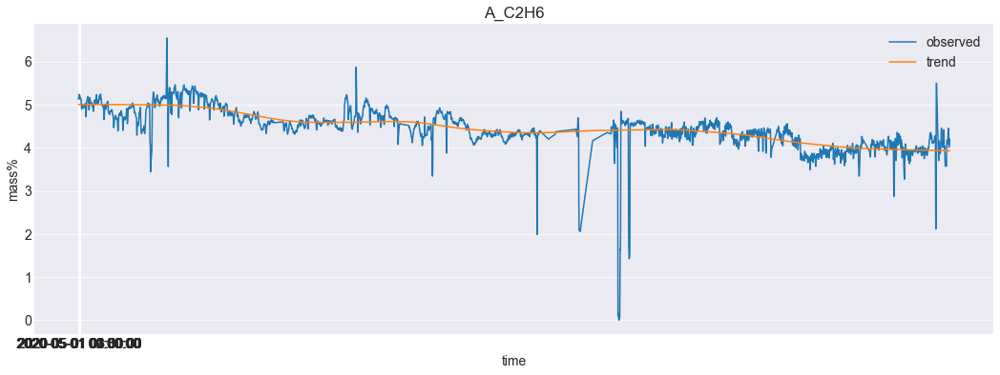

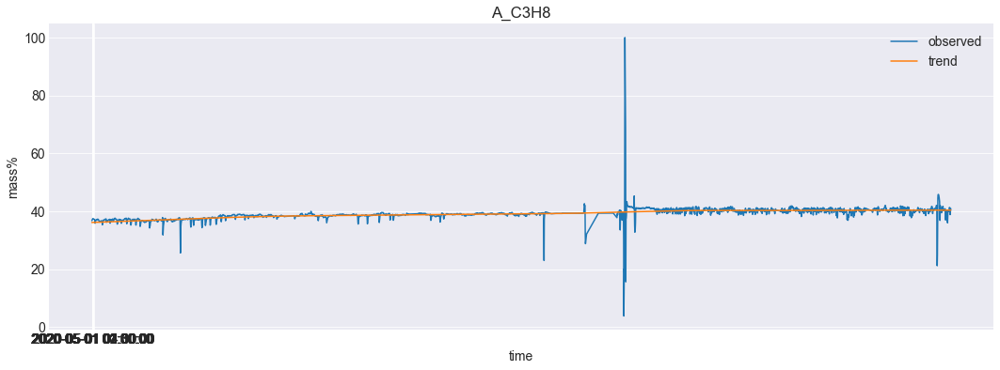

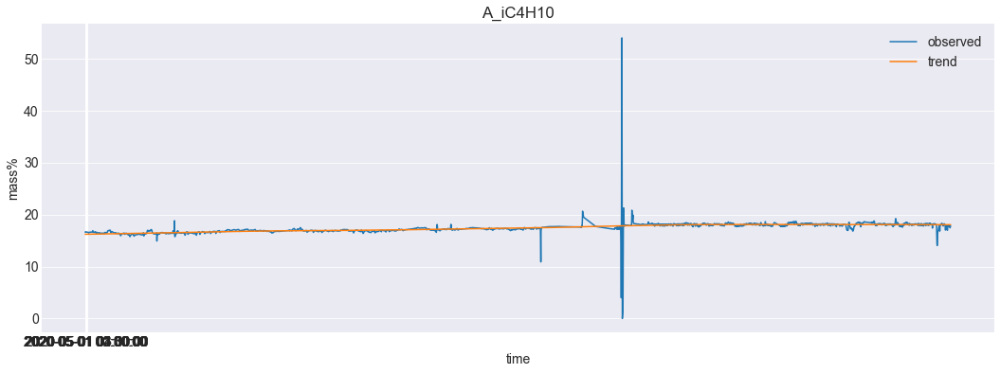

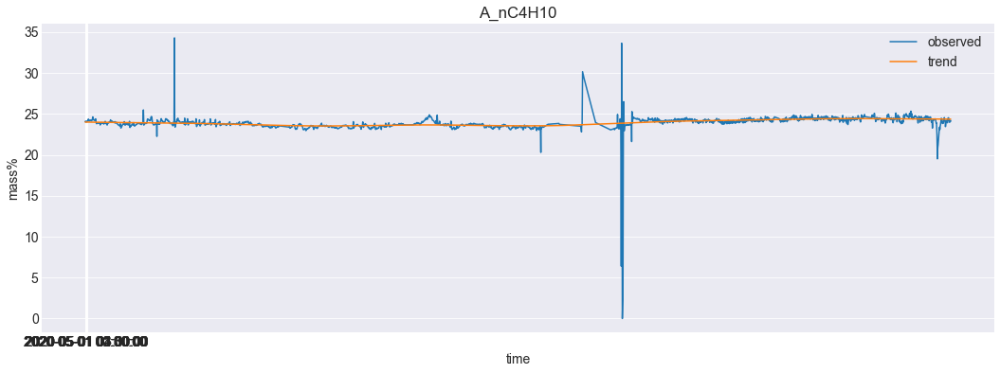

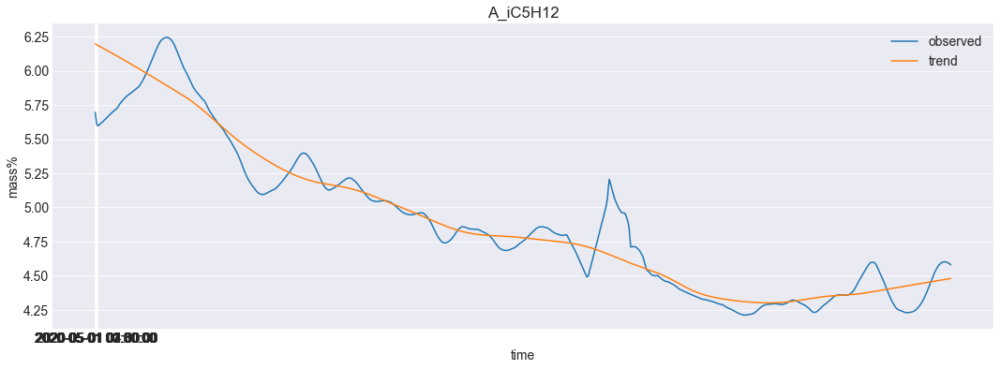

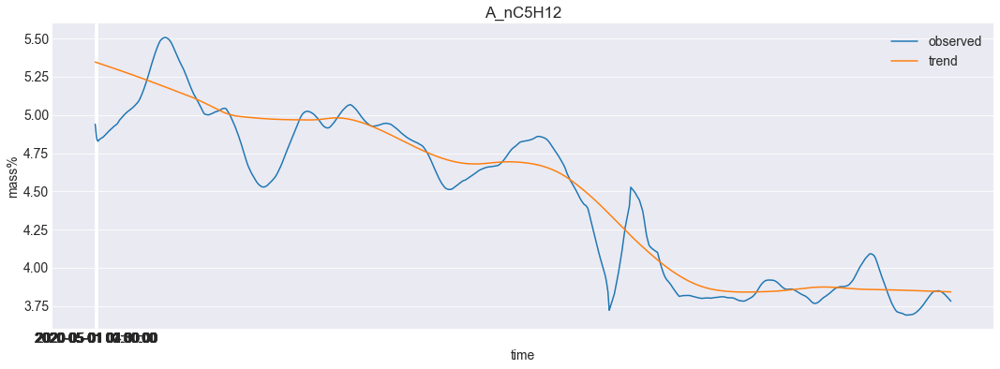

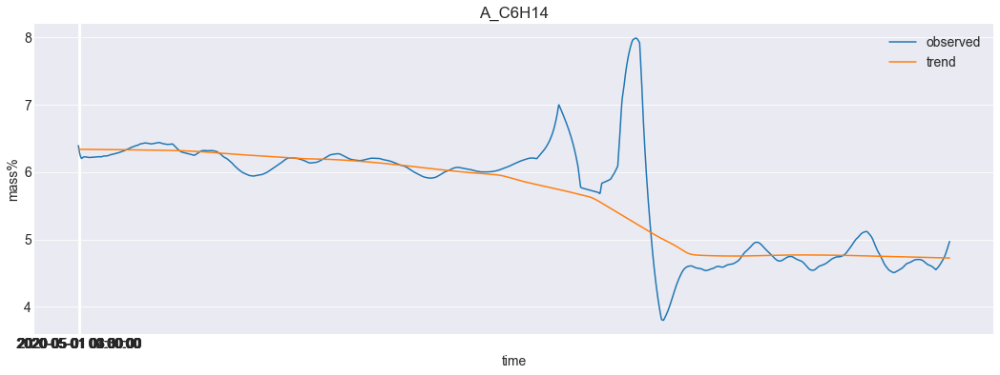

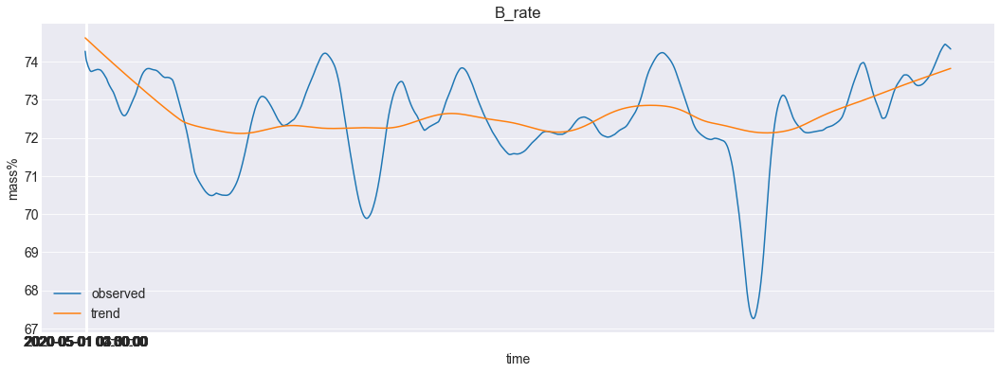

In [432]:
for column in train_feats: 
    df_test_copy[column] = stlTrend(df_test_copy, column, 600)

Все фича под stl(robust, period=600, linear interpolation) меняем Period для этана

In [436]:
C2H6 = []
C3H8 = []
iC4H10 = []
nC4H10 =[]
for value in np.arange(100, 2500, 100):
    df_train_copy['A_C2H6'] = stlTrend(df_train, 'A_C2H6', value, False)
    df_train_copy['B_C2H6'] = stlTrend(df_train, 'B_C2H6', value, False)
    df_test_copy['A_C2H6'] = stlTrend(feat_test, 'A_C2H6', value, False)
    
    X_train, X_test, y_train, y_test = train_test_split(df_train_copy[train_feats], 
                                                    df_train_copy[target_feats], test_size=0.25, random_state=23)
    
    print('--------------------------------------------------------------------------------------')
    print(value)
    for i in range(4):
        random_forest=RandomForestRegressor(n_estimators=200,
                                            max_depth=8,
                                            min_samples_split=2,
                                            n_jobs=-1).fit(X_train, y_train.iloc[:,i])
        y_pred = random_forest.predict(X_test)
        print(mape(y_test.iloc[:,i], y_pred))
        if i==0:
            C2H6.append(mape(y_test.iloc[:,i], y_pred))
        elif i==1:
            C3H8.append(mape(y_test.iloc[:,i], y_pred))
        elif i==2:
            iC4H10.append(mape(y_test.iloc[:,i], y_pred))
        elif i==3:
            nC4H10.append(mape(y_test.iloc[:,i], y_pred))

--------------------------------------------------------------------------------------
100
0.619
0.016
0.026
0.04
--------------------------------------------------------------------------------------
200
0.284
0.016
0.032
0.04
--------------------------------------------------------------------------------------
300
0.142
0.016
0.029
0.038
--------------------------------------------------------------------------------------
400
0.239
0.017
0.029
0.043
--------------------------------------------------------------------------------------
500
0.154
0.016
0.028
0.041
--------------------------------------------------------------------------------------
600
0.141
0.016
0.03
0.037
--------------------------------------------------------------------------------------
700
0.134
0.017
0.029
0.037
--------------------------------------------------------------------------------------
800
0.197
0.017
0.028
0.035
-----------------------------------------------------------------------------------

Попробовать 1800 период для этана либо другое значение, а для остальных колонок оставить предыдущие значения. Либо вообще скопировать трейн дату (можно на 4 дня вперед попробовать)

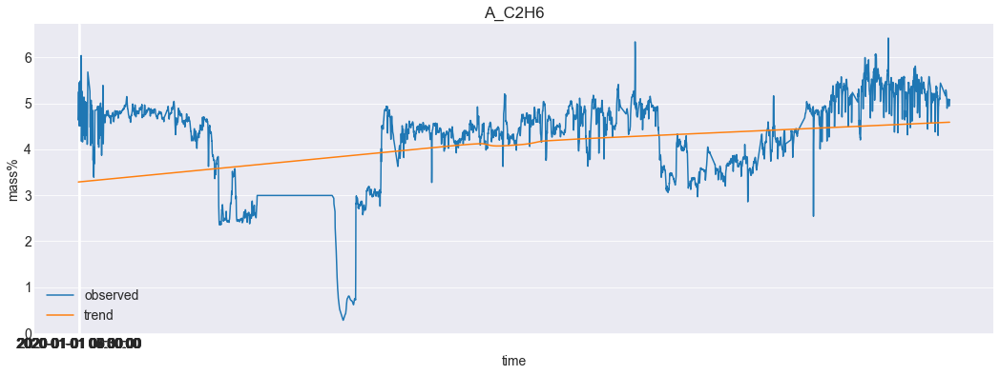

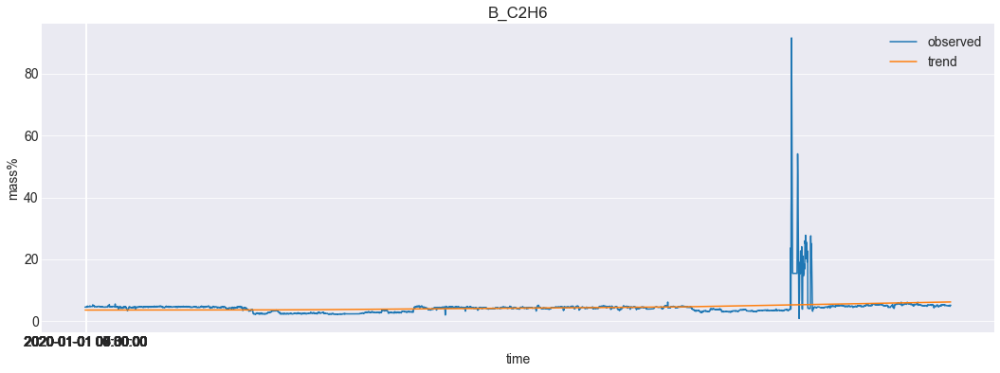

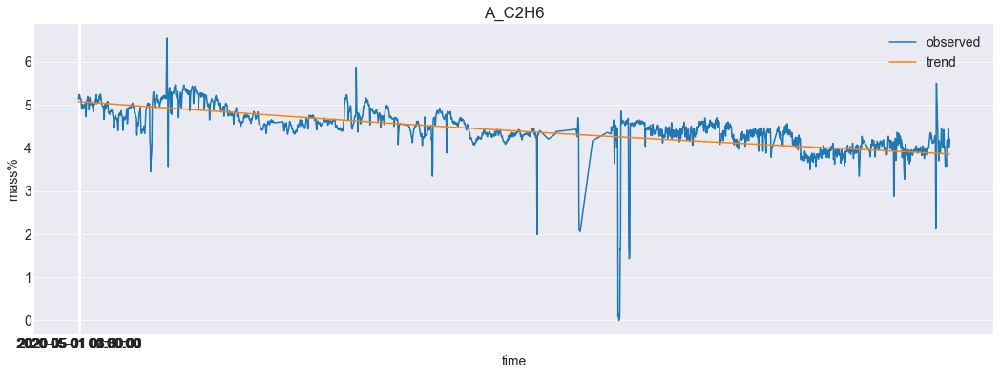

In [455]:
for column in train_feats[:2]+train_feats[3:]+target_feats[1:]:
    df_train_copy[column] = stlTrend(df_train_copy, column, 600, False)
    
for column in train_feats[:2]+train_feats[3:]: 
    df_test_copy[column] = stlTrend(df_test_copy, column, 600, False)

df_train_copy['A_C2H6'] = stlTrend(df_train, 'A_C2H6', 1800, True)
df_train_copy['B_C2H6'] = stlTrend(df_train, 'B_C2H6', 1800, True)
df_test_copy['A_C2H6'] = stlTrend(feat_test, 'A_C2H6', 1800, True)

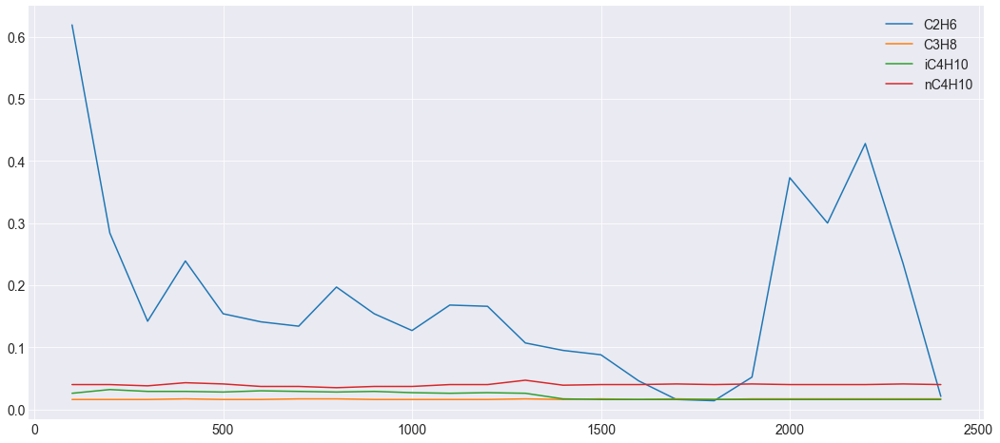

In [437]:
plt.plot(np.arange(100, 2500, 100), C2H6, label='C2H6')
plt.plot(np.arange(100, 2500, 100), C3H8, label='C3H8')
plt.plot(np.arange(100, 2500, 100), iC4H10, label='iC4H10')
plt.plot(np.arange(100, 2500, 100), nC4H10, label='nC4H10')

plt.legend()
plt.style.use('seaborn-darkgrid')
plt.show()

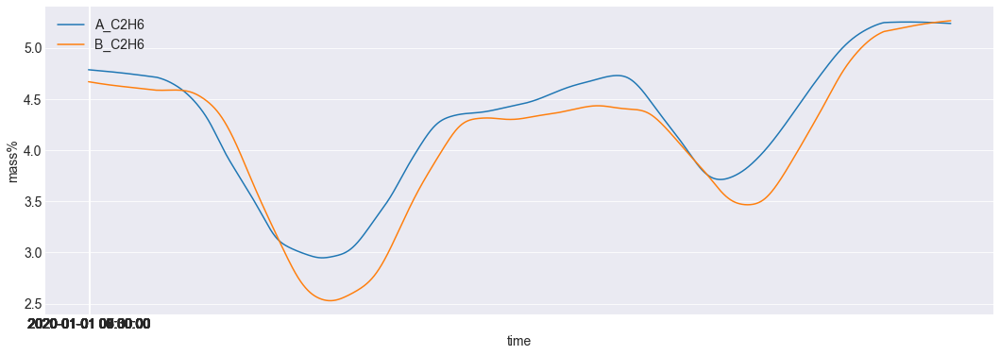

In [442]:
stl1 = STL(df_train.set_index('timestamp')['A_C2H6'].interpolate(axis=0), period=600, robust=True).fit()
stl2 = STL(df_train.set_index('timestamp')['B_C2H6'].interpolate(axis=0), period=600, robust=True).fit()

plt.figure(figsize=(18,6))
plt.plot(df_train['timestamp'], stl1.trend.values, label='A_C2H6')
plt.plot(df_train['timestamp'], stl2.trend.values, label='B_C2H6')
plt.legend()
plt.xticks(np.arange(10))
plt.ylabel('mass%')
plt.xlabel('time')
plt.style.use('seaborn-darkgrid')
plt.show()

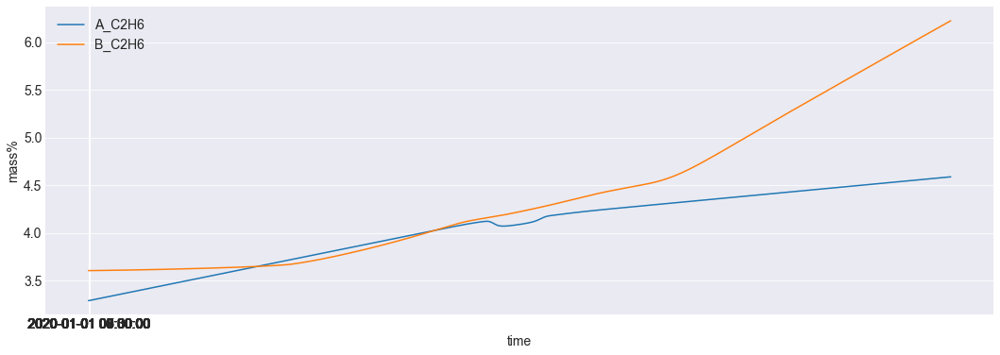

In [441]:
stl1 = STL(df_train.set_index('timestamp')['A_C2H6'].interpolate(axis=0), period=1800, robust=True).fit()
stl2 = STL(df_train.set_index('timestamp')['B_C2H6'].interpolate(axis=0), period=1800, robust=True).fit()

plt.figure(figsize=(18,6))
plt.plot(df_train['timestamp'], stl1.trend.values, label='A_C2H6')
plt.plot(df_train['timestamp'], stl2.trend.values, label='B_C2H6')
plt.legend()
plt.xticks(np.arange(10))
plt.ylabel('mass%')
plt.xlabel('time')
plt.style.use('seaborn-darkgrid')
plt.show()

In [390]:
X_train, X_test, y_train, y_test = train_test_split(df_train_copy[train_feats], 
                                                    df_train_copy[target_feats], test_size=0.25, random_state=23)

In [405]:
params = {
    'n_estimators': [50, 100, 200, 300, 500],
    'max_depth': [1,2,3,4,5,6,8],
    'min_samples_split': [2,4,6,8],
    
}
random_forest = RandomForestRegressor(n_jobs=-1)
gc_cv = GridSearchCV(random_forest, params)
gc_cv.fit(X_train, y_train.iloc[:,0])
print(gc_cv.best_score_, gc_cv.best_params_)

0.9998043137806472 {'max_depth': 8, 'min_samples_split': 6, 'n_estimators': 50}


In [406]:
#все параметры robust 600 period
for i in range(1,X_train.shape[1]):
    random_forest=RandomForestRegressor(n_estimators=50,max_depth=8,min_samples_split=6,n_jobs=-1)
    random_forest.fit(X_train.iloc[:,:i], y_train.iloc[:,0])
    y_pred = random_forest.predict(X_test.iloc[:,:i])
    print(i, mape(y_test.iloc[:,0], y_pred))

1 6.633
2 1.328
3 0.132
4 0.14
5 0.137
6 0.148
7 0.142
8 0.144
9 0.147


In [380]:
print(mape(y_test['B_C2H6'], y_test['B_C2H6'].mean()))

14.919


In [364]:
for i in range(4):
    lr = LinearRegression().fit(X_train, y_train.iloc[:,i])
    y_pred = lr.predict(X_test)
    print(mape(y_test.iloc[:,i], y_pred))

3.638
0.851
0.551
0.306


In [362]:
for i in range(4):
    random_forest=RandomForestRegressor(n_estimators=200,max_depth=8,min_samples_split=2,n_jobs=-1).fit(X_train, y_train.iloc[:,i])
    y_pred = random_forest.predict(X_test)
    print(mape(y_test.iloc[:,i], y_pred))

0.141
0.014
0.013
0.035


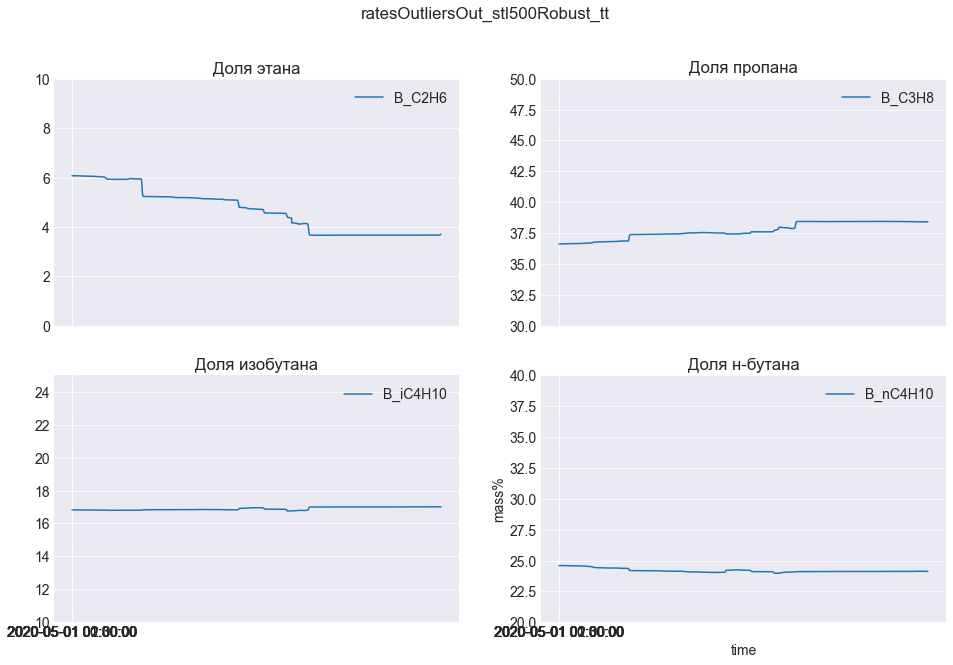

In [456]:
rf = RandomForestRegressor(n_estimators=500, max_depth=8, min_samples_split=2,n_jobs=-1)
rf.fit(df_train_copy.interpolate(axis=0)[train_feats], df_train_copy.interpolate(axis=0)[target_feats])
test_preds = rf.predict(df_test_copy[train_feats])

outputSubmission(test_preds, 'all_Gases_and_rates_stl_600and1800C2H6Robust_tt_rf.csv')

drawPreds(test_preds, 'ratesOutliersOut_stl500Robust_tt')

# Лучший сабмит

In [21]:
best_sub = pd.read_csv('all_Gases_and_rates_stl_600Robust_tt_rf.csv')

In [307]:
scores(4.57, 'Убрали выбросы у rate_A и B для трейн, модель stl period=500, robust=True, линейная интерполяция')

In [329]:
scores(3.56, 'Убрали rate_A и B для трейн, модель stl period=500, robust=True, линейная интерполяция')

In [ ]:
scores(4.8, 'Только таргет газы для трейн, модель stl period=200, robust=True, линейная интерполяция')

In [ ]:
scores(2.92, 'Только таргет газы для трейн, модель stl period=800, robust=True, линейная интерполяция')

In [ ]:
scores(2.66, 'Только газы для трейн, модель stl period=600, robust=True, линейная интерполяция')

In [ ]:
scores(2.63, 'газы и скорости для трейн, модель stl period=600, robust=True, линейная интерполяция')

In [ ]:
scores(3.33, 'газы и скорости для трейн, модель stl period=700, robust=True, линейная интерполяция')

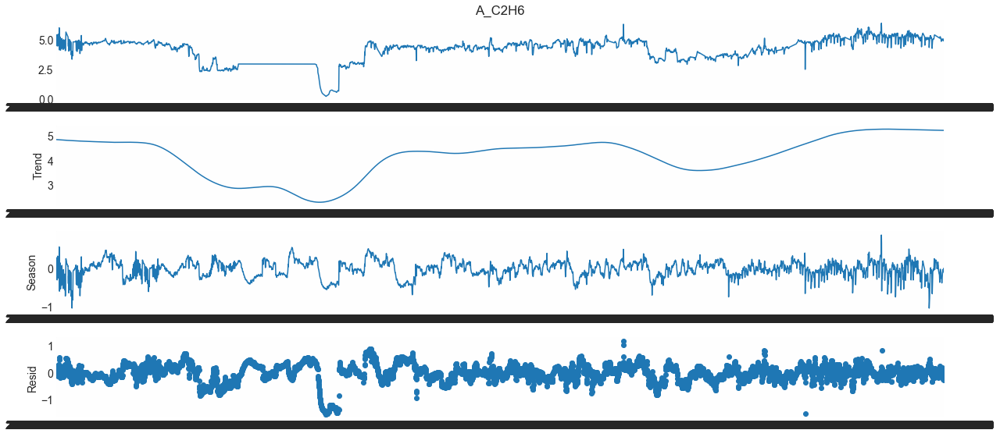

In [238]:
stl = STL(df_train.set_index('timestamp')['A_C2H6'].interpolate(axis=0), period=500)
res = stl.fit()
fig = res.plot()

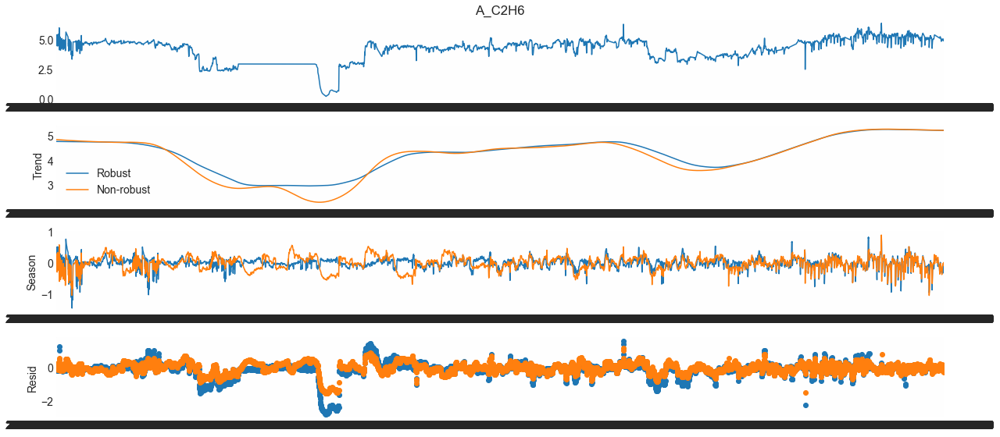

In [239]:
def add_stl_plot(fig, res, legend):
    """Add 3 plots from a second STL fit"""
    axs = fig.get_axes()
    comps = ['trend', 'seasonal', 'resid']
    for ax, comp in zip(axs[1:], comps):
        series = getattr(res, comp)
        if comp == 'resid':
            ax.plot(series, marker='o', linestyle='none')
        else:
            ax.plot(series)
            if comp == 'trend':
                ax.legend(legend, frameon=False)


stl = STL(df_train.set_index('timestamp')['A_C2H6'].interpolate(axis=0), period=500, robust=True)
res_robust = stl.fit()
fig = res_robust.plot()
res_non_robust = STL(df_train.set_index('timestamp')['A_C2H6'].interpolate(axis=0), period=500, robust=False).fit()
add_stl_plot(fig, res_non_robust, ['Robust','Non-robust'])

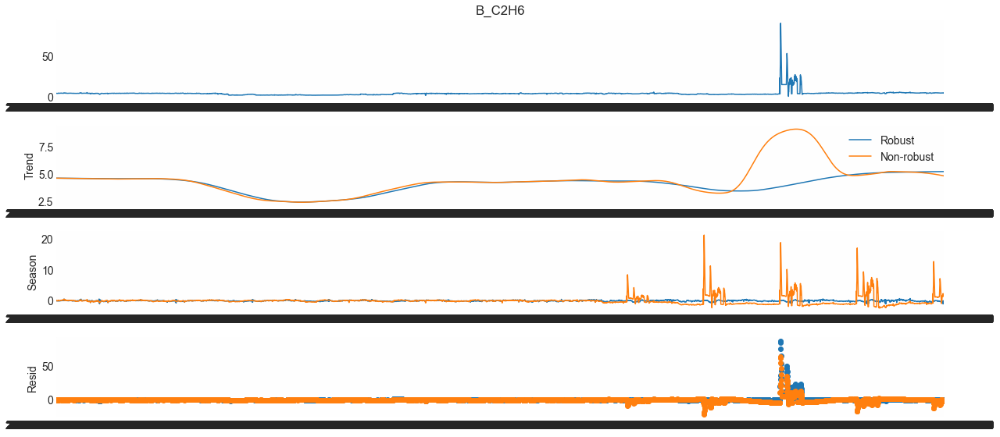

In [240]:
stl = STL(df_train.set_index('timestamp')['B_C2H6'].interpolate(axis=0), period=500, robust=True)
res_robust = stl.fit()
fig = res_robust.plot()
res_non_robust = STL(df_train.set_index('timestamp')['B_C2H6'].interpolate(axis=0), period=500, robust=False).fit()
add_stl_plot(fig, res_non_robust, ['Robust','Non-robust'])

In [312]:
sts.adfuller(df_train.set_index('timestamp')['B_C2H6'].interpolate(axis=0))

(-5.0239681869741,
 1.9892596101940804e-05,
 34,
 5764,
 {'1%': -3.431485012943198,
  '5%': -2.862041567620489,
  '10%': -2.5670369825355976},
 16005.232243805407)

In [24]:
import statsmodels.graphics.tsaplots as sgt

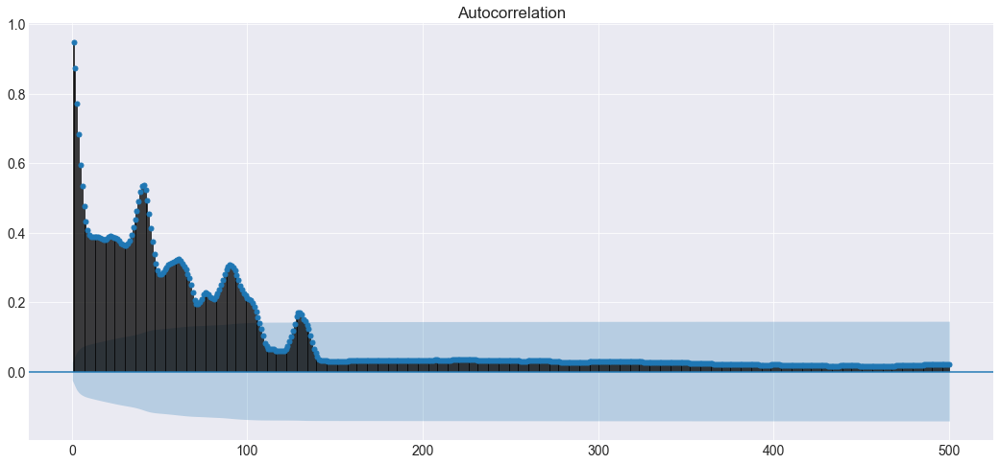

In [316]:
sgt.plot_acf(df_train.set_index('timestamp')['B_C2H6'].interpolate(axis=0), zero=False, lags=500)
plt.show()

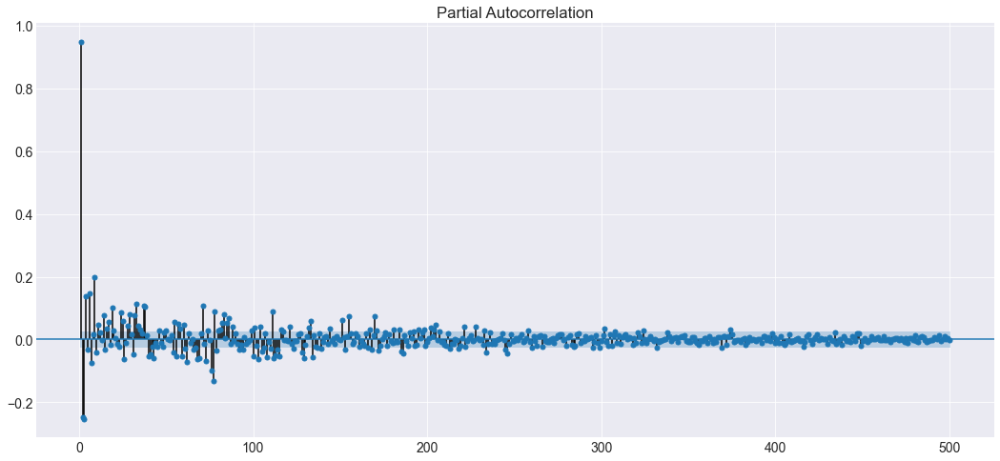

In [324]:
sgt.plot_pacf(df_train.set_index('timestamp')['B_C2H6'].interpolate(axis=0), lags=500, alpha=0.05, zero=False, method=('ols'))
plt.show()

In [361]:
for i in range(4):
    xgb=XGBRegressor().fit(X_train, y_train.iloc[:,i])
    y_pred = xgb.predict(X_test)
    print(mape(y_test.iloc[:,i], y_pred))

0.086
0.014
0.011
0.011


## Третья версия

In [22]:
feat_train = pd.read_csv('train_features.csv')
target_train = pd.read_csv('train_targets.csv')
feat_test = pd.read_csv('test_features.csv')
sample_sub = pd.read_csv('sample_submission.csv')

target_feats = ['B_C2H6', 'B_C3H8', 'B_iC4H10', 'B_nC4H10']
not_train_target_feats = ['A_rate', 'A_CH4', 'A_iC5H12', 'A_nC5H12', 'A_C6H14', 'B_rate']
train_feats = ['A_rate', 'A_CH4','A_C2H6', 'A_C3H8', 'A_iC4H10', 'A_nC4H10', 'A_iC5H12', 'A_nC5H12', 'A_C6H14', 'B_rate']
df_train = pd.concat([feat_train, target_train[target_feats]], axis=1)[9:]

In [26]:
df_train.head()

,timestamp,A_rate,A_CH4,A_C2H6,A_C3H8,A_iC4H10,A_nC4H10,A_iC5H12,A_nC5H12,A_C6H14,B_rate,B_C2H6,B_C3H8,B_iC4H10,B_nC4H10
9,2020-01-01 04:30:00,71.055792,0.126244,5.242957,41.941480,17.064213,23.205953,4.184848,4.062079,4.110170,71.389674,4.532649,38.604149,17.238489,24.275393
10,2020-01-01 05:00:00,71.029881,0.111301,4.632455,39.198330,17.440245,24.331520,4.615703,4.545702,5.072316,71.792506,4.578543,38.510623,17.193441,24.242152
11,2020-01-01 05:30:00,71.008884,0.125176,4.730933,37.874656,17.353362,24.567692,4.847911,4.818913,5.626975,71.939558,4.642879,39.124029,17.301609,24.211492
12,2020-01-01 06:00:00,71.060109,0.141546,5.214231,39.763493,17.098163,23.758240,4.512244,4.429068,5.021207,72.124690,4.549837,38.247333,17.118282,24.044074
13,2020-01-01 06:30:00,71.067865,0.143911,5.440833,41.616510,16.964787,23.121613,4.212636,4.088066,4.347822,72.278288,4.556611,37.985776,17.038811,23.931490


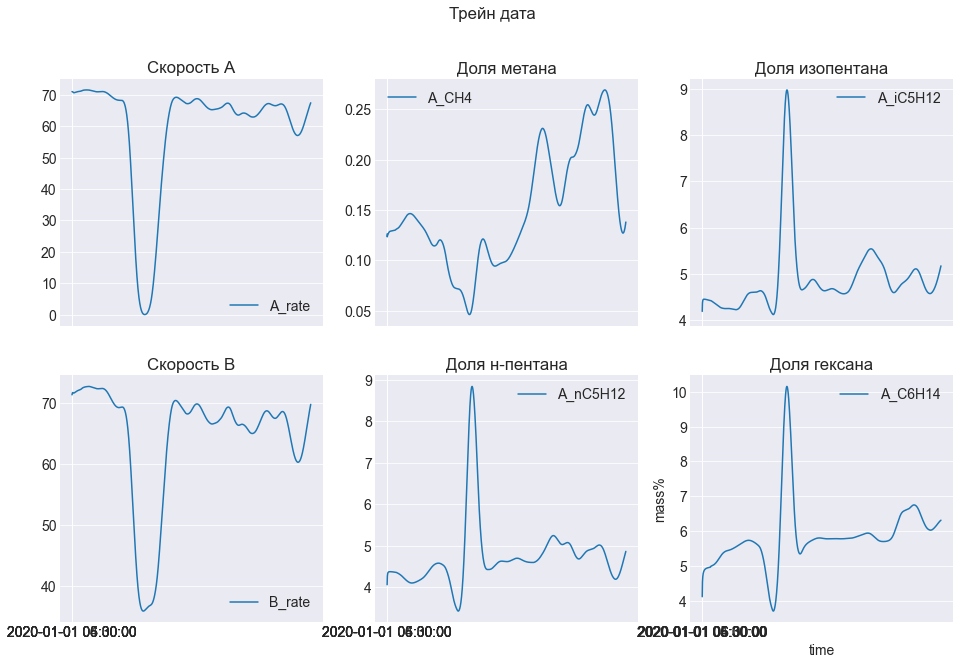

In [483]:
plotTrainGases(df_train, rolling=True, window=200, title='Трейн дата')

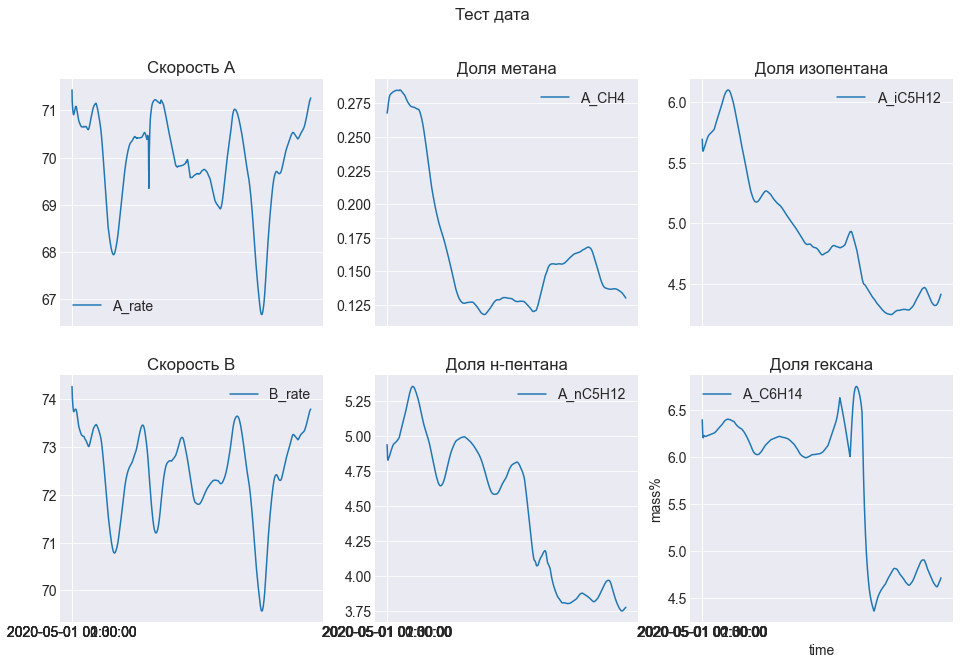

In [484]:
plotTrainGases(feat_test, rolling=True, window=200, title='Тест дата')

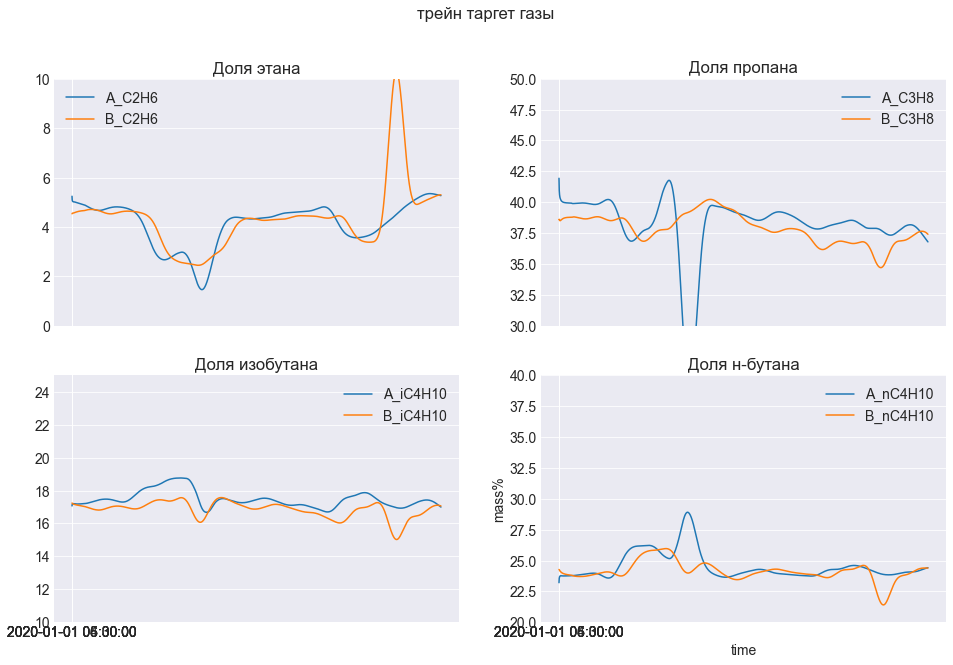

In [488]:
plotTargetGases(df=df_train, b_feats=True, a_feats=True, rolling=True, window=200, title='трейн таргет газы')

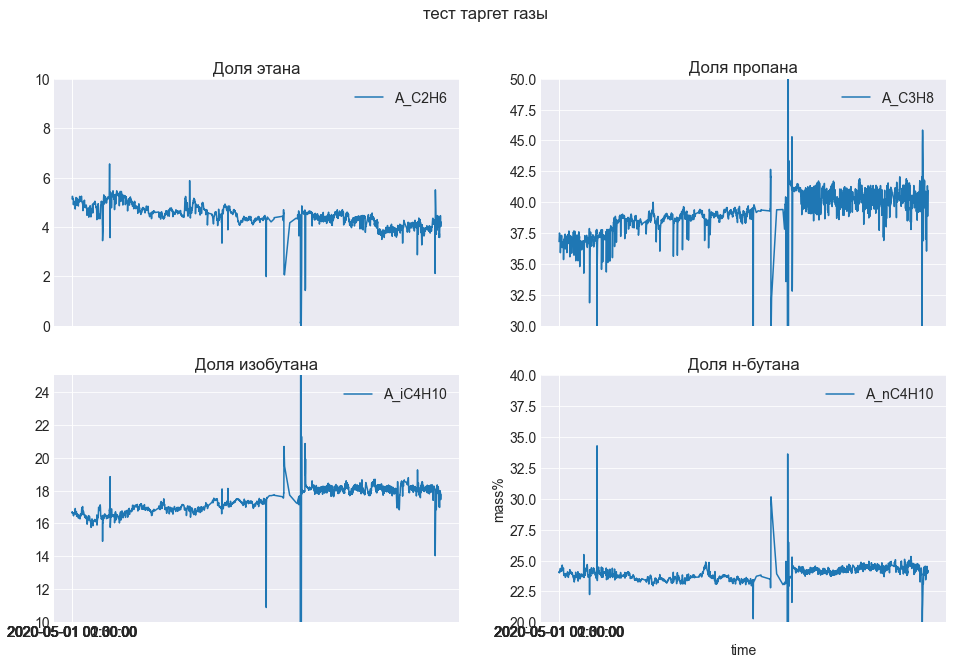

In [501]:
plotTargetGases(df=feat_test.interpolate(axis=0),
                b_feats=False, a_feats=True,
                rolling=False, window=200, title='тест таргет газы')

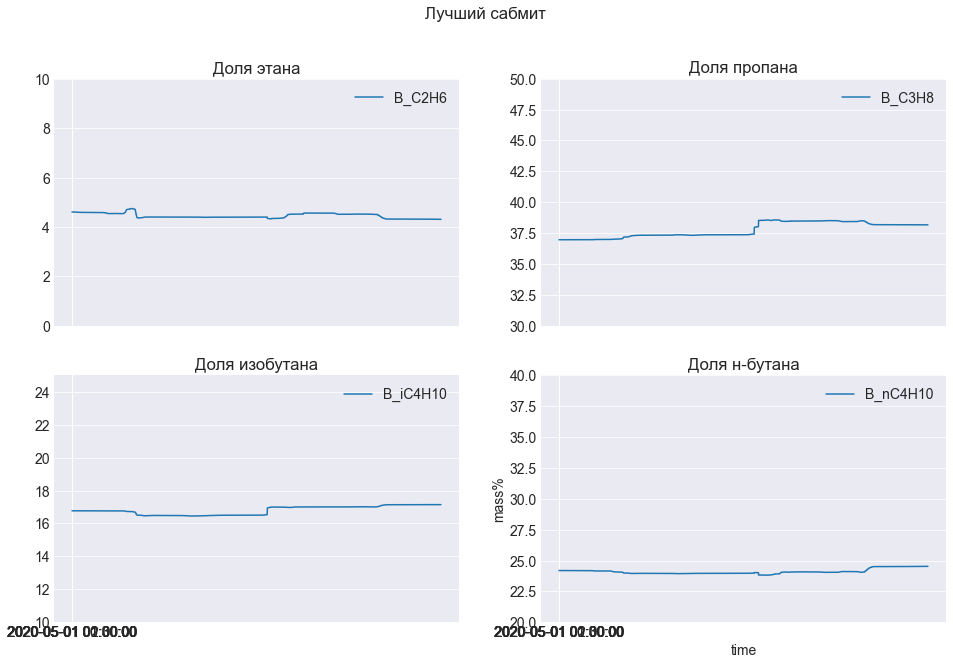

In [487]:
drawPreds(best_sub, 'Лучший сабмит')

### Нейронные сети

In [23]:
import tensorflow as tf
from tensorflow import keras

In [28]:
df_train[train_feats].shape

(5799, 10)

In [58]:
model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[10]),
    keras.layers.Dense(50, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    keras.layers.Dense(4)
])

In [59]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_3 (Flatten)          (None, 10)                0         
_________________________________________________________________
dense_8 (Dense)              (None, 300)               3300      
_________________________________________________________________
dropout_4 (Dropout)          (None, 300)               0         
_________________________________________________________________
dense_9 (Dense)              (None, 4)                 1204      
Total params: 4,504
Trainable params: 4,504
Non-trainable params: 0
_________________________________________________________________


In [60]:
model.compile(optimizer='adam',
              loss='mean_squared_error',
              metrics=['mean_absolute_percentage_error'])

Epoch 1/50
136/136 [==============================] - 0s 3ms/step - loss: 42.8458 - mean_absolute_percentage_error: 33.5087 - val_loss: 31.8967 - val_mean_absolute_percentage_error: 2434.4043
Epoch 2/50
136/136 [==============================] - 1s 4ms/step - loss: 8.8185 - mean_absolute_percentage_error: 19.3752 - val_loss: 30.5084 - val_mean_absolute_percentage_error: 2377.6084
Epoch 3/50
136/136 [==============================] - 0s 2ms/step - loss: 5.6760 - mean_absolute_percentage_error: 14.0449 - val_loss: 29.7290 - val_mean_absolute_percentage_error: 2339.0486
Epoch 4/50
136/136 [==============================] - 0s 2ms/step - loss: 4.2166 - mean_absolute_percentage_error: 11.2228 - val_loss: 30.3774 - val_mean_absolute_percentage_error: 2400.9097
Epoch 5/50
136/136 [==============================] - 0s 2ms/step - loss: 3.6112 - mean_absolute_percentage_error: 9.6936 - val_loss: 30.2315 - val_mean_absolute_percentage_error: 2386.2798
Epoch 6/50
136/136 [=========================

Epoch 44/50
136/136 [==============================] - 0s 2ms/step - loss: 1.8879 - mean_absolute_percentage_error: 6.4556 - val_loss: 29.8786 - val_mean_absolute_percentage_error: 2302.7283
Epoch 45/50
136/136 [==============================] - 0s 2ms/step - loss: 1.8320 - mean_absolute_percentage_error: 6.3963 - val_loss: 29.7468 - val_mean_absolute_percentage_error: 2358.9438
Epoch 46/50
136/136 [==============================] - 0s 2ms/step - loss: 1.8074 - mean_absolute_percentage_error: 6.3437 - val_loss: 31.6514 - val_mean_absolute_percentage_error: 2453.1497
Epoch 47/50
136/136 [==============================] - 0s 3ms/step - loss: 1.9636 - mean_absolute_percentage_error: 6.6118 - val_loss: 30.0325 - val_mean_absolute_percentage_error: 2367.1804
Epoch 48/50
136/136 [==============================] - 0s 2ms/step - loss: 1.8511 - mean_absolute_percentage_error: 6.4777 - val_loss: 30.4682 - val_mean_absolute_percentage_error: 2387.3484
Epoch 49/50
136/136 [========================

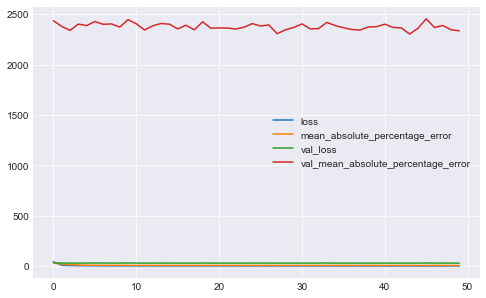

Wall time: 15.4 s


In [61]:
%%time
fitted = model.fit(df_train[train_feats].interpolate(axis=0), df_train[target_feats].interpolate(axis=0),
                   epochs=50, validation_split=0.25)

pd.DataFrame(fitted.history).plot(figsize=(8,5))
plt.grid(True)
plt.show()

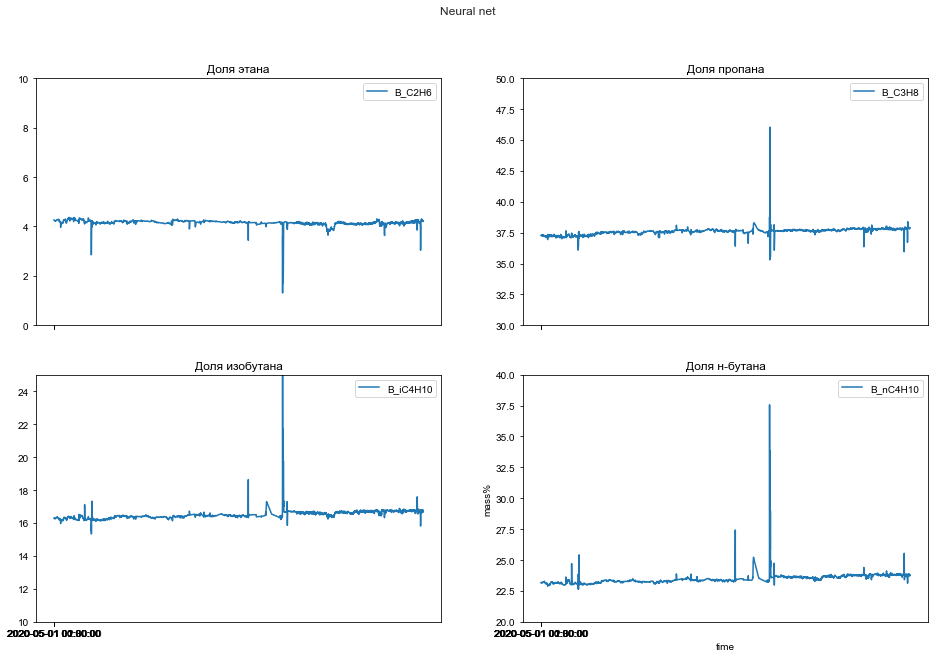

In [44]:
y_pred=model.predict(feat_test[train_feats].interpolate(axis=0))
drawPreds(y_pred, 'Neural net')

Жесткое переобучение! Делаем регуляризацию

In [81]:
df_train_copy = df_train.copy()
df_train_copy['A_rate'] = rateABOutliers()['A_rate']
df_train_copy['B_rate'] = rateABOutliers()['B_rate']
df_test_copy = feat_test.copy()

In [82]:
for column in train_feats+target_feats:
    df_train_copy[column] = stlTrend(df_train_copy, column, 600, False)

In [83]:
for column in train_feats:
    df_test_copy[column] = stlTrend(df_test_copy, column, 600, False)

In [85]:
model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[10]),
    keras.layers.Dense(100, activation='relu', kernel_initializer='he_normal'),
    tf.keras.layers.Dropout(0.2),
    keras.layers.Dense(4)
])

In [86]:
model.compile(optimizer='adam',
              loss='mean_squared_error',
              metrics=['mean_absolute_percentage_error'])

Epoch 1/30
136/136 [==============================] - 0s 2ms/step - loss: 1276.3425 - mean_absolute_percentage_error: 196.9187 - val_loss: 3.6729 - val_mean_absolute_percentage_error: 7.3399
Epoch 2/30
136/136 [==============================] - 0s 2ms/step - loss: 277.6909 - mean_absolute_percentage_error: 123.3397 - val_loss: 1.2712 - val_mean_absolute_percentage_error: 7.6913
Epoch 3/30
136/136 [==============================] - 0s 2ms/step - loss: 183.4564 - mean_absolute_percentage_error: 91.2483 - val_loss: 2.3811 - val_mean_absolute_percentage_error: 5.0111
Epoch 4/30
136/136 [==============================] - 0s 2ms/step - loss: 126.1725 - mean_absolute_percentage_error: 69.7318 - val_loss: 2.0561 - val_mean_absolute_percentage_error: 7.1881
Epoch 5/30
136/136 [==============================] - 0s 2ms/step - loss: 90.6441 - mean_absolute_percentage_error: 54.1124 - val_loss: 1.8572 - val_mean_absolute_percentage_error: 5.1277
Epoch 6/30
136/136 [==============================] -

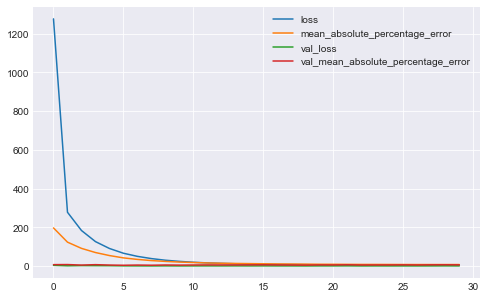

Wall time: 8.72 s


In [87]:
%%time
fitted = model.fit(df_train_copy[train_feats], df_train_copy[target_feats],
                   epochs=30, validation_split=0.25)

pd.DataFrame(fitted.history).plot(figsize=(8,5))
plt.grid(True)
plt.show()

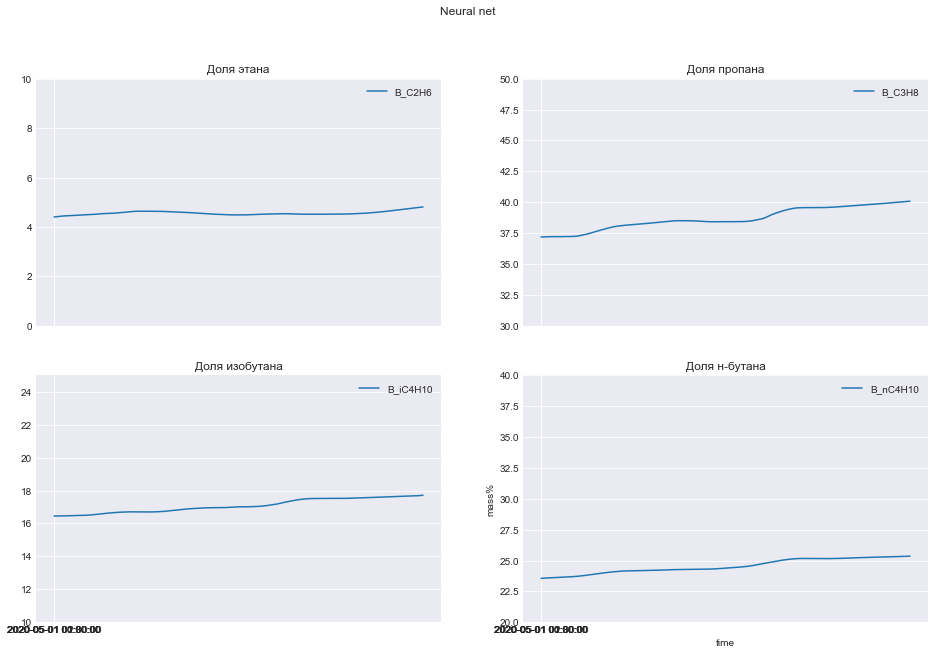

In [79]:
y_pred=model.predict(df_test_copy[train_feats])
drawPreds(y_pred, 'Neural net')

Получилось 2.66 для 600

In [80]:
outputSubmission(y_pred, 'all_Gases_and_rates_stl_500_tt_neural_net.csv')

Попробуем шкалировать трейнинг дату

In [88]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

X_train, X_valid, y_train, y_valid = train_test_split(df_train_copy[train_feats], df_train_copy[target_feats])

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_valid = scaler.transform(X_valid)

model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[10]),
    keras.layers.Dense(100, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    keras.layers.Dense(4)
])

model.compile(optimizer='adam',
              loss='mean_squared_error',
              metrics=['mean_absolute_percentage_error'])

fitted = model.fit(X_train, y_train,
                   epochs=30, validation_data=(X_valid, y_valid))

Epoch 1/30
136/136 [==============================] - 0s 3ms/step - loss: 454.4973 - mean_absolute_percentage_error: 81.5629 - val_loss: 285.6192 - val_mean_absolute_percentage_error: 56.4194
Epoch 2/30
136/136 [==============================] - 0s 2ms/step - loss: 168.6434 - mean_absolute_percentage_error: 42.2164 - val_loss: 88.6532 - val_mean_absolute_percentage_error: 30.0065
Epoch 3/30
136/136 [==============================] - 0s 2ms/step - loss: 67.5261 - mean_absolute_percentage_error: 27.5228 - val_loss: 47.2018 - val_mean_absolute_percentage_error: 22.5715
Epoch 4/30
136/136 [==============================] - 0s 2ms/step - loss: 40.6545 - mean_absolute_percentage_error: 21.1509 - val_loss: 29.3146 - val_mean_absolute_percentage_error: 16.7576
Epoch 5/30
136/136 [==============================] - 0s 2ms/step - loss: 26.3805 - mean_absolute_percentage_error: 17.0201 - val_loss: 17.1363 - val_mean_absolute_percentage_error: 12.7706
Epoch 6/30
136/136 [===========================

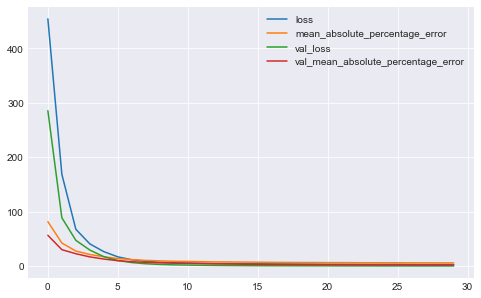

In [92]:
pd.DataFrame(fitted.history).plot(figsize=(8,5))
plt.grid(True)
plt.show()

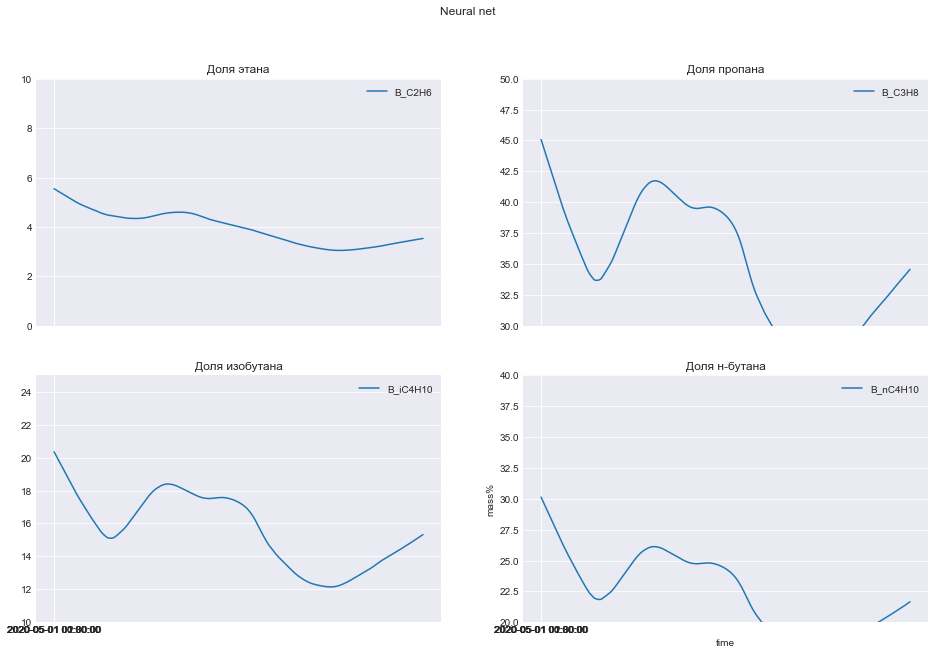

In [89]:
y_pred=model.predict(scaler.transform(df_test_copy[train_feats]))
drawPreds(y_pred, 'Neural net')

Шкалирование дает не очень классный результат

In [93]:
outputSubmission(y_pred, 'all_Gases_and_rates_stl_600_tt_neural_net_scaled.csv')

Надо попробовать обработать результаты по лучше

In [26]:
df_train_copy = df_train.copy()
df_test_copy = feat_test.copy()

In [24]:
def outliersStlPlot(df, gas, period=600):
    df_c = df.copy()
    
    if gas in ['A_rate', 'B_rate']:
        thres = [75,65]
    elif gas == 'A_CH4':
        thres = [0.3,0.07]
    elif gas in ['A_C2H6', 'B_C2H6']:
        thres = [5.5,3]
    elif gas in ['A_C3H8', 'B_C3H8']:
        thres = [41,35]
    elif gas in ['A_iC4H10', 'B_iC4H10']:
        thres = [19,16.5]
    elif gas in ['A_nC4H10', 'B_nC4H10']:
        thres = [27,22]
    elif gas in ['A_iC5H12', 'A_nC5H12']:
        thres = [6.5,3.5]
    elif gas == 'A_C6H14':
        thres = [7,3]
    
    filtered = []
    for i, value in enumerate(df_c[gas].values):
        if value<thres[1] or value>thres[0]:
            filtered.append(np.nan)
        else:
            filtered.append(value)
    df_c[gas] = filtered
    
    return stlTrendNoReturn(df_c, gas, period=period, plots=False)

def stlTrendNoReturn(df, gas, period=600, plots=True):
    gas_time = df.set_index('timestamp')[gas].interpolate(axis=0)
    if pd.isnull(gas_time[0]):
        gas_time[0] = gas_time[1]
    stl = STL(gas_time, period=period, robust=True).fit()
    if plots:
        plt.figure(figsize=(18,6))
        plt.plot(df['timestamp'], stl.observed.values, label='observed')
        plt.plot(df['timestamp'], stl.trend.values, label='trend')
        plt.title(gas)
        plt.legend()
        plt.xticks(np.arange(10))
        plt.ylabel('mass%')
        plt.xlabel('time')
        plt.style.use('seaborn-darkgrid')
        plt.show()
    return stl.trend.values

In [24]:
train_feats

['A_rate',
 'A_CH4',
 'A_C2H6',
 'A_C3H8',
 'A_iC4H10',
 'A_nC4H10',
 'A_iC5H12',
 'A_nC5H12',
 'A_C6H14',
 'B_rate']

In [251]:
columns_200=['A_CH4', 'A_C2H6', 'A_C3H8']
columns_400=['A_rate', 'B_rate', 'A_iC4H10', 'A_nC4H10', 'A_iC5H12', 'A_nC5H12', 'A_C6H14', 'B_C2H6', 'B_C3H8', 'B_iC4H10', 'B_nC4H10']

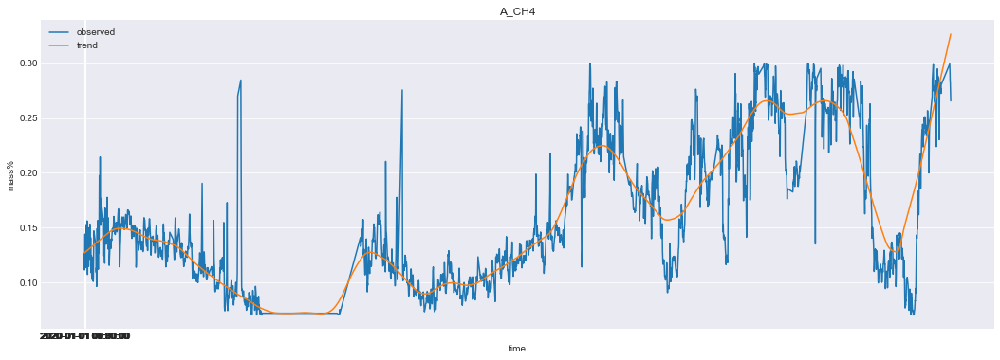

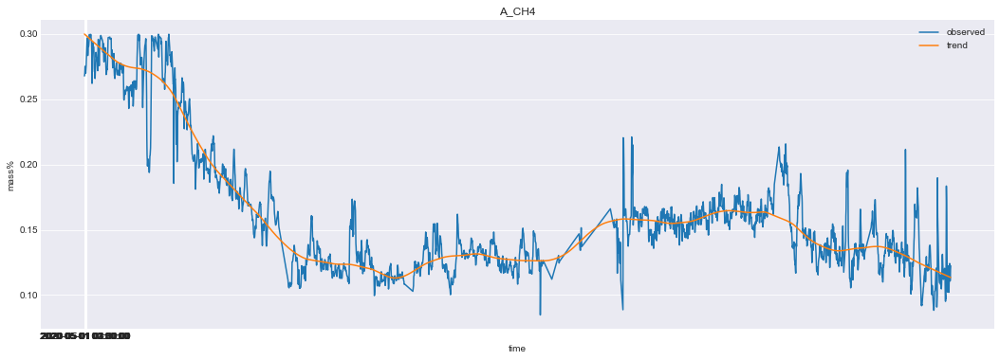

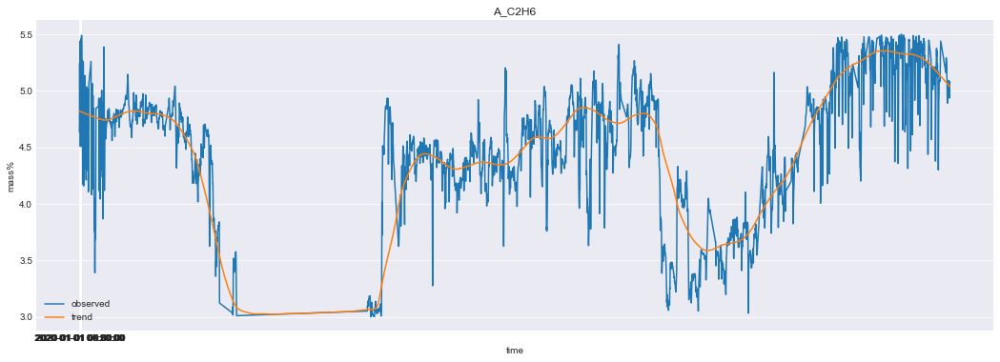

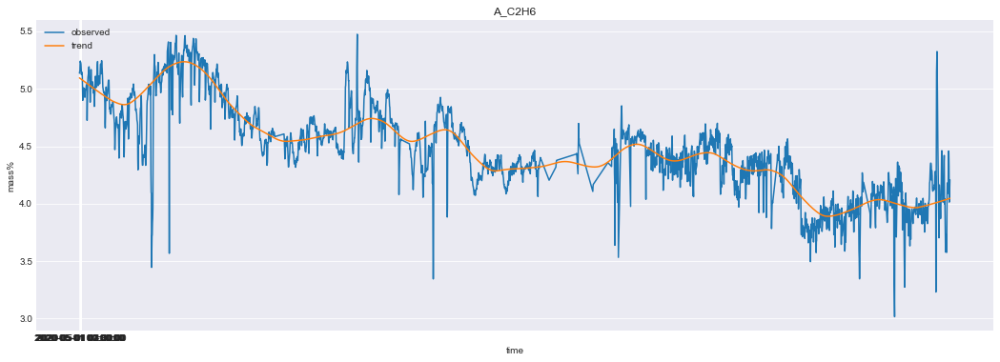

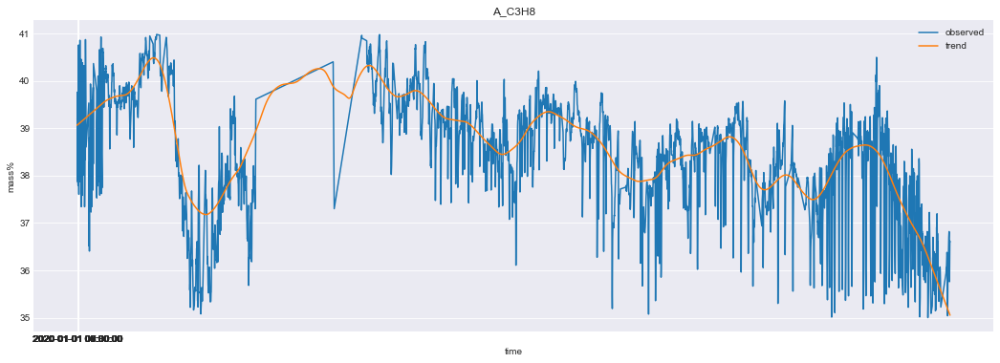

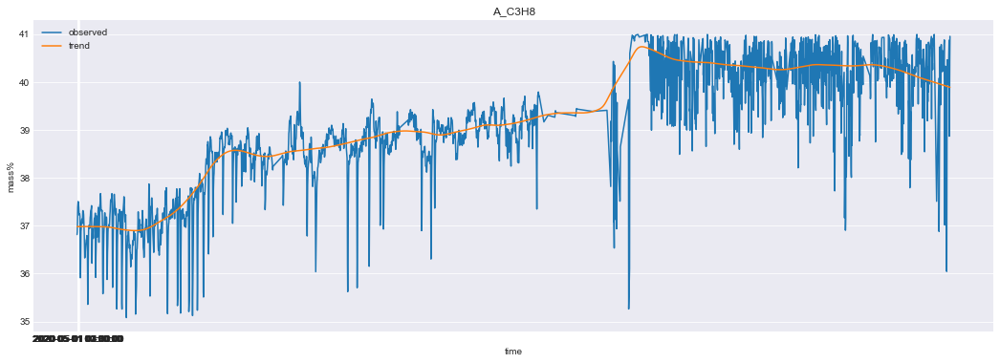

In [252]:
for column in columns_200:
    df_train_copy[column] = outliersStlPlot(df_train_copy, column, 200)
    df_test_copy[column] = outliersStlPlot(df_test_copy, column, 200)

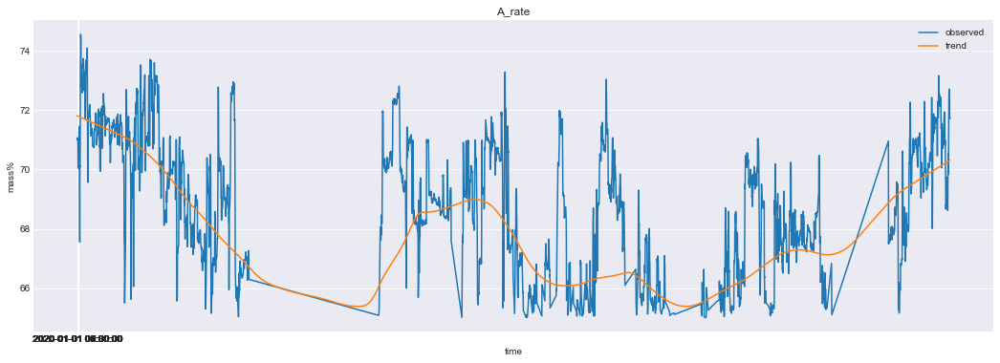

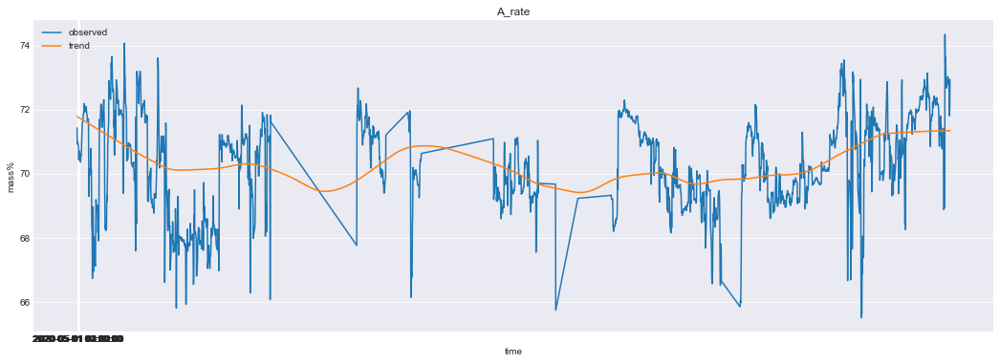

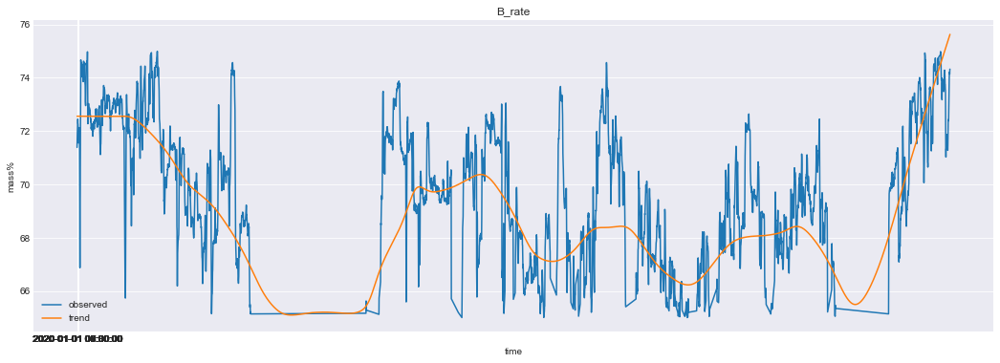

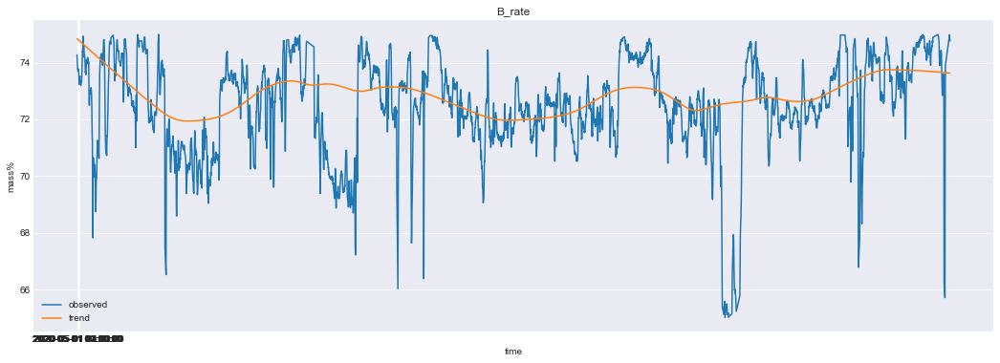

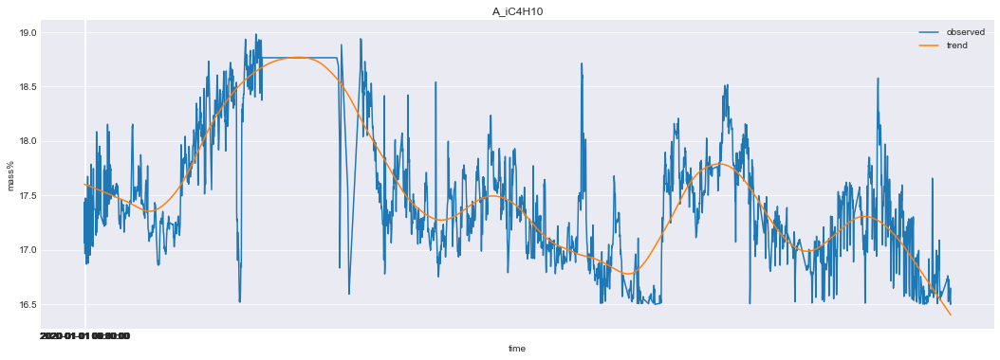

...

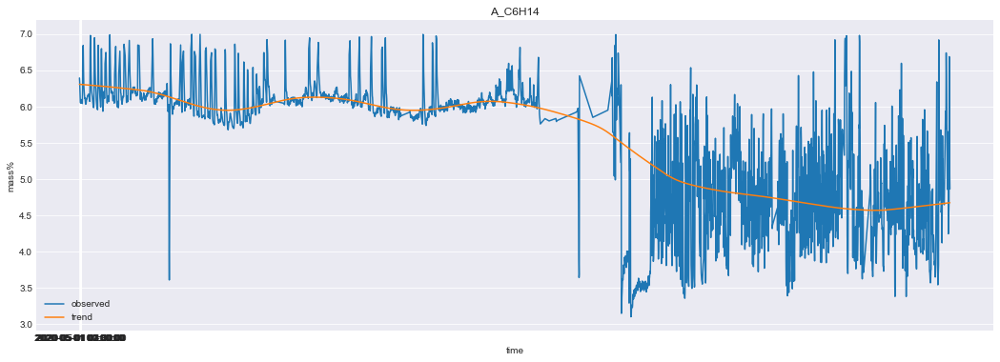

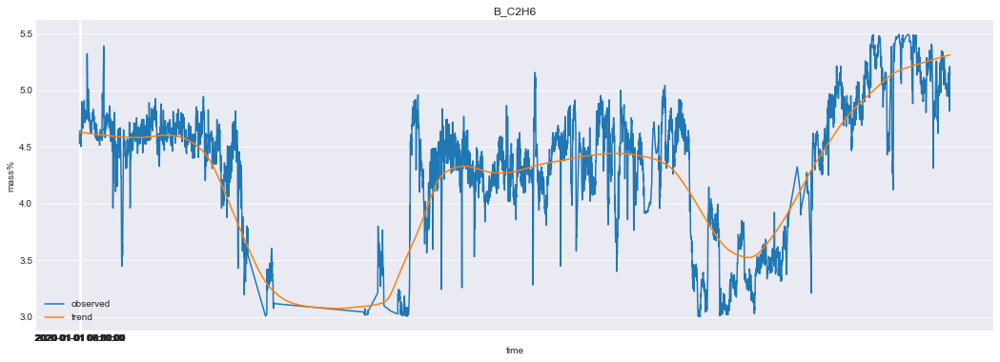

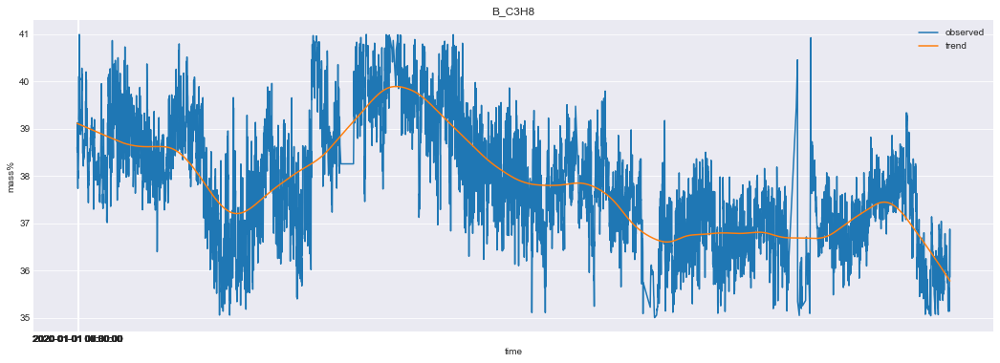

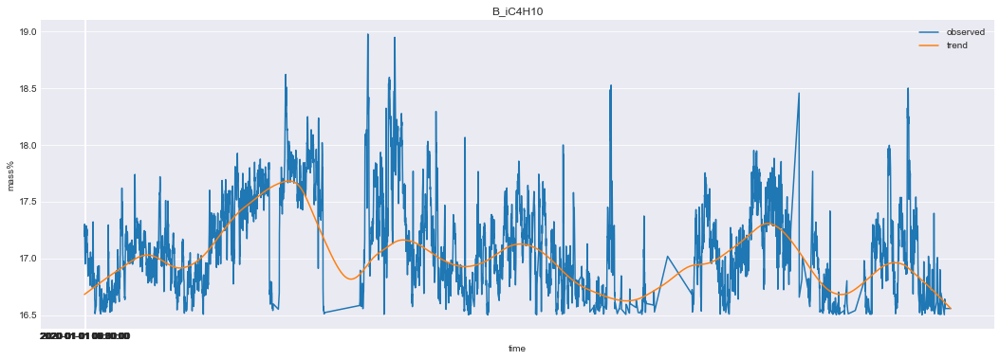

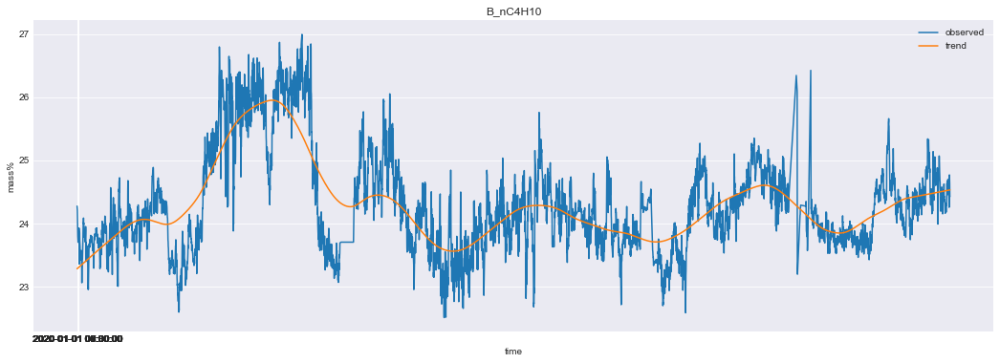

In [253]:
for column in columns_400[:7]:
    df_train_copy[column] = outliersStlPlot(df_train_copy, column, 400)
    df_test_copy[column] = outliersStlPlot(df_test_copy, column, 400)
for column in columns_400[7:]:
    df_train_copy[column] = outliersStlPlot(df_train_copy, column, 400)

In [255]:
X_train, X_test, y_train, y_test = train_test_split(df_train_copy[train_feats], 
                                                    df_train_copy[target_feats], test_size=0.25, random_state=23)

params = {
    'n_estimators': [50, 100, 200, 300, 500],
    'max_depth': [1,2,3,4,5,6,8],
    'min_samples_split': [2,4,6,8]
}
random_forest = RandomForestRegressor(n_jobs=-1)
gc_cv = GridSearchCV(random_forest, params)
gc_cv.fit(X_train, y_train)
print(gc_cv.best_score_, gc_cv.best_params_)

0.9990375726663497 {'max_depth': 8, 'min_samples_split': 2, 'n_estimators': 300}


In [257]:
for i in range(4):
    rf = RandomForestRegressor(n_estimators=300, max_depth=8, min_samples_split=2,n_jobs=-1)
    rf.fit(X_train, y_train.iloc[:,i])
    y_pred = rf.predict(X_test)
    print(mape(y_test.iloc[:,i], y_pred))

0.109
0.041
0.048
0.05


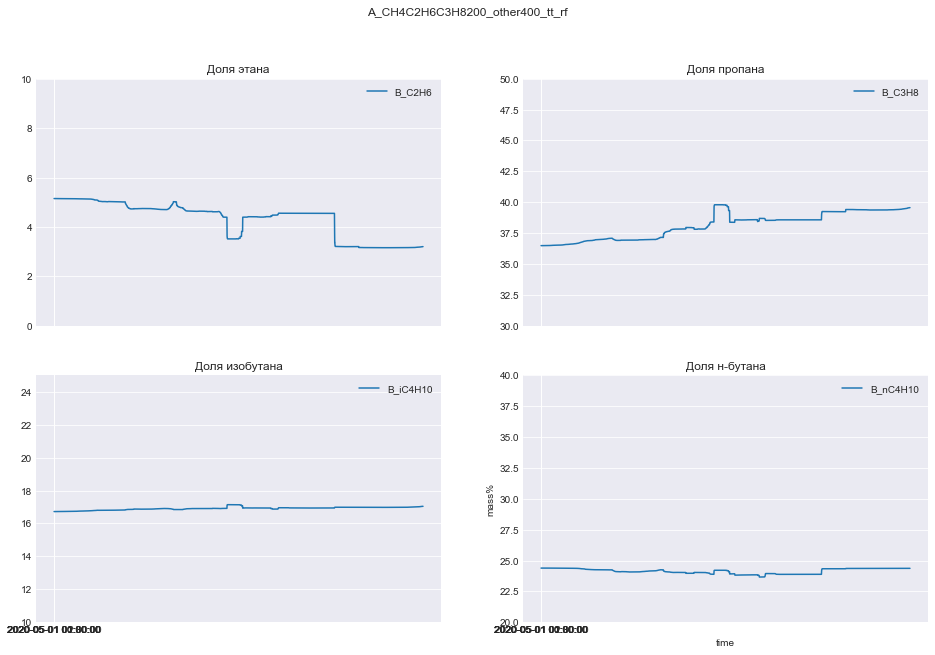

In [258]:
rf = RandomForestRegressor(n_estimators=300, max_depth=8, min_samples_split=2,n_jobs=-1)
rf.fit(df_train_copy[train_feats], df_train_copy[target_feats])
test_preds = rf.predict(df_test_copy[train_feats])

outputSubmission(test_preds, 'A_CH4C2H6C3H8200_other400_tt_rf.csv')

drawPreds(test_preds, 'A_CH4C2H6C3H8200_other400_tt_rf')

MAPE_val:  3.65


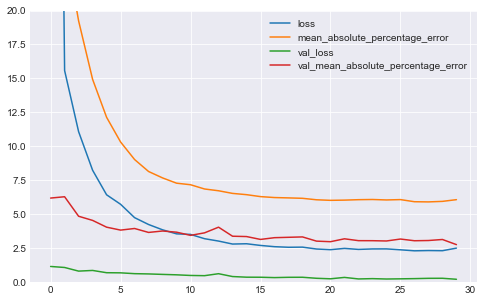

In [278]:
model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[10]),
    keras.layers.Dense(100, activation='relu'),
    tf.keras.layers.Dropout(0.1),
    keras.layers.Dense(4)
])

model.compile(optimizer='adam',
              loss='mean_squared_error',
              metrics=['mean_absolute_percentage_error'])

fitted = model.fit(X_train, y_train,
                   epochs=30, validation_data=(X_test, y_test), verbose=0)

print('MAPE_val: ',np.mean(fitted.history['val_mean_absolute_percentage_error']).round(2))
pd.DataFrame(fitted.history).plot(figsize=(8,5))
plt.ylim([0,20])
plt.grid(True)
plt.show()

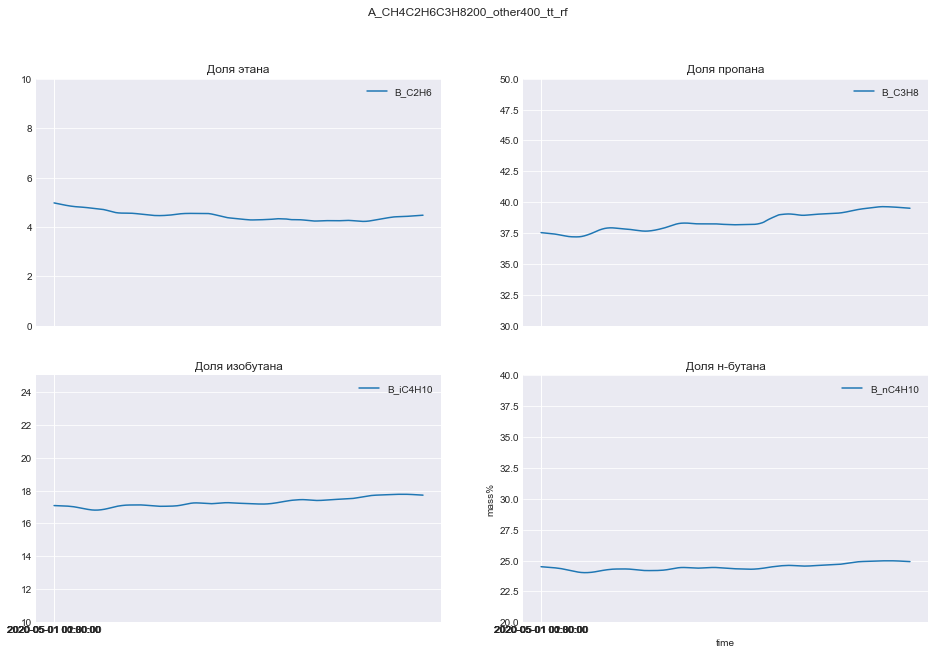

In [262]:
test_preds = model.predict(df_test_copy[train_feats])

outputSubmission(test_preds, 'A_CH4C2H6C3H8200_other400_tt_neuralNet.csv')

drawPreds(test_preds, 'A_CH4C2H6C3H8200_other400_tt_rf')

Попробовать на множить данные разными способами - отрезать выбросы и оставить

Train dataset


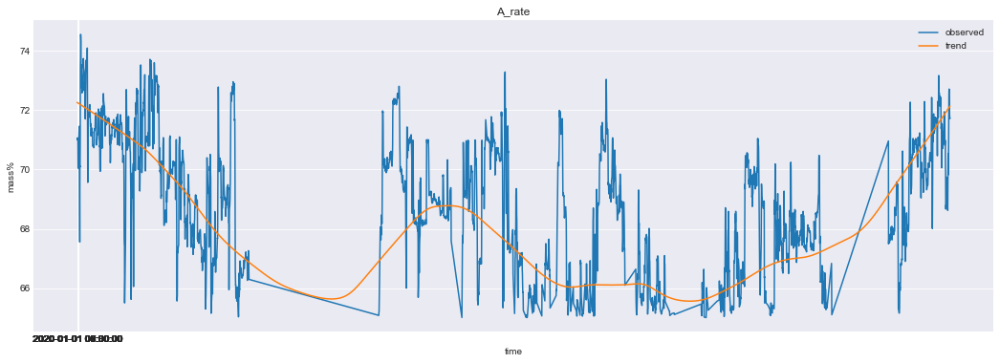

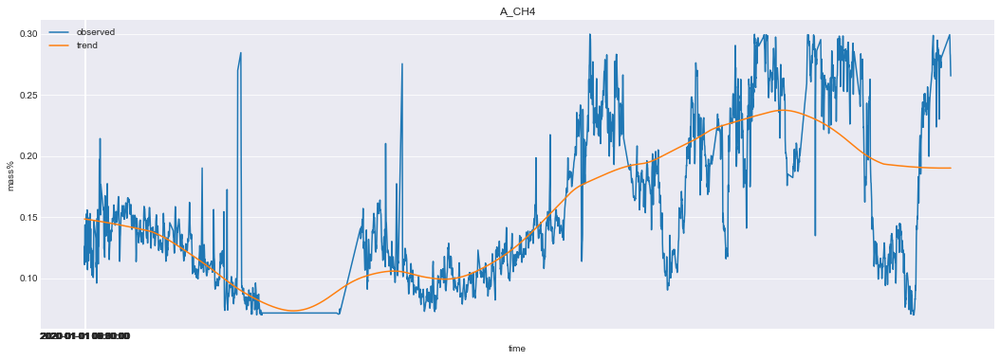

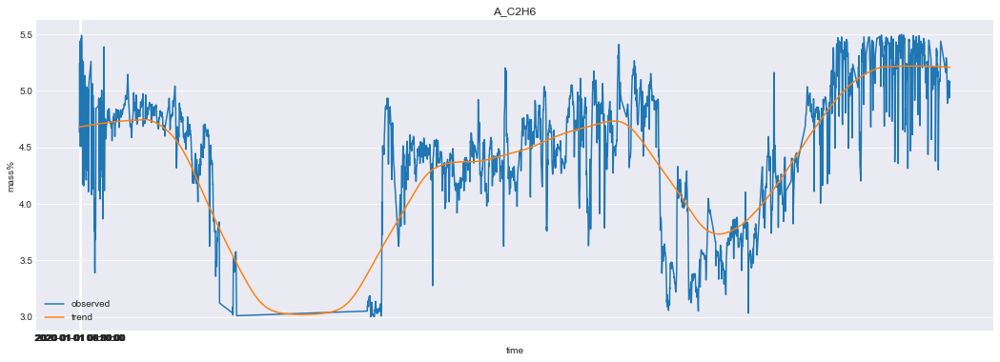

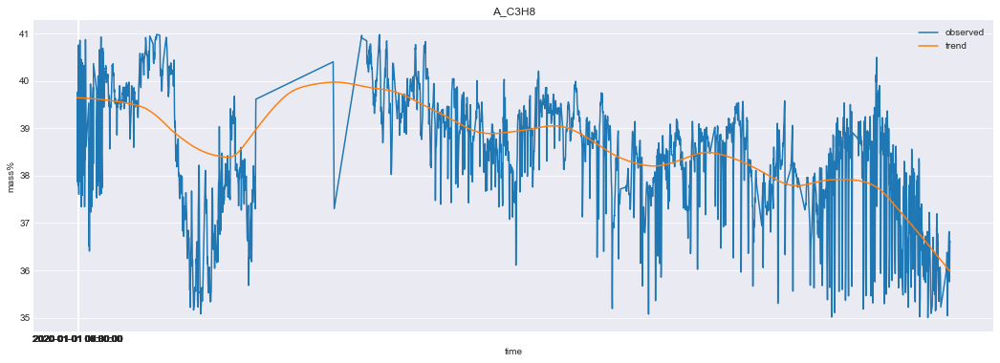

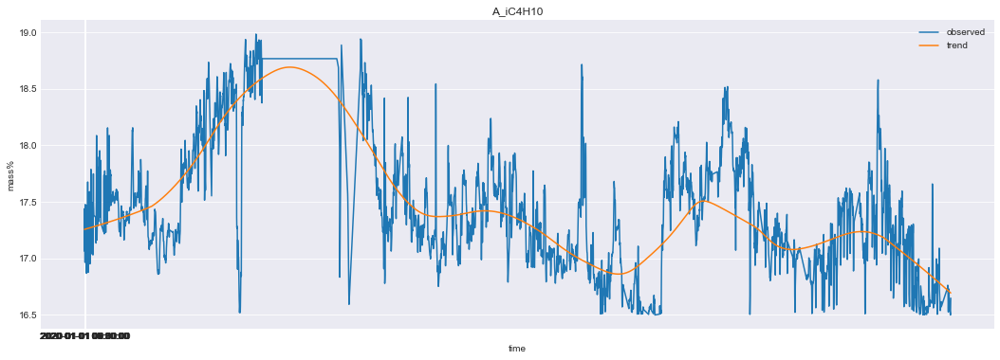

...

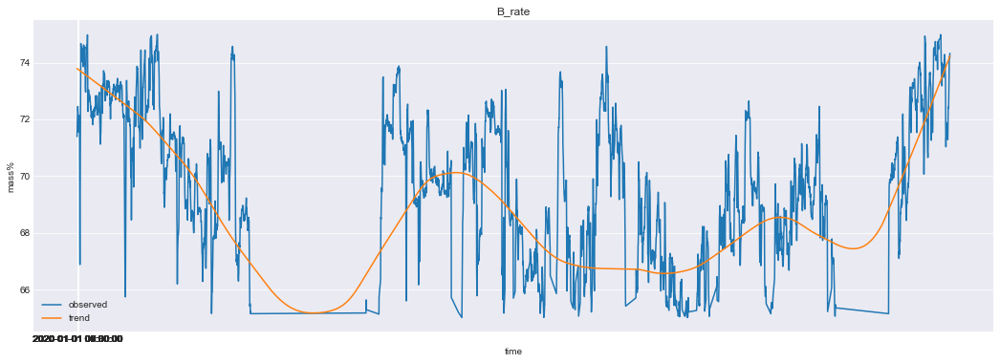

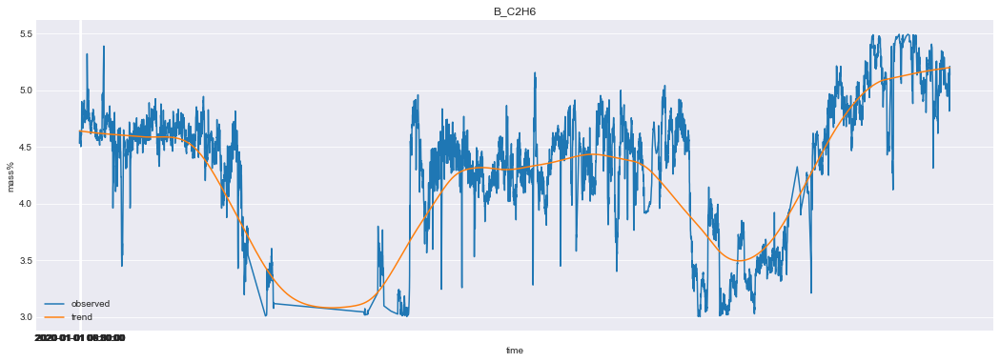

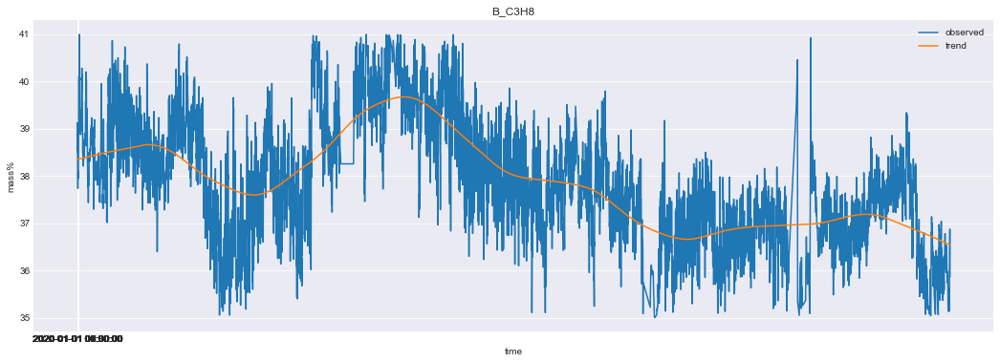

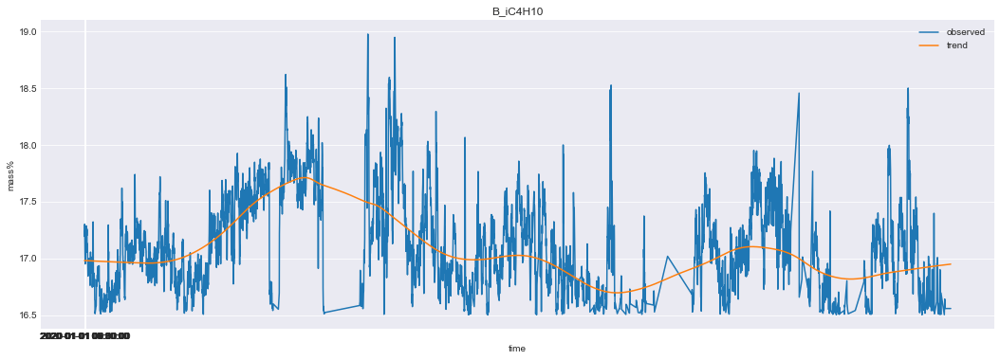

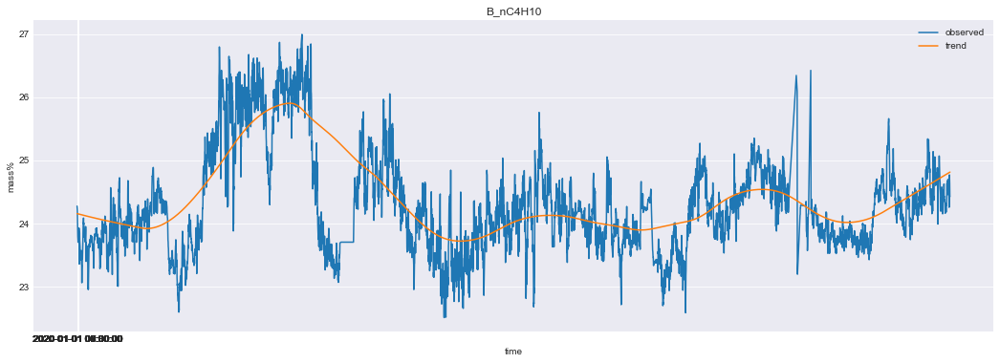

Test dataset


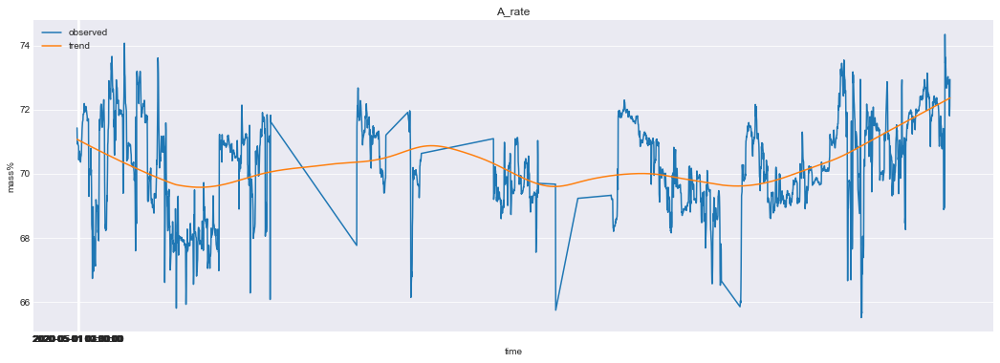

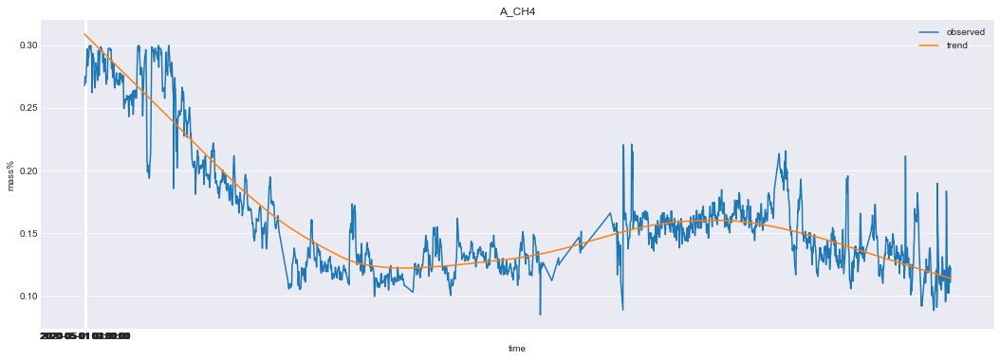

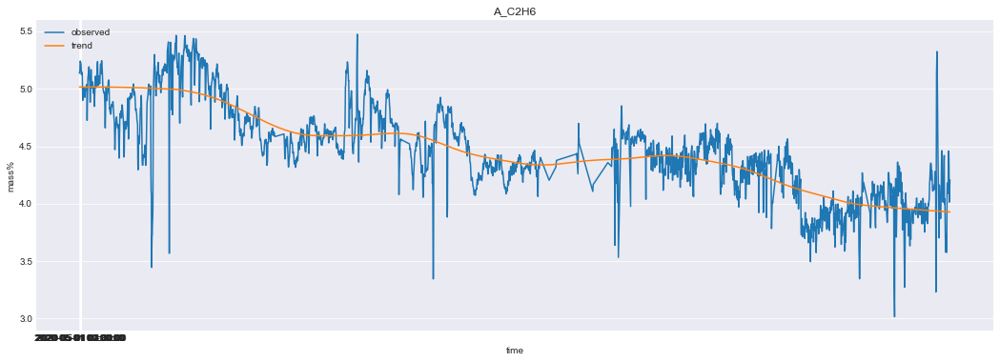

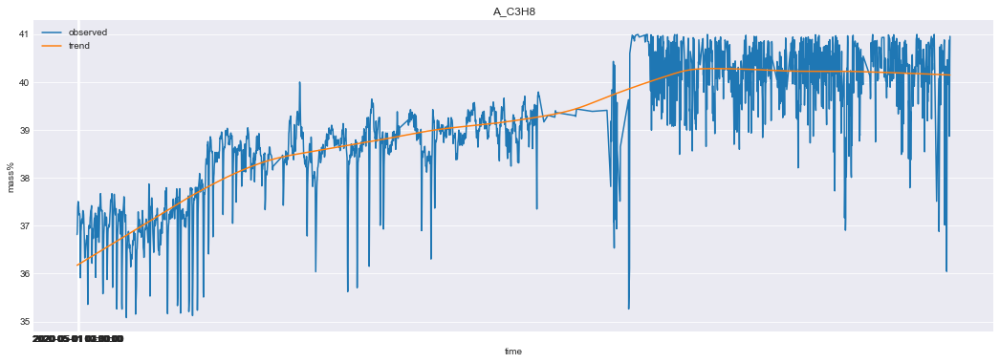

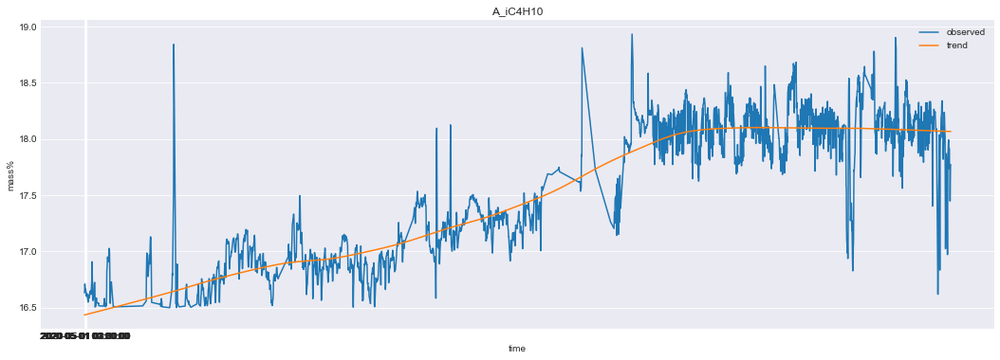

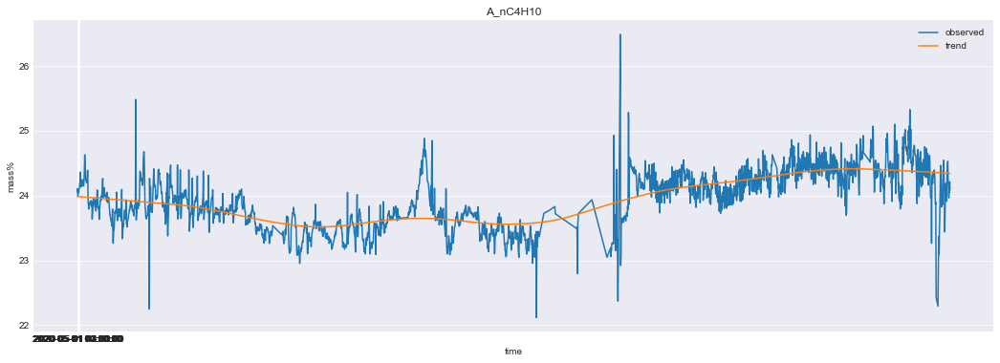

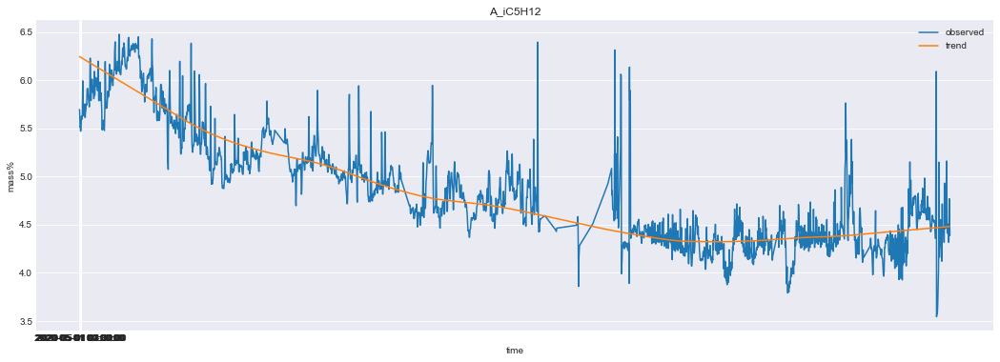

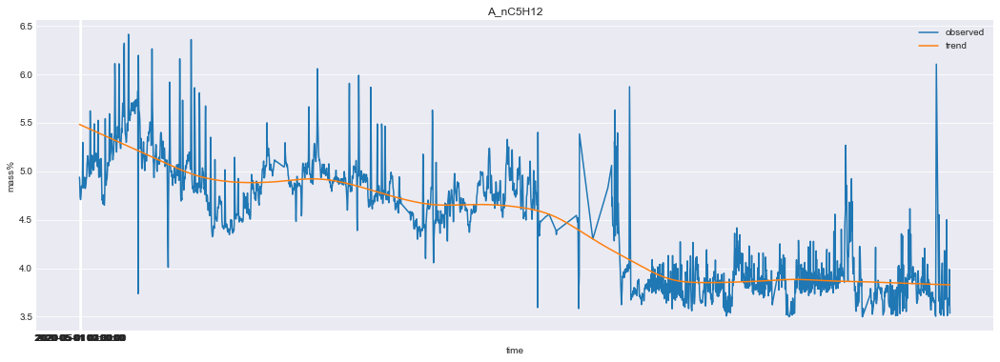

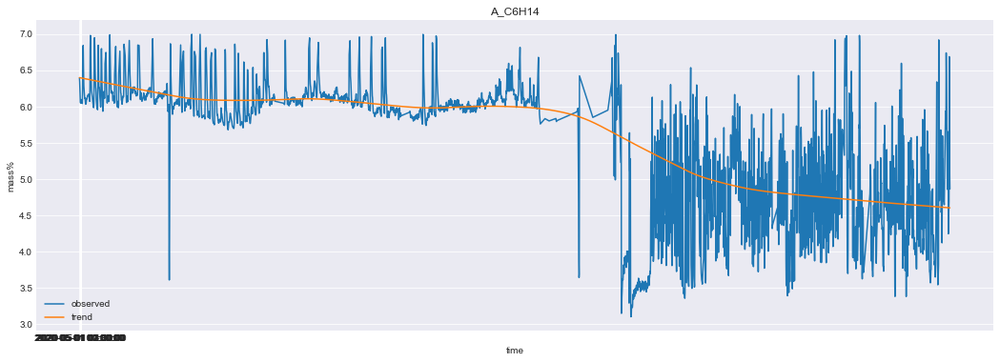

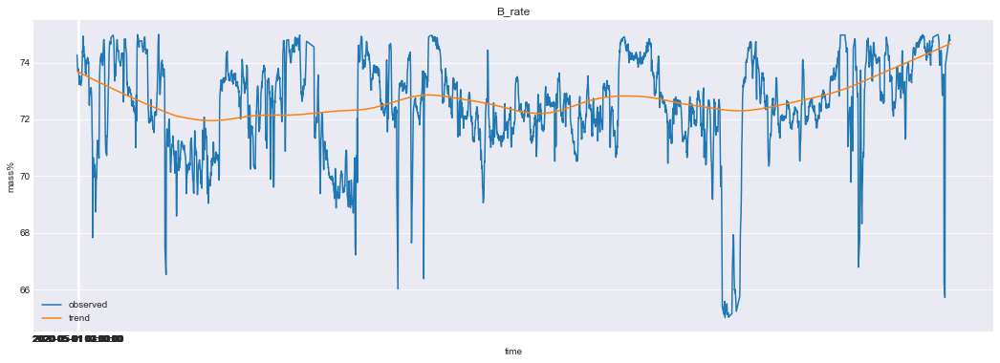

In [288]:
print('Train dataset')
for column in train_feats+target_feats:
    df_train_copy[column] = outliersStlPlot(df_train_copy, column)
print('Test dataset')
for column in train_feats:
    df_test_copy[column] = outliersStlPlot(df_test_copy, column)

In [290]:
X_train, X_test, y_train, y_test = train_test_split(df_train_copy[train_feats], 
                                                    df_train_copy[target_feats], test_size=0.25, random_state=23)

Epoch 1/30
136/136 [==============================] - 0s 2ms/step - loss: 64.4166 - mean_absolute_percentage_error: 31.5118 - val_loss: 0.6466 - val_mean_absolute_percentage_error: 4.3375
Epoch 2/30
136/136 [==============================] - 0s 2ms/step - loss: 11.1796 - mean_absolute_percentage_error: 20.3126 - val_loss: 0.6545 - val_mean_absolute_percentage_error: 4.4324
Epoch 3/30
136/136 [==============================] - 0s 2ms/step - loss: 8.0003 - mean_absolute_percentage_error: 15.3495 - val_loss: 0.5471 - val_mean_absolute_percentage_error: 4.3854
Epoch 4/30
136/136 [==============================] - 0s 2ms/step - loss: 6.2231 - mean_absolute_percentage_error: 12.5061 - val_loss: 0.5305 - val_mean_absolute_percentage_error: 4.3791
Epoch 5/30
136/136 [==============================] - 0s 2ms/step - loss: 5.2407 - mean_absolute_percentage_error: 10.4742 - val_loss: 0.5128 - val_mean_absolute_percentage_error: 4.4539
Epoch 6/30
136/136 [==============================] - 0s 2ms/st

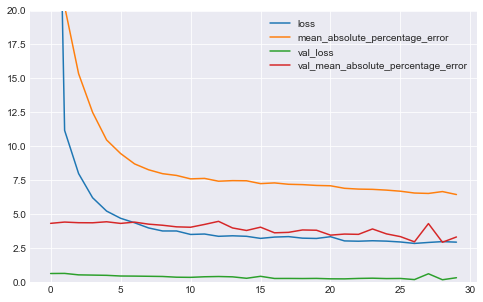

In [291]:
model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[10]),
    keras.layers.Dense(100, activation='relu'),
    tf.keras.layers.Dropout(0.1),
    keras.layers.Dense(4)
])

model.compile(optimizer='adam',
              loss='mean_squared_error',
              metrics=['mean_absolute_percentage_error'])

fitted = model.fit(X_train, y_train,
                   epochs=30, validation_data=(X_test, y_test))

pd.DataFrame(fitted.history).plot(figsize=(8,5))
plt.ylim([0,20])
plt.grid(True)
plt.show()

### Лучший результат 2.56

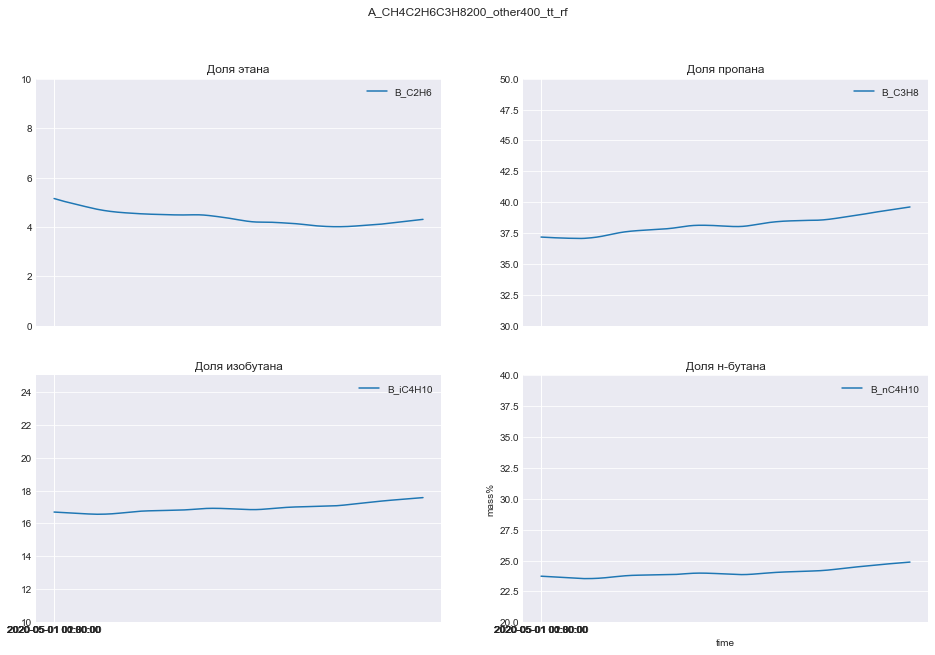

In [303]:
test_preds = model.predict(df_test_copy[train_feats])

outputSubmission(test_preds, 'CutOutliers_all600_tt_nn_100_01do_adam.csv')

drawPreds(test_preds, 'Best sub')

Пробуем настроить модель с помощью примитивных циклов for

In [25]:
def simpleNN(n_neurons=100, drop_out=0.05):
    model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[10]),
    keras.layers.Dense(n_neurons, activation='relu'),
    tf.keras.layers.Dropout(drop_out),
    keras.layers.Dense(4)
    ])

    model.compile(optimizer='adam',
                  loss='mean_squared_error',
                  metrics=['mean_absolute_percentage_error'])

    fitted = model.fit(X_train, y_train,
                       epochs=30, validation_data=(X_test, y_test))
    return model
    #if np.mean(fitted.history['val_mean_absolute_percentage_error'][-10:]).round(2)< 10:
     #   print(n_neurons, drop_out.round(2), np.mean(fitted.history['val_mean_absolute_percentage_error'][-10:]).round(2))

Пробуем добавить исскуственно информации:
- взять значение с предыдущего замера, т.е. пол часа назад
- взять тренд с разным периодом (например, от 550 до 650 с шагом 10)

In [318]:
df_train.head()

,timestamp,A_rate,A_CH4,A_C2H6,A_C3H8,A_iC4H10,A_nC4H10,A_iC5H12,A_nC5H12,A_C6H14,B_rate,B_C2H6,B_C3H8,B_iC4H10,B_nC4H10
9,2020-01-01 04:30:00,71.055792,0.126244,5.242957,41.941480,17.064213,23.205953,4.184848,4.062079,4.110170,71.389674,4.532649,38.604149,17.238489,24.275393
10,2020-01-01 05:00:00,71.029881,0.111301,4.632455,39.198330,17.440245,24.331520,4.615703,4.545702,5.072316,71.792506,4.578543,38.510623,17.193441,24.242152
11,2020-01-01 05:30:00,71.008884,0.125176,4.730933,37.874656,17.353362,24.567692,4.847911,4.818913,5.626975,71.939558,4.642879,39.124029,17.301609,24.211492
12,2020-01-01 06:00:00,71.060109,0.141546,5.214231,39.763493,17.098163,23.758240,4.512244,4.429068,5.021207,72.124690,4.549837,38.247333,17.118282,24.044074
13,2020-01-01 06:30:00,71.067865,0.143911,5.440833,41.616510,16.964787,23.121613,4.212636,4.088066,4.347822,72.278288,4.556611,37.985776,17.038811,23.931490


In [342]:
for value in train_feats[2:6]:
    df_train_copy['shift+1_{}'.format(value)] = [df_train_copy[value].values[0]] + list(df_train_copy[value].values[:-1])
    df_test_copy['shift+1_{}'.format(value)] = [df_test_copy[value].values[0]] + list(df_test_copy[value].values[:-1])
    df_train_copy['shift+2_{}'.format(value)] = list(df_train_copy[value].values[0:2]) + list(df_train_copy[value].values[:-2])
    df_test_copy['shift+2_{}'.format(value)] = list(df_test_copy[value].values[0:2]) + list(df_test_copy[value].values[:-2])
    df_train_copy['shift+3_{}'.format(value)] = list(df_train_copy[value].values[0:3]) + list(df_train_copy[value].values[:-3])
    df_test_copy['shift+3_{}'.format(value)] = list(df_test_copy[value].values[0:3]) + list(df_test_copy[value].values[:-3])
    df_train_copy['shift+4_{}'.format(value)] = list(df_train_copy[value].values[0:4]) + list(df_train_copy[value].values[:-4])
    df_test_copy['shift+4_{}'.format(value)] = list(df_test_copy[value].values[0:4]) + list(df_test_copy[value].values[:-4])
    df_train_copy['shift+5_{}'.format(value)] = list(df_train_copy[value].values[0:5]) + list(df_train_copy[value].values[:-5])
    df_test_copy['shift+5_{}'.format(value)] = list(df_test_copy[value].values[0:5]) + list(df_test_copy[value].values[:-5])

и навернем это на ту же модель

In [344]:
X_train, X_test, y_train, y_test = train_test_split(df_train_copy[train_feats], 
                                                    df_train_copy[target_feats], test_size=0.25, random_state=23)

Epoch 1/60
136/136 [==============================] - 0s 3ms/step - loss: 83.0158 - mean_absolute_percentage_error: 51.1362 - val_loss: 0.6824 - val_mean_absolute_percentage_error: 5.1724
Epoch 2/60
136/136 [==============================] - 0s 2ms/step - loss: 11.5074 - mean_absolute_percentage_error: 21.8261 - val_loss: 0.7614 - val_mean_absolute_percentage_error: 5.2279
Epoch 3/60
136/136 [==============================] - 0s 2ms/step - loss: 9.0927 - mean_absolute_percentage_error: 18.7153 - val_loss: 0.6816 - val_mean_absolute_percentage_error: 4.9359
Epoch 4/60
136/136 [==============================] - 0s 2ms/step - loss: 7.1688 - mean_absolute_percentage_error: 16.3869 - val_loss: 0.7073 - val_mean_absolute_percentage_error: 4.9336
Epoch 5/60
136/136 [==============================] - 0s 2ms/step - loss: 6.0980 - mean_absolute_percentage_error: 14.7260 - val_loss: 0.5516 - val_mean_absolute_percentage_error: 4.2792
Epoch 6/60
136/136 [==============================] - 0s 2ms/st

Epoch 45/60
136/136 [==============================] - 0s 2ms/step - loss: 2.0323 - mean_absolute_percentage_error: 5.8317 - val_loss: 0.2014 - val_mean_absolute_percentage_error: 2.8546
Epoch 46/60
136/136 [==============================] - 0s 2ms/step - loss: 2.0317 - mean_absolute_percentage_error: 5.7579 - val_loss: 0.1538 - val_mean_absolute_percentage_error: 2.5942
Epoch 47/60
136/136 [==============================] - 0s 2ms/step - loss: 2.0560 - mean_absolute_percentage_error: 5.7162 - val_loss: 0.1395 - val_mean_absolute_percentage_error: 2.5851
Epoch 48/60
136/136 [==============================] - 1s 4ms/step - loss: 2.0323 - mean_absolute_percentage_error: 5.7364 - val_loss: 0.1937 - val_mean_absolute_percentage_error: 2.8241
Epoch 49/60
136/136 [==============================] - 0s 2ms/step - loss: 2.0653 - mean_absolute_percentage_error: 5.8037 - val_loss: 0.4094 - val_mean_absolute_percentage_error: 3.3383
Epoch 50/60
136/136 [==============================] - 0s 2ms/ste

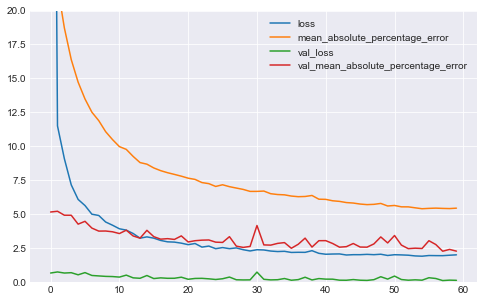

In [346]:
model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[35]),
    keras.layers.Dense(100, activation='relu'),
    tf.keras.layers.Dropout(0.1),
    keras.layers.Dense(4)
])

model.compile(optimizer='adam',
              loss='mean_squared_error',
              metrics=['mean_absolute_percentage_error'])

fitted = model.fit(X_train, y_train,
                   epochs=60, validation_data=(X_test, y_test))
print('MAPE_val: ',np.mean(fitted.history['val_mean_absolute_percentage_error']).round(2))
pd.DataFrame(fitted.history).plot(figsize=(8,5))
plt.ylim([0,20])
plt.grid(True)
plt.show()

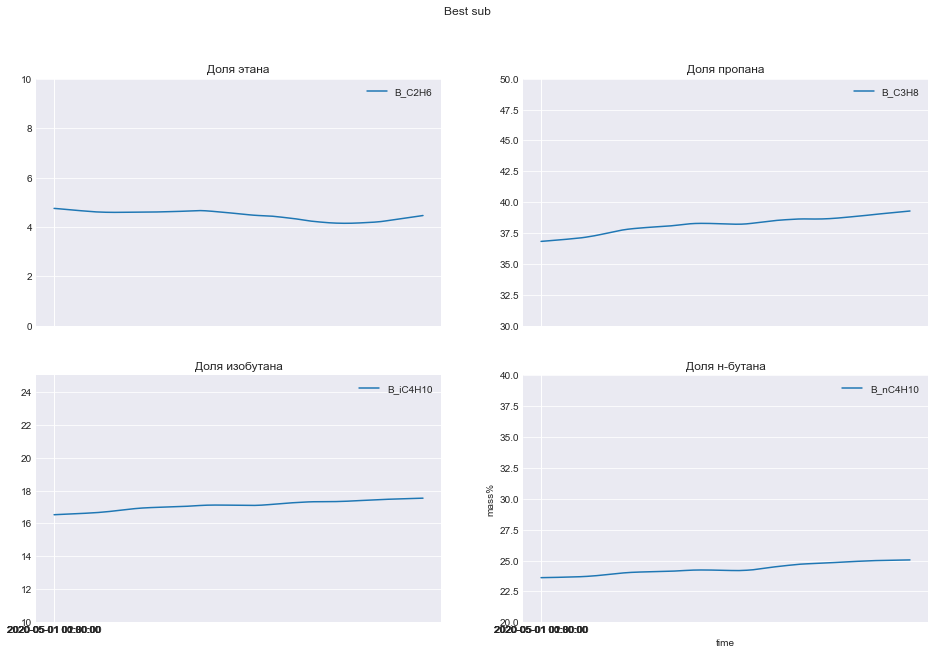

In [347]:
test_preds = model.predict(df_test_copy[train_feats])

outputSubmission(test_preds, 'CutOutliers_all600_tt_nn_100_01do_adam_with_5addstepsperiods.csv')

drawPreds(test_preds, 'Best sub')

In [349]:
df_train_copy.shape

(5799, 35)

Добавляем столбцы - говно идея

In [356]:
for period in np.arange(550,660,10):
    for column in train_feats:
        df_train_copy['{}_{}'.format(column, period)] = outliersStlPlot(df_train_copy, column,period)
        df_test_copy['{}_{}'.format(column, period)] = outliersStlPlot(df_test_copy, column, period)

MAPE_val:  nan


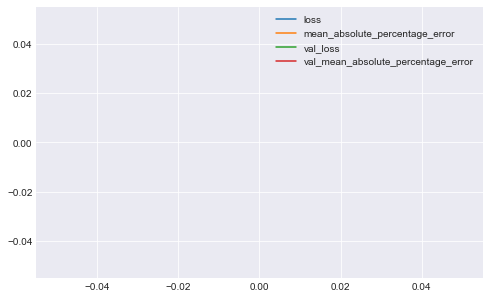

In [387]:
X_train, X_test, y_train, y_test = train_test_split(df_train_copy.iloc[:, 15:], 
                                                    df_train_copy.iloc[:, 11:15], test_size=0.25, random_state=23)

model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[110]),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(300, activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(300, activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(4)
])

model.compile(optimizer='adam',
              loss='mean_squared_error',
              metrics=['mean_absolute_percentage_error'])

fitted = model.fit(X_train, y_train,
                   epochs=50, validation_data=(X_test, y_test), verbose=0)
print('MAPE_val: ',np.mean(fitted.history['val_mean_absolute_percentage_error']).round(2))
pd.DataFrame(fitted.history).plot(figsize=(8,5))
#plt.ylim([0,10])
plt.grid(True)
plt.show()

In [25]:
print(df_train_copy.shape, df_test_copy.shape)

(5799, 15) (3984, 11)


In [27]:
%%time
df_train_550 = pd.DataFrame()
df_test_550 = pd.DataFrame()
for column in train_feats:
    df_train_550[column] = outliersStlPlot(df_train_copy, column,550)
    df_test_550[column] = outliersStlPlot(df_test_copy, column,550)
for column in target_feats:
    df_train_550[column] = outliersStlPlot(df_train_copy, column,550)

Wall time: 12min 27s


In [28]:
%%time
df_train_560 = pd.DataFrame()
df_test_560 = pd.DataFrame()
for column in train_feats:
    df_train_560[column] = outliersStlPlot(df_train_copy, column,560)
    df_test_560[column] = outliersStlPlot(df_test_copy, column,560)
for column in target_feats:
    df_train_560[column] = outliersStlPlot(df_train_copy, column,560)

Wall time: 13min 40s


In [29]:
%%time
df_train_570 = pd.DataFrame()
df_test_570 = pd.DataFrame()
for column in train_feats:
    df_train_570[column] = outliersStlPlot(df_train_copy, column,570)
    df_test_570[column] = outliersStlPlot(df_test_copy, column,570)
for column in target_feats:
    df_train_570[column] = outliersStlPlot(df_train_copy, column,570)

Wall time: 13min 44s


In [30]:
%%time
df_train_580 = pd.DataFrame()
df_test_580 = pd.DataFrame()
for column in train_feats:
    df_train_580[column] = outliersStlPlot(df_train_copy, column,580)
    df_test_580[column] = outliersStlPlot(df_test_copy, column,580)
for column in target_feats:
    df_train_580[column] = outliersStlPlot(df_train_copy, column,580)

Wall time: 13min 33s


In [31]:
%%time
df_train_590 = pd.DataFrame()
df_test_590 = pd.DataFrame()
for column in train_feats:
    df_train_590[column] = outliersStlPlot(df_train_copy, column,590)
    df_test_590[column] = outliersStlPlot(df_test_copy, column,590)
for column in target_feats:
    df_train_590[column] = outliersStlPlot(df_train_copy, column,590)

Wall time: 13min 30s


In [32]:
%%time
df_train_600 = pd.DataFrame()
df_test_600 = pd.DataFrame()
for column in train_feats:
    df_train_600[column] = outliersStlPlot(df_train_copy, column,600)
    df_test_600[column] = outliersStlPlot(df_test_copy, column,600)
for column in target_feats:
    df_train_600[column] = outliersStlPlot(df_train_copy, column,600)

Wall time: 13min 44s


In [33]:
%%time
df_train_610 = pd.DataFrame()
df_test_610 = pd.DataFrame()
for column in train_feats:
    df_train_610[column] = outliersStlPlot(df_train_copy, column,610)
    df_test_610[column] = outliersStlPlot(df_test_copy, column,610)
for column in target_feats:
    df_train_610[column] = outliersStlPlot(df_train_copy, column,610)

Wall time: 13min 50s


In [34]:
%%time
df_train_620 = pd.DataFrame()
df_test_620 = pd.DataFrame()
for column in train_feats:
    df_train_620[column] = outliersStlPlot(df_train_copy, column,620)
    df_test_620[column] = outliersStlPlot(df_test_copy, column,620)
for column in target_feats:
    df_train_620[column] = outliersStlPlot(df_train_copy, column,620)

Wall time: 14min 22s


In [35]:
%%time
df_train_630 = pd.DataFrame()
df_test_630 = pd.DataFrame()
for column in train_feats:
    df_train_630[column] = outliersStlPlot(df_train_copy, column,630)
    df_test_630[column] = outliersStlPlot(df_test_copy, column,630)
for column in target_feats:
    df_train_630[column] = outliersStlPlot(df_train_copy, column,630)

Wall time: 14min 27s


In [36]:
%%time
df_train_640 = pd.DataFrame()
df_test_640 = pd.DataFrame()
for column in train_feats:
    df_train_640[column] = outliersStlPlot(df_train_copy, column,640)
    df_test_640[column] = outliersStlPlot(df_test_copy, column,640)
for column in target_feats:
    df_train_640[column] = outliersStlPlot(df_train_copy, column,640)

Wall time: 14min 35s


In [37]:
%%time
df_train_650 = pd.DataFrame()
df_test_650 = pd.DataFrame()
for column in train_feats:
    df_train_650[column] = outliersStlPlot(df_train_copy, column,650)
    df_test_650[column] = outliersStlPlot(df_test_copy, column,650)
for column in target_feats:
    df_train_650[column] = outliersStlPlot(df_train_copy, column,650)

Wall time: 14min 49s


In [52]:
df_train_550_650 = pd.DataFrame()
df_test_550_650 = pd.DataFrame()

In [53]:
df_train_550_650 = df_train_550_650.append(df_train_550)
df_train_550_650 = df_train_550_650.append(df_train_560)
df_train_550_650 = df_train_550_650.append(df_train_570)
df_train_550_650 = df_train_550_650.append(df_train_580)
df_train_550_650 = df_train_550_650.append(df_train_590)
df_train_550_650 = df_train_550_650.append(df_train_600)
df_train_550_650 = df_train_550_650.append(df_train_610)
df_train_550_650 = df_train_550_650.append(df_train_620)
df_train_550_650 = df_train_550_650.append(df_train_630)
df_train_550_650 = df_train_550_650.append(df_train_640)
df_train_550_650 = df_train_550_650.append(df_train_650)

df_test_550_650 = df_test_550_650.append(df_test_550)
df_test_550_650 = df_test_550_650.append(df_test_560)
df_test_550_650 = df_test_550_650.append(df_test_570)
df_test_550_650 = df_test_550_650.append(df_test_580)
df_test_550_650 = df_test_550_650.append(df_test_590)
df_test_550_650 = df_test_550_650.append(df_test_600)
df_test_550_650 = df_test_550_650.append(df_test_610)
df_test_550_650 = df_test_550_650.append(df_test_620)
df_test_550_650 = df_test_550_650.append(df_test_630)
df_test_550_650 = df_test_550_650.append(df_test_640)
df_test_550_650 = df_test_550_650.append(df_test_650)

In [54]:
print(df_train_550_650.shape, df_test_550_650.shape)

(63789, 14) (43824, 10)


In [38]:
%%time
df_train_200 = pd.DataFrame()
df_test_200 = pd.DataFrame()
for column in train_feats:
    df_train_200[column] = outliersStlPlot(df_train_copy, column,200)
    df_test_200[column] = outliersStlPlot(df_test_copy, column,200)
for column in target_feats:
    df_train_200[column] = outliersStlPlot(df_train_copy, column,200)

Wall time: 4min 35s


In [39]:
%%time
df_train_250 = pd.DataFrame()
df_test_250 = pd.DataFrame()
for column in train_feats:
    df_train_250[column] = outliersStlPlot(df_train_copy, column,250)
    df_test_250[column] = outliersStlPlot(df_test_copy, column,250)
for column in target_feats:
    df_train_250[column] = outliersStlPlot(df_train_copy, column,250)

Wall time: 5min 42s


In [40]:
%%time
df_train_300 = pd.DataFrame()
df_test_300 = pd.DataFrame()
for column in train_feats:
    df_train_300[column] = outliersStlPlot(df_train_copy, column,300)
    df_test_300[column] = outliersStlPlot(df_test_copy, column,300)
for column in target_feats:
    df_train_300[column] = outliersStlPlot(df_train_copy, column,300)

Wall time: 6min 50s


In [41]:
%%time
df_train_350 = pd.DataFrame()
df_test_350 = pd.DataFrame()
for column in train_feats:
    df_train_350[column] = outliersStlPlot(df_train_copy, column,350)
    df_test_350[column] = outliersStlPlot(df_test_copy, column,350)
for column in target_feats:
    df_train_350[column] = outliersStlPlot(df_train_copy, column,350)

Wall time: 8min 21s


In [42]:
%%time
df_train_400 = pd.DataFrame()
df_test_400 = pd.DataFrame()
for column in train_feats:
    df_train_400[column] = outliersStlPlot(df_train_copy, column,400)
    df_test_400[column] = outliersStlPlot(df_test_copy, column,400)
for column in target_feats:
    df_train_400[column] = outliersStlPlot(df_train_copy, column,400)

Wall time: 10min 4s


In [43]:
%%time
df_train_450 = pd.DataFrame()
df_test_450 = pd.DataFrame()
for column in train_feats:
    df_train_450[column] = outliersStlPlot(df_train_copy, column,450)
    df_test_450[column] = outliersStlPlot(df_test_copy, column,450)
for column in target_feats:
    df_train_450[column] = outliersStlPlot(df_train_copy, column,450)

Wall time: 10min 34s


In [44]:
%%time
df_train_500 = pd.DataFrame()
df_test_500 = pd.DataFrame()
for column in train_feats:
    df_train_500[column] = outliersStlPlot(df_train_copy, column,500)
    df_test_500[column] = outliersStlPlot(df_test_copy, column,500)
for column in target_feats:
    df_train_500[column] = outliersStlPlot(df_train_copy, column,500)

Wall time: 11min 15s


In [45]:
%%time
df_train_700 = pd.DataFrame()
df_test_700 = pd.DataFrame()
for column in train_feats:
    df_train_700[column] = outliersStlPlot(df_train_copy, column,700)
    df_test_700[column] = outliersStlPlot(df_test_copy, column,700)
for column in target_feats:
    df_train_700[column] = outliersStlPlot(df_train_copy, column,700)

Wall time: 16min 43s


In [46]:
%%time
df_train_750 = pd.DataFrame()
df_test_750 = pd.DataFrame()
for column in train_feats:
    df_train_750[column] = outliersStlPlot(df_train_copy, column,750)
    df_test_750[column] = outliersStlPlot(df_test_copy, column,750)
for column in target_feats:
    df_train_750[column] = outliersStlPlot(df_train_copy, column,750)

Wall time: 17min 26s


In [47]:
%%time
df_train_800 = pd.DataFrame()
df_test_800 = pd.DataFrame()
for column in train_feats:
    df_train_800[column] = outliersStlPlot(df_train_copy, column,800)
    df_test_800[column] = outliersStlPlot(df_test_copy, column,800)
for column in target_feats:
    df_train_800[column] = outliersStlPlot(df_train_copy, column,800)

Wall time: 17min 55s


In [48]:
%%time
df_train_850 = pd.DataFrame()
df_test_850 = pd.DataFrame()
for column in train_feats:
    df_train_850[column] = outliersStlPlot(df_train_copy, column,850)
    df_test_850[column] = outliersStlPlot(df_test_copy, column,850)
for column in target_feats:
    df_train_850[column] = outliersStlPlot(df_train_copy, column,850)

Wall time: 19min 6s


In [49]:
%%time
df_train_900 = pd.DataFrame()
df_test_900 = pd.DataFrame()
for column in train_feats:
    df_train_900[column] = outliersStlPlot(df_train_copy, column,900)
    df_test_900[column] = outliersStlPlot(df_test_copy, column,900)
for column in target_feats:
    df_train_900[column] = outliersStlPlot(df_train_copy, column,900)

Wall time: 21min 28s


In [50]:
%%time
df_train_950 = pd.DataFrame()
df_test_950 = pd.DataFrame()
for column in train_feats:
    df_train_950[column] = outliersStlPlot(df_train_copy, column,950)
    df_test_950[column] = outliersStlPlot(df_test_copy, column,950)
for column in target_feats:
    df_train_950[column] = outliersStlPlot(df_train_copy, column,950)

Wall time: 21min 39s


In [51]:
%%time
df_train_1000 = pd.DataFrame()
df_test_1000 = pd.DataFrame()
for column in train_feats:
    df_train_1000[column] = outliersStlPlot(df_train_copy, column,1000)
    df_test_1000[column] = outliersStlPlot(df_test_copy, column,1000)
for column in target_feats:
    df_train_1000[column] = outliersStlPlot(df_train_copy, column,1000)

Wall time: 22min 27s


In [55]:
df_train_200_1000 = pd.DataFrame()
df_test_200_1000 = pd.DataFrame()

In [56]:
df_train_200_1000 = df_train_200_1000.append(df_train_200)
df_train_200_1000 = df_train_200_1000.append(df_train_250)
df_train_200_1000 = df_train_200_1000.append(df_train_300)
df_train_200_1000 = df_train_200_1000.append(df_train_350)
df_train_200_1000 = df_train_200_1000.append(df_train_400)
df_train_200_1000 = df_train_200_1000.append(df_train_450)
df_train_200_1000 = df_train_200_1000.append(df_train_500)
df_train_200_1000 = df_train_200_1000.append(df_train_550)
df_train_200_1000 = df_train_200_1000.append(df_train_600)
df_train_200_1000 = df_train_200_1000.append(df_train_650)
df_train_200_1000 = df_train_200_1000.append(df_train_700)
df_train_200_1000 = df_train_200_1000.append(df_train_750)
df_train_200_1000 = df_train_200_1000.append(df_train_800)
df_train_200_1000 = df_train_200_1000.append(df_train_850)
df_train_200_1000 = df_train_200_1000.append(df_train_900)
df_train_200_1000 = df_train_200_1000.append(df_train_950)
df_train_200_1000 = df_train_200_1000.append(df_train_1000)

df_test_200_1000 = df_test_200_1000.append(df_test_200)
df_test_200_1000 = df_test_200_1000.append(df_test_250)
df_test_200_1000 = df_test_200_1000.append(df_test_300)
df_test_200_1000 = df_test_200_1000.append(df_test_350)
df_test_200_1000 = df_test_200_1000.append(df_test_400)
df_test_200_1000 = df_test_200_1000.append(df_test_450)
df_test_200_1000 = df_test_200_1000.append(df_test_500)
df_test_200_1000 = df_test_200_1000.append(df_test_550)
df_test_200_1000 = df_test_200_1000.append(df_test_600)
df_test_200_1000 = df_test_200_1000.append(df_test_650)
df_test_200_1000 = df_test_200_1000.append(df_test_700)
df_test_200_1000 = df_test_200_1000.append(df_test_750)
df_test_200_1000 = df_test_200_1000.append(df_test_800)
df_test_200_1000 = df_test_200_1000.append(df_test_850)
df_test_200_1000 = df_test_200_1000.append(df_test_900)
df_test_200_1000 = df_test_200_1000.append(df_test_950)
df_test_200_1000 = df_test_200_1000.append(df_test_1000)

In [57]:
print(df_train_200_1000.shape, df_test_200_1000.shape)

(98583, 14) (67728, 10)


In [74]:
X_train, X_test, y_train, y_test = train_test_split(df_train_550_650[train_feats], 
                                                    df_train_550_650[target_feats], test_size=0.25, random_state=23)

params = {
    'n_estimators': [50, 100, 200, 300, 500],
    'max_depth': [1,2,3,4,5,6,8],
    'min_samples_split': [2,4,6,8]
}
random_forest = RandomForestRegressor(n_jobs=-1)
gc_cv = GridSearchCV(random_forest, params)
gc_cv.fit(X_train, y_train)
print(gc_cv.best_score_, gc_cv.best_params_)

0.996440611348749 {'max_depth': 8, 'min_samples_split': 2, 'n_estimators': 500}


In [75]:
for i in range(4):
    rf = RandomForestRegressor(n_estimators=500, max_depth=8, min_samples_split=2,n_jobs=-1)
    rf.fit(X_train, y_train.iloc[:,i])
    y_pred = rf.predict(X_test)
    print(mape(y_test.iloc[:,i], y_pred))

0.432
0.075
0.059
0.114


In [93]:
rf = RandomForestRegressor(n_estimators=500, max_depth=8, min_samples_split=2,n_jobs=-1)
rf.fit(df_train_550_650[train_feats], df_train_550_650[target_feats])

RandomForestRegressor(max_depth=8, n_estimators=500, n_jobs=-1)

In [94]:
test_preds = rf.predict(df_test_550_650[train_feats])

In [125]:
test_preds.shape

(43824, 4)

In [147]:
def avgPreds(test_preds, num, length_df):
    new_test_preds =[]
    for i in range(length_df):
        arr0, arr1, arr2, arr3 = [], [], [], []
        for n in range(num):
            j = i+n*(length_df-1)
            arr0.append(test_preds[j][0])
            arr1.append(test_preds[j][1])
            arr2.append(test_preds[j][2])
            arr3.append(test_preds[j][3])
        new_test_preds.append([np.mean(arr0), np.mean(arr1), np.mean(arr2), np.mean(arr3)])
    return new_test_preds

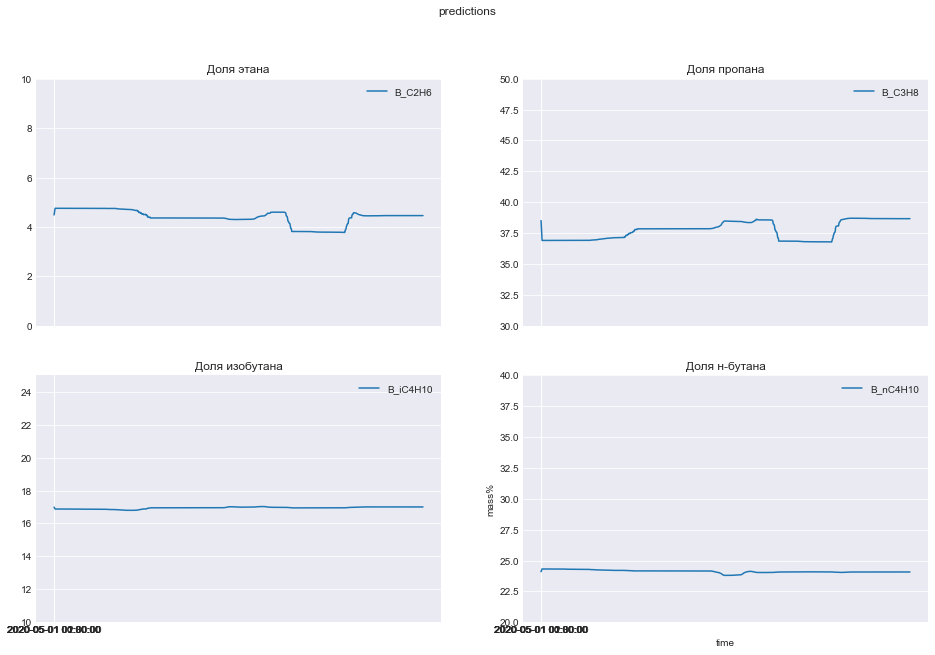

In [148]:
outputSubmission(avgPreds(test_preds, 11, 3984), '550_650_10trend_rf.csv')

drawPreds(avgPreds(test_preds,11,3984), 'predictions')

In [149]:
X_train, X_test, y_train, y_test = train_test_split(df_train_200_1000[train_feats], 
                                                    df_train_200_1000[target_feats], test_size=0.25, random_state=23)

In [91]:
%%time

params = {
    'n_estimators': [50, 100, 200, 300, 500],
    'max_depth': [1,2,3,4,5,6,8],
    'min_samples_split': [2,4,6,8]
}
random_forest = RandomForestRegressor(n_jobs=-1)
gc_cv = GridSearchCV(random_forest, params)
gc_cv.fit(X_train, y_train)
print(gc_cv.best_score_, gc_cv.best_params_)

0.9696721072858505 {'max_depth': 8, 'min_samples_split': 6, 'n_estimators': 100}
Wall time: 3h 2min 46s


In [150]:
for i in range(4):
    rf = RandomForestRegressor(n_estimators=100, max_depth=8, min_samples_split=6,n_jobs=-1)
    rf.fit(X_train, y_train.iloc[:,i])
    y_pred = rf.predict(X_test)
    print(mape(y_test.iloc[:,i], y_pred))

0.686
0.187
0.19
0.283


In [152]:
df_test_200_1000.shape

(67728, 10)

In [154]:
rf = RandomForestRegressor(n_estimators=100, max_depth=8, min_samples_split=6,n_jobs=-1)
rf.fit(df_train_200_1000[train_feats], df_train_200_1000[target_feats])
test_preds = rf.predict(df_test_200_1000[train_feats])

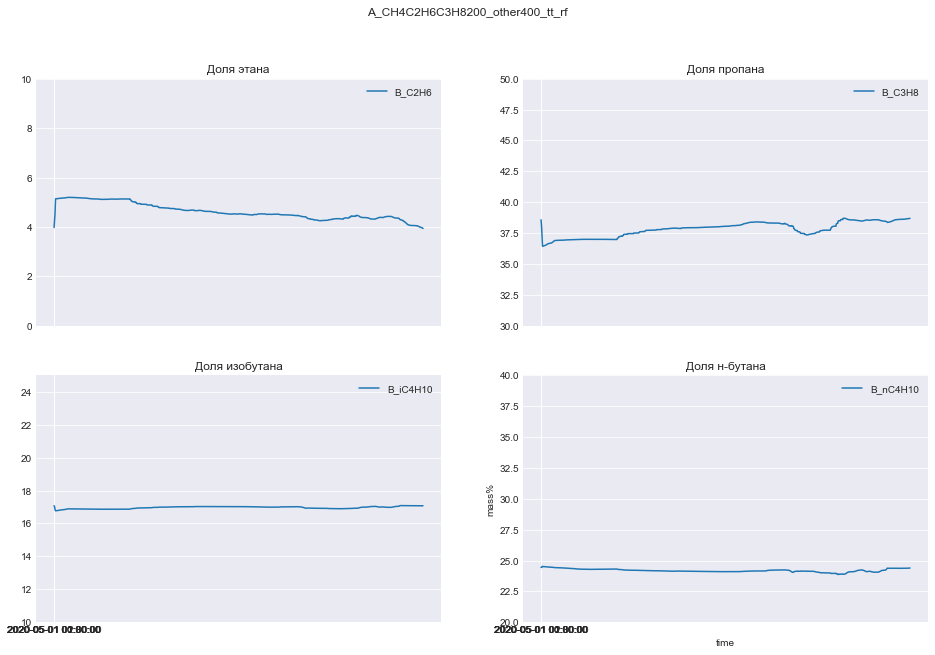

In [155]:
outputSubmission(avgPreds(test_preds, 17, 3984), '200_1000_50trend_rf.csv')

drawPreds(avgPreds(test_preds, 17, 3984), 'A_CH4C2H6C3H8200_other400_tt_rf')

In [157]:
df_train_550_650.shape, df_test_550_650.shape

((63789, 14), (43824, 10))

In [179]:
X_train, X_test, y_train, y_test = train_test_split(df_train_550_650[train_feats], 
                                                    df_train_550_650[target_feats], 
                                                    test_size=0.25, random_state=23, shuffle=False)

Epoch 1/100
1496/1496 [==============================] - 4s 3ms/step - loss: 124.5518 - mean_absolute_percentage_error: 30.7252 - val_loss: 1.0482 - val_mean_absolute_percentage_error: 4.8749
Epoch 2/100
1496/1496 [==============================] - 3s 2ms/step - loss: 9.1835 - mean_absolute_percentage_error: 10.5010 - val_loss: 0.4991 - val_mean_absolute_percentage_error: 3.9446
Epoch 3/100
1496/1496 [==============================] - 4s 2ms/step - loss: 6.7331 - mean_absolute_percentage_error: 9.3358 - val_loss: 0.2723 - val_mean_absolute_percentage_error: 3.3762
Epoch 4/100
1496/1496 [==============================] - 3s 2ms/step - loss: 6.0017 - mean_absolute_percentage_error: 9.0729 - val_loss: 0.1794 - val_mean_absolute_percentage_error: 3.3074
Epoch 5/100
1496/1496 [==============================] - 3s 2ms/step - loss: 5.6087 - mean_absolute_percentage_error: 9.0036 - val_loss: 0.2762 - val_mean_absolute_percentage_error: 3.8212
Epoch 6/100
1496/1496 [============================

1496/1496 [==============================] - 3s 2ms/step - loss: 0.0890 - mean_absolute_percentage_error: 1.9488 - val_loss: 0.0688 - val_mean_absolute_percentage_error: 1.3647
Epoch 88/100
1496/1496 [==============================] - 3s 2ms/step - loss: 0.0896 - mean_absolute_percentage_error: 1.9671 - val_loss: 0.0639 - val_mean_absolute_percentage_error: 1.2820
Epoch 89/100
1496/1496 [==============================] - 3s 2ms/step - loss: 0.0897 - mean_absolute_percentage_error: 1.9566 - val_loss: 0.0684 - val_mean_absolute_percentage_error: 1.4293
Epoch 90/100
1496/1496 [==============================] - 3s 2ms/step - loss: 0.0894 - mean_absolute_percentage_error: 1.9478 - val_loss: 0.0542 - val_mean_absolute_percentage_error: 1.3107
Epoch 91/100
1496/1496 [==============================] - 3s 2ms/step - loss: 0.0896 - mean_absolute_percentage_error: 1.9562 - val_loss: 0.0540 - val_mean_absolute_percentage_error: 1.2619
Epoch 92/100
1496/1496 [==============================] - 3s 2m

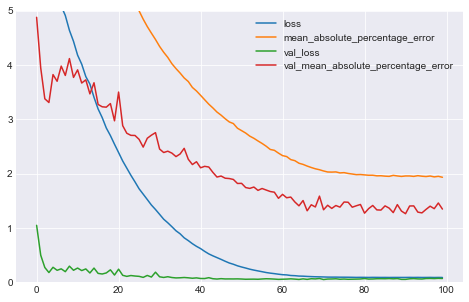

Wall time: 4min 50s


In [181]:
%%time
model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[10]),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(100, activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(100, activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(4)
])

model.compile(optimizer='adam',
              loss='mean_squared_error',
              metrics=['mean_absolute_percentage_error'])

fitted = model.fit(X_train, y_train,
                   epochs=100, validation_data=(X_test, y_test))

pd.DataFrame(fitted.history).plot(figsize=(8,5))
plt.ylim([0,5])
plt.grid(True)
plt.show()

In [182]:
test_preds = model.predict(df_test_550_650[train_feats])

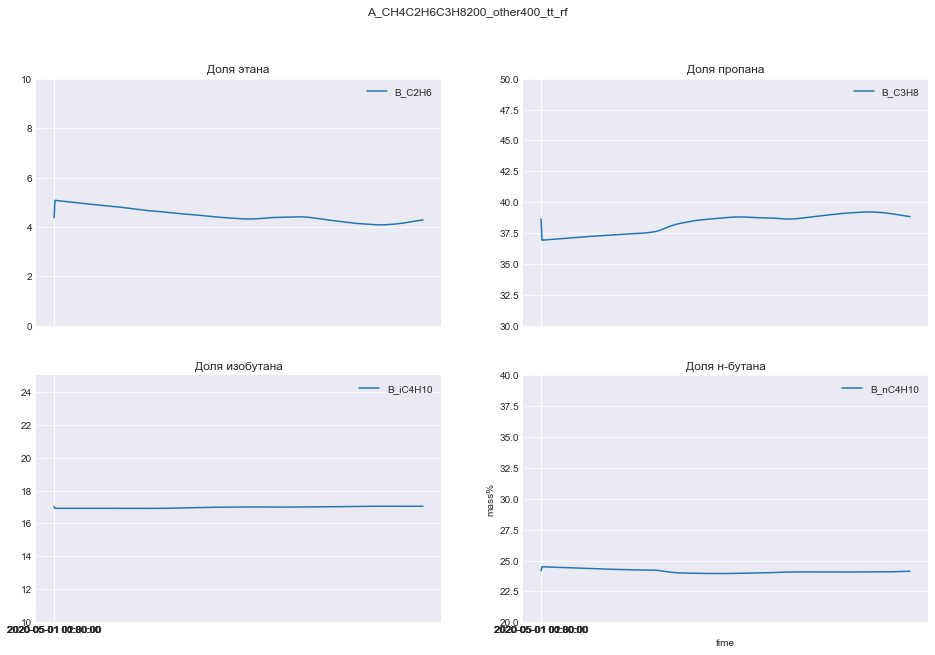

In [183]:
outputSubmission(avgPreds(test_preds, 11, 3984), '550_650_10trend_nn_2h_100_05do_bn_100epochs_shuffle_no.csv')

drawPreds(avgPreds(test_preds, 11, 3984), 'A_CH4C2H6C3H8200_other400_tt_rf')

In [238]:
df_train_550_650.shape[0]/5799

11.0

In [241]:
3984*7

27888

In [240]:
df_test_550_650.values.shape[0]/11

3984.0

In [288]:
df_train_600.shape, df_test_600.shape

((5799, 14), (3984, 10))

In [296]:
5799-3984

1815

In [297]:
X_train = df_train_600[train_feats].iloc[:3984, :].values.reshape((1,3984,10))
y_train = df_train_600[target_feats].iloc[:3984, :].values.reshape((1,3984,4))
X_test = df_train_600[train_feats].iloc[3984:, :].values.reshape((1,1815,10))
y_test = df_train_600[target_feats].iloc[3984:, :].values.reshape((1,1815,4))

In [242]:
X_train = df_train_550_650[train_feats].iloc[:40593, :].values.reshape((7,5799,10))
y_train = df_train_550_650[target_feats].iloc[:40593, :].values.reshape((7,5799,4))
X_test = df_train_550_650[train_feats].iloc[40593:, :].values.reshape((4,5799,10))
y_test = df_train_550_650[target_feats].iloc[40593:, :].values.reshape((4,5799,4))

In [298]:
model = keras.models.Sequential([
    keras.layers.LSTM(128, input_shape=(3984, 10), return_sequences=True),
    keras.layers.Dense(4)
])

In [299]:
model.compile(optimizer='adam',
              loss='mean_squared_error',
              metrics=['mean_absolute_percentage_error'])

In [300]:
model.summary()

Model: "sequential_30"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_8 (LSTM)                (None, 3984, 128)         71168     
_________________________________________________________________
dense_48 (Dense)             (None, 3984, 4)           516       
Total params: 71,684
Trainable params: 71,684
Non-trainable params: 0
_________________________________________________________________


Epoch 1/150
1/1 [==============================] - 0s 109ms/step - loss: 35.2948 - mean_absolute_percentage_error: 16.2460 - val_loss: 27.4631 - val_mean_absolute_percentage_error: 15.5555
Epoch 2/150
1/1 [==============================] - 0s 111ms/step - loss: 34.6542 - mean_absolute_percentage_error: 16.2380 - val_loss: 26.9582 - val_mean_absolute_percentage_error: 15.4597
Epoch 3/150
1/1 [==============================] - 0s 110ms/step - loss: 34.0817 - mean_absolute_percentage_error: 16.1592 - val_loss: 26.4698 - val_mean_absolute_percentage_error: 15.3511
Epoch 4/150
1/1 [==============================] - 0s 107ms/step - loss: 33.5303 - mean_absolute_percentage_error: 16.0571 - val_loss: 25.9986 - val_mean_absolute_percentage_error: 15.2291
Epoch 5/150
1/1 [==============================] - 0s 117ms/step - loss: 33.0012 - mean_absolute_percentage_error: 15.9339 - val_loss: 25.5414 - val_mean_absolute_percentage_error: 15.0987
Epoch 6/150
1/1 [==============================] - 0s 1

Epoch 88/150
1/1 [==============================] - 0s 109ms/step - loss: 9.0718 - mean_absolute_percentage_error: 8.8793 - val_loss: 5.3569 - val_mean_absolute_percentage_error: 8.1561
Epoch 89/150
1/1 [==============================] - 0s 119ms/step - loss: 8.9292 - mean_absolute_percentage_error: 8.8278 - val_loss: 5.2469 - val_mean_absolute_percentage_error: 8.1042
Epoch 90/150
1/1 [==============================] - 0s 111ms/step - loss: 8.7887 - mean_absolute_percentage_error: 8.7752 - val_loss: 5.1386 - val_mean_absolute_percentage_error: 8.0527
Epoch 91/150
1/1 [==============================] - 0s 134ms/step - loss: 8.6504 - mean_absolute_percentage_error: 8.7218 - val_loss: 5.0320 - val_mean_absolute_percentage_error: 8.0017
Epoch 92/150
1/1 [==============================] - 0s 105ms/step - loss: 8.5141 - mean_absolute_percentage_error: 8.6677 - val_loss: 4.9272 - val_mean_absolute_percentage_error: 7.9510
Epoch 93/150
1/1 [==============================] - 0s 108ms/step - lo

Epoch 132/150
1/1 [==============================] - 0s 105ms/step - loss: 4.4995 - mean_absolute_percentage_error: 6.9126 - val_loss: 2.0199 - val_mean_absolute_percentage_error: 6.2164
Epoch 133/150
1/1 [==============================] - 0s 105ms/step - loss: 4.4278 - mean_absolute_percentage_error: 6.8774 - val_loss: 1.9717 - val_mean_absolute_percentage_error: 6.1807
Epoch 134/150
1/1 [==============================] - 0s 121ms/step - loss: 4.3564 - mean_absolute_percentage_error: 6.8428 - val_loss: 1.9232 - val_mean_absolute_percentage_error: 6.1459
Epoch 135/150
1/1 [==============================] - 0s 121ms/step - loss: 4.2844 - mean_absolute_percentage_error: 6.8088 - val_loss: 1.8734 - val_mean_absolute_percentage_error: 6.1126
Epoch 136/150
1/1 [==============================] - 0s 135ms/step - loss: 4.2100 - mean_absolute_percentage_error: 6.7754 - val_loss: 1.8215 - val_mean_absolute_percentage_error: 6.0810
Epoch 137/150
1/1 [==============================] - 0s 100ms/ste

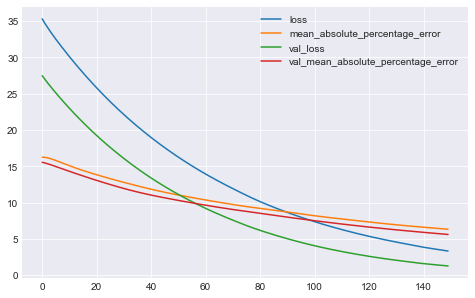

In [315]:
fitted = model.fit(X_train, y_train,
                   epochs=150, validation_data=(X_test, y_test))

pd.DataFrame(fitted.history).plot(figsize=(8,5))
#plt.ylim([0,5])
plt.grid(True)
plt.show()

In [316]:
test_preds = model.predict(df_test_600.values.reshape((1, 3984, 10)))

In [276]:
outputSubmission(avgPreds(test_preds.reshape(43824, 4), 11, 3984), '550_650_10trend_nn_2h_LSTM128_500epochs_shuffle_no.csv')


In [309]:
test_preds.reshape(3984, 4)

array([[ 1.4858788,  7.197545 ,  3.8095524,  4.5365505],
       [ 2.0794146,  9.726491 ,  4.9424944,  6.099222 ],
       [ 2.3075047, 10.373448 ,  5.2705874,  6.541001 ],
       ...,
       [ 2.7974653, 11.206571 ,  5.640433 ,  7.081726 ],
       [ 2.797461 , 11.206552 ,  5.640444 ,  7.081725 ],
       [ 2.797457 , 11.2065325,  5.6404552,  7.081726 ]], dtype=float32)

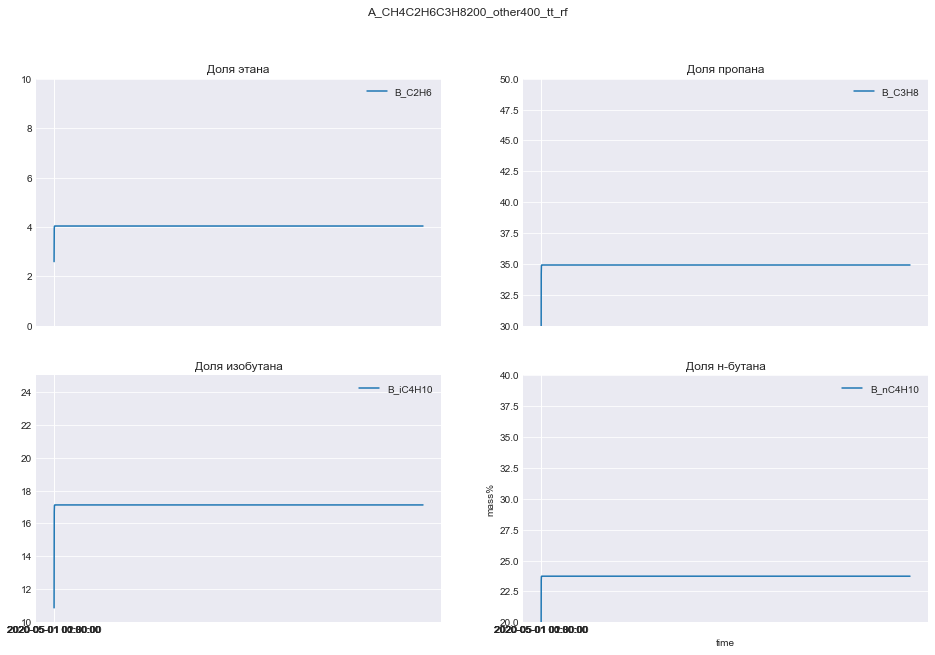

In [317]:
drawPreds(avgPreds(test_preds.reshape(3984, 4), 1, 3984), 'A_CH4C2H6C3H8200_other400_tt_rf')

In [59]:
df_train_600

,A_rate,A_CH4,A_C2H6,A_C3H8,A_iC4H10,A_nC4H10,A_iC5H12,A_nC5H12,A_C6H14,B_rate,B_C2H6,B_C3H8,B_iC4H10,B_nC4H10
0,72.264302,0.148649,4.680807,39.645246,17.256668,23.312744,4.272243,4.171533,5.446426,73.789536,4.641923,38.343787,16.980695,24.156489
1,72.261019,0.148631,4.681038,39.645091,17.257042,23.314822,4.272188,4.171400,5.446201,73.785634,4.641737,38.344641,16.980626,24.155859
2,72.257736,0.148614,4.681269,39.644936,17.257416,23.316901,4.272133,4.171268,5.445977,73.781731,4.641552,38.345495,16.980557,24.155230
3,72.254452,0.148596,4.681499,39.644780,17.257790,23.318980,4.272078,4.171136,5.445753,73.777827,4.641367,38.346348,16.980488,24.154601
4,72.251168,0.148579,4.681729,39.644622,17.258165,23.321060,4.272024,4.171005,5.445529,73.773923,4.641182,38.347200,16.980419,24.153973
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5794,72.108717,0.190325,5.209325,35.994306,16.699540,24.518946,5.706458,5.329210,6.297470,74.178746,5.200684,36.545137,16.948428,24.808639
5795,72.116219,0.190326,5.209255,35.990363,16.698361,24.519622,5.708275,5.331082,6.297854,74.192707,5.200862,36.543634,16.948576,24.810071
5796,72.123721,0.190328,5.209185,35.986420,16.697182,24.520298,5.710091,5.332954,6.298237,74.206670,5.201040,36.542130,16.948724,24.811503
5797,72.131224,0.190330,5.209115,35.982476,16.696003,24.520974,5.711908,5.334827,6.298620,74.220636,5.201218,36.540626,16.948872,24.812935


In [60]:
df_test_600

,A_rate,A_CH4,A_C2H6,A_C3H8,A_iC4H10,A_nC4H10,A_iC5H12,A_nC5H12,A_C6H14,B_rate
0,71.071572,0.308864,5.015919,36.174912,16.435751,23.985972,6.245978,5.483212,6.400337,73.695337
1,71.067972,0.308694,5.015920,36.177685,16.436245,23.985705,6.244614,5.482199,6.399734,73.691392
2,71.064375,0.308524,5.015921,36.180458,16.436740,23.985438,6.243251,5.481185,6.399131,73.687449
3,71.060779,0.308354,5.015922,36.183232,16.437234,23.985171,6.241887,5.480172,6.398527,73.683509
4,71.057185,0.308184,5.015923,36.186005,16.437729,23.984903,6.240523,5.479158,6.397924,73.679570
...,...,...,...,...,...,...,...,...,...,...
3979,72.347543,0.114146,3.928283,40.150190,18.067662,24.345029,4.481943,3.829542,4.605161,74.654039
3980,72.351334,0.114094,3.928160,40.149977,18.067581,24.344824,4.482159,3.829472,4.604929,74.657536
3981,72.355125,0.114041,3.928037,40.149764,18.067501,24.344618,4.482374,3.829402,4.604698,74.661034
3982,72.358917,0.113989,3.927914,40.149550,18.067421,24.344412,4.482590,3.829332,4.604466,74.664534


In [61]:
X_train, X_test, y_train, y_test = train_test_split(df_train_600[train_feats], 
                                                    df_train_600[target_feats], test_size=0.25, random_state=23)

Epoch 1/5
136/136 [==============================] - 0s 2ms/step - loss: 46.3331 - mean_absolute_percentage_error: 50.3701 - val_loss: 0.7516 - val_mean_absolute_percentage_error: 7.9785
Epoch 2/5
136/136 [==============================] - 0s 2ms/step - loss: 0.7706 - mean_absolute_percentage_error: 7.8269 - val_loss: 0.7449 - val_mean_absolute_percentage_error: 7.8148
Epoch 3/5
136/136 [==============================] - 0s 1ms/step - loss: 0.7656 - mean_absolute_percentage_error: 7.8268 - val_loss: 0.7387 - val_mean_absolute_percentage_error: 7.6477
Epoch 4/5
136/136 [==============================] - 0s 1ms/step - loss: 0.7590 - mean_absolute_percentage_error: 7.7550 - val_loss: 0.7336 - val_mean_absolute_percentage_error: 7.6969
Epoch 5/5
136/136 [==============================] - 0s 2ms/step - loss: 0.7525 - mean_absolute_percentage_error: 7.7436 - val_loss: 0.7237 - val_mean_absolute_percentage_error: 7.5569


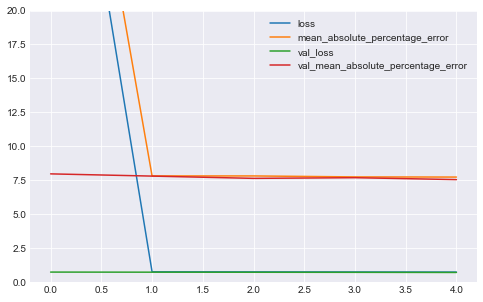

In [76]:
model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[10]),
    keras.layers.Dense(10, activation='relu'),
    #tf.keras.layers.Dropout(0.1),
    keras.layers.Dense(4)
])

model.compile(optimizer='adam',
              loss='mean_squared_error',
              metrics=['mean_absolute_percentage_error'])

fitted = model.fit(X_train, y_train,
                   epochs=5, validation_data=(X_test, y_test))

pd.DataFrame(fitted.history).plot(figsize=(8,5))
plt.ylim([0,20])
plt.grid(True)
plt.show()

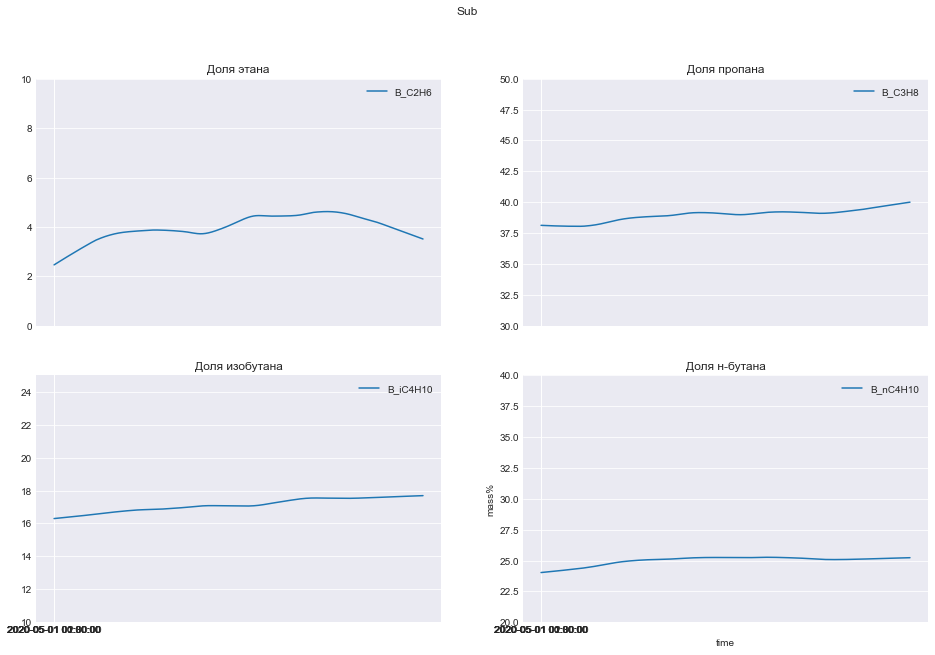

In [77]:
test_preds = model.predict(df_test_600[train_feats])

outputSubmission(test_preds, 'CutOutliers_all600_tt_nn_5epochs_10ns_nodo_adam.csv')

drawPreds(test_preds, 'Sub')

In [83]:
X_train, X_test, y_train, y_test = train_test_split(df_train_610[train_feats], 
                                                    df_train_610[target_feats], test_size=0.25, random_state=23)

Epoch 1/150
136/136 [==============================] - 0s 2ms/step - loss: 109.1178 - mean_absolute_percentage_error: 49.3179 - val_loss: 0.7668 - val_mean_absolute_percentage_error: 5.4043
Epoch 2/150
136/136 [==============================] - 0s 2ms/step - loss: 14.7682 - mean_absolute_percentage_error: 24.1144 - val_loss: 0.9225 - val_mean_absolute_percentage_error: 5.6235
Epoch 3/150
136/136 [==============================] - 0s 3ms/step - loss: 11.3553 - mean_absolute_percentage_error: 20.2412 - val_loss: 0.6966 - val_mean_absolute_percentage_error: 5.1496
Epoch 4/150
136/136 [==============================] - 0s 2ms/step - loss: 9.0661 - mean_absolute_percentage_error: 17.1455 - val_loss: 0.6962 - val_mean_absolute_percentage_error: 4.9644
Epoch 5/150
136/136 [==============================] - 0s 2ms/step - loss: 7.6396 - mean_absolute_percentage_error: 15.0484 - val_loss: 0.5623 - val_mean_absolute_percentage_error: 4.6246
Epoch 6/150
136/136 [==============================] - 0

136/136 [==============================] - 0s 2ms/step - loss: 2.7643 - mean_absolute_percentage_error: 6.4362 - val_loss: 0.1578 - val_mean_absolute_percentage_error: 2.5983
Epoch 45/150
136/136 [==============================] - 0s 1ms/step - loss: 2.8142 - mean_absolute_percentage_error: 6.4229 - val_loss: 0.2454 - val_mean_absolute_percentage_error: 2.8820
Epoch 46/150
136/136 [==============================] - 0s 1ms/step - loss: 2.7577 - mean_absolute_percentage_error: 6.3864 - val_loss: 0.4533 - val_mean_absolute_percentage_error: 4.3638
Epoch 47/150
136/136 [==============================] - 0s 2ms/step - loss: 2.7185 - mean_absolute_percentage_error: 6.3691 - val_loss: 0.1399 - val_mean_absolute_percentage_error: 2.4639
Epoch 48/150
136/136 [==============================] - 0s 2ms/step - loss: 2.6225 - mean_absolute_percentage_error: 6.2669 - val_loss: 0.3473 - val_mean_absolute_percentage_error: 2.9763
Epoch 49/150
136/136 [==============================] - 0s 2ms/step - los

Epoch 88/150
136/136 [==============================] - 0s 2ms/step - loss: 2.1904 - mean_absolute_percentage_error: 5.5539 - val_loss: 0.3762 - val_mean_absolute_percentage_error: 3.1231
Epoch 89/150
136/136 [==============================] - 0s 1ms/step - loss: 2.2249 - mean_absolute_percentage_error: 5.4877 - val_loss: 0.1996 - val_mean_absolute_percentage_error: 2.2892
Epoch 90/150
136/136 [==============================] - 0s 1ms/step - loss: 2.2039 - mean_absolute_percentage_error: 5.4529 - val_loss: 0.1720 - val_mean_absolute_percentage_error: 2.0320
Epoch 91/150
136/136 [==============================] - 0s 2ms/step - loss: 2.1708 - mean_absolute_percentage_error: 5.4406 - val_loss: 0.1158 - val_mean_absolute_percentage_error: 2.1166
Epoch 92/150
136/136 [==============================] - 0s 1ms/step - loss: 2.2384 - mean_absolute_percentage_error: 5.5397 - val_loss: 0.1620 - val_mean_absolute_percentage_error: 2.3365
Epoch 93/150
136/136 [==============================] - 0s 2

136/136 [==============================] - 0s 2ms/step - loss: 2.0652 - mean_absolute_percentage_error: 5.2775 - val_loss: 0.1107 - val_mean_absolute_percentage_error: 2.2943
Epoch 132/150
136/136 [==============================] - 0s 2ms/step - loss: 1.9849 - mean_absolute_percentage_error: 5.2467 - val_loss: 0.1477 - val_mean_absolute_percentage_error: 2.2386
Epoch 133/150
136/136 [==============================] - 0s 2ms/step - loss: 2.0043 - mean_absolute_percentage_error: 5.1867 - val_loss: 0.1090 - val_mean_absolute_percentage_error: 2.1100
Epoch 134/150
136/136 [==============================] - 0s 2ms/step - loss: 1.8660 - mean_absolute_percentage_error: 5.1481 - val_loss: 0.1440 - val_mean_absolute_percentage_error: 2.2308
Epoch 135/150
136/136 [==============================] - 0s 2ms/step - loss: 1.8758 - mean_absolute_percentage_error: 5.0527 - val_loss: 0.1308 - val_mean_absolute_percentage_error: 2.3821
Epoch 136/150
136/136 [==============================] - 0s 2ms/step 

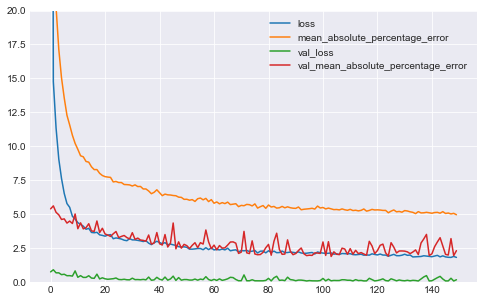

In [86]:
model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[10]),
    keras.layers.Dense(100, activation='relu'),
    tf.keras.layers.Dropout(0.1),
    keras.layers.Dense(4)
])

model.compile(optimizer='adam',
              loss='mean_squared_error',
              metrics=['mean_absolute_percentage_error'])

fitted = model.fit(X_train, y_train,
                   epochs=150, validation_data=(X_test, y_test))

pd.DataFrame(fitted.history).plot(figsize=(8,5))
plt.ylim([0,20])
plt.grid(True)
plt.show()

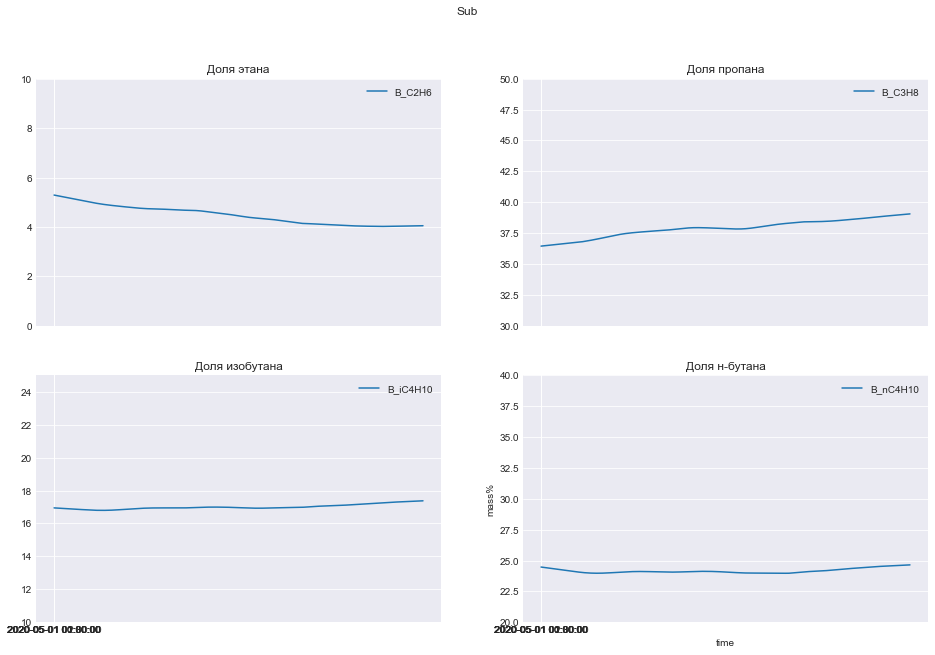

In [87]:
test_preds = model.predict(df_test_590[train_feats])

outputSubmission(test_preds, 'CutOutliers_all610_tt_nn_150epochs_100ns_do01_adam.csv')

drawPreds(test_preds, 'Sub')

In [91]:
y_pred=[]
for i in range(4):
    xgb=XGBRegressor()
    xgb.fit(df_train_200[train_feats], df_train_200[target_feats].iloc[:,i])
    y_pred = xgb.predict(df_test_200[train_feats])
    sample_sub[target_feats].iloc[:,i] = y_pred

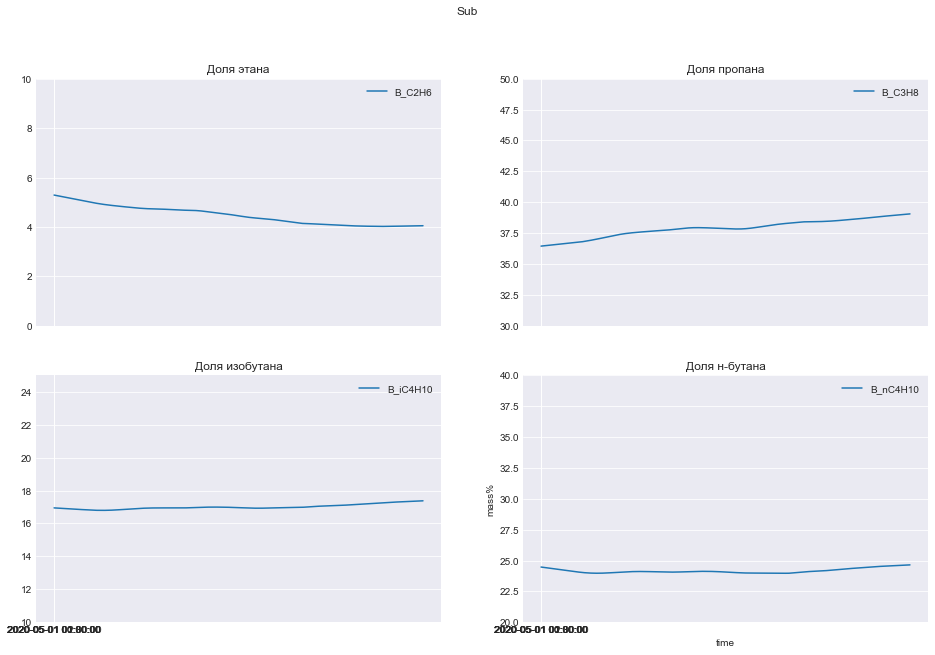

In [92]:
drawPreds(sample_sub[target_feats], 'Sub')

In [93]:
outputSubmission(sample_sub[target_feats], 'CutOutliers_all200_tt_xgboost.csv')